In [1]:
import sklearn
import numpy
import math
import time
print('The scikit-learn verison is {}.'.format(sklearn.__version__))
print('The numpy versions i {}.'.format(numpy.__version__))
# lt. Paper: Imbalanced-learn: A Python Toolbox to Tackle the Curse of Imbalanced Datasets in 
# Machine Learning ist nur RandomOverSampler für den Multi-class-Fall anwendbar
from imblearn.over_sampling import RandomOverSampler, SMOTE, ADASYN, KMeansSMOTE, SVMSMOTE

import numpy as np
from numpy import mean, std
import matplotlib.pyplot as plt

from sklearn.svm import SVC
from sklearn.svm import LinearSVC
#from sklearn.multiclass import OneVsRestClassifier

from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import RepeatedStratifiedKFold
from sklearn.model_selection import StratifiedKFold

from sklearn.model_selection import cross_val_score
from sklearn.model_selection import validation_curve
from sklearn.model_selection import learning_curve
from sklearn.model_selection import ShuffleSplit

from sklearn.pipeline import Pipeline

from sklearn.preprocessing import StandardScaler


from sklearn.metrics import classification_report, confusion_matrix

from sklearn.metrics import make_scorer
from sklearn.metrics import f1_score, precision_score, recall_score, roc_auc_score
from sklearn.metrics import average_precision_score
from sklearn.metrics import precision_recall_fscore_support
from sklearn.metrics import accuracy_score, balanced_accuracy_score 

from sklearn.metrics import cohen_kappa_score
from sklearn.metrics import auc
from sklearn.metrics import roc_curve, precision_recall_curve

from sklearn.preprocessing import LabelBinarizer

from sklearn.utils import shuffle
from sklearn.utils.multiclass import unique_labels

from skimage import exposure, feature, transform
import pickle as pkl
from sklearn.decomposition import PCA

from itertools import product
from itertools import cycle

import seaborn as sns

import time
import timeit
from timeit import default_timer as timer

import warnings
warnings.filterwarnings("ignore", category=DeprecationWarning)
%matplotlib inline

import csv
import pandas as pd
# zum Visualisieren der Daten mithilfe von PCA
from mpl_toolkits.mplot3d import Axes3D

# jupyter notebooks als Module importieren
!pip install import-ipynb
import import_ipynb
import save_load
from save_load import load_hog_features, load_vgg16_features, load_labels, save_trained_model_as_pkl, load_trained_model_from_pkl, save_as_csv, read_csv, make_subsets_training_data_A
import tools
from tools import roc_auc_score_multiclass, roc_auc_score_single_class, scale_train_test_data, scale_train_test_data_without_std, scale_train_test_data_without_mean

The scikit-learn verison is 0.21.3.
The numpy versions i 1.15.4.


Using TensorFlow backend.


In [38]:
#def load_hog_features(path_train):
 #   X_hog = np.load(path_train)
  #  return X_hog

#def load_labels(path_train):
 #   y_label = np.load(path_train)
  #  return y_label

'''
speichert trainierte Modelle bzw. Ergebnisse wiederholter Grid Search Anwendungen als Pickle-Datei.
Diese gespeicherten Modelle können mit Funktion   load_trained_model_from_pkl(name)
'''

#def save_trained_model_as_pkl(model, filename):
 #   with open(filename, 'wb') as file:
  #      pkl.dump(model, file)  
        
'''
lädt bereits trainiertes, als Pickle-Datei gespeichertes Modell bzw. Ergebnisse wiederholter
Grid Search Anwendungen
'''
#def load_trained_model_from_pkl(filename):
 #   with open(filename, 'rb') as file:
  #      new_model=pkl.load(file)
   # return new_model

'''
speichern und lesen von CSV-Dateien
'''
#def save_as_csv(list,path,name):
 #   path = path+name    
  #  with open(path, "w") as file:
   #     csv_wr = csv.writer(file)
    #    csv_wr.writerows(list)
        
#def read_csv(path):
 #   read_file = []
  #  with open(path, "r") as file:
   #     csv_r = csv.reader(file)
    #    for row in csv_r:
     #       if row:
      #          read_file.append(row)
    #return read_file

In [39]:
# in Anlehnung an:   https://medium.com/@plog397/auc-roc-curve-scoring-function-for-multi-class-classification-9822871a6659
#def roc_auc_score_multiclass(y_test, y_pred, average='macro'):    
 #   labelBin = LabelBinarizer()
  #  labelBin.fit(y_test)    
  #  y_test = labelBin.transform(y_test)
  #  y_pred = labelBin.transform(y_pred)
  #  return roc_auc_score(y_test, y_pred, average=average)

In [4]:
'''
Roc_Auc_score für die einzelnen Klassen berechnen
'''
#def roc_auc_score_single_class(y_test, y_pred, average = "macro"):
 #   # Menge der einzelnen Klassen erstellen
  #  single_classes = set(y_test)
   # roc_aucs = {}
    #for cl in single_classes:
     #   #Liste der restlichen Klassen erstellen
      #  remain_classes = [x for x in single_classes if x != cl]

       # # aktuelle Klasse mit 1 markieren und alle anderen Klassen mit 0
       # y_test_roc = [0 if x in remain_classes else 1 for x in y_test]
       # y_pred_roc = [0 if x in remain_classes else 1 for x in y_pred]

        ## roc_auc_score berechnen
        #roc_auc = roc_auc_score(y_test_roc, y_pred_roc, average = average)
        #roc_aucs[cl] = roc_auc

    #return roc_aucs

#lr_roc_auc_multiclass = roc_auc_score_single_class(y_test, pred)
#print(lr_roc_auc_multiclass)

In [5]:
def plot_confusion_matrix_norm(y_test, y_pred, title):        
    classes = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18',
              '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35',
              '36','37','38','39','40','41','42']    
    cm = confusion_matrix(y_test, y_pred)    
    np.set_printoptions(precision=3)    
    #plt.figure(figsize=(4.5*2, 2.5*2))
    #plt.figure(figsize=(9*2, 5*2))
    #plt.figure(figsize=(13.5*2, 7.5*2))
    
    fig = plt.figure(figsize=(18*2, 10*2))
    #fig.suptitle('Confusion matrix ', fontsize=20, fontweight='medium')
    normalize=True    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix  '+title, fontsize=28)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 1.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):            
    #for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label', fontsize=24)
    plt.xlabel('Predicted label', fontsize=24)
    plt.tight_layout()
    plt.show()
    return fig

In [6]:
# Classification report ausgeben
def classif_report(y_te, y_pred):    
    print(classification_report(y_te, y_pred))   

In [7]:
'''
erstellen unterschiedlicher Trainingsmengen aus 39.209 Trainingsdaten
Datensätze werden zufällig aber reproduzierbar durch random_state=0
unter Berücksichtigung der prozentualen Anteile der Daten in den
einzelnen Klassen, erstellt.
Tracks werden nicht berücksichtigt
'''
#def make_training_subsets_A(X_tr, y_tr):
 #   # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
  #  X_tr, y_tr = shuffle(X_tr, y_tr, random_state=42)    
   # # Trainingsmenge mit 20.000 Bilder erzeugen
   # X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
    #    X_tr, y_tr, random_state = 0, train_size=20000/39209, stratify=y_tr)
    ## Trainingsmenge mit 10.000 Bilder erzeugen
   # X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
    #    X_tr_20000, y_tr_20000, random_state = 0, train_size=1/2, stratify=y_tr_20000)
    ## Trainingsmenge mit 5.000 Bilder erzeugen   
    #X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
     #   X_tr_10000, y_tr_10000, random_state = 0, train_size=1/2, stratify=y_tr_10000)
    # #Trainingsmenge mit 2.000 Bilder erzeugen   
    #X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
     #   X_tr_5000, y_tr_5000, random_state = 0, train_size=2/5, stratify=y_tr_5000)
    # #Trainingsmenge mit 1.000 Bilder erzeugen   
    #X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
     #   X_tr_2000, y_tr_2000, random_state = 0, train_size=1/2, stratify=y_tr_2000)
    ## Trainingsmenge mit 500 Bilder erzeugen   
    #X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
     #   X_tr_1000, y_tr_1000, random_state = 0, train_size=1/2, stratify=y_tr_1000)
    ## Trainingsmenge mit 200 Bilder erzeugen   
    #X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
     #   X_tr_500, y_tr_500, random_state = 0, train_size=2/5, stratify=y_tr_500)
    #return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200
    

In [8]:
def plot_confusion_matrix_norm(y_test, y_pred, title):        
    classes = ['0','1','2','3','4','5','6','7','8','9','10','11','12','13','14','15','16','17','18',
              '19','20','21','22','23','24','25','26','27','28','29','30','31','32','33','34','35',
              '36','37','38','39','40','41','42']    
    cm = confusion_matrix(y_test, y_pred)    
    np.set_printoptions(precision=3)    
    #plt.figure(figsize=(4.5*2, 2.5*2))
    #plt.figure(figsize=(9*2, 5*2))
    #plt.figure(figsize=(13.5*2, 7.5*2))
    
    fig = plt.figure(figsize=(18*2, 10*2))
    #fig.suptitle('Confusion matrix ', fontsize=20, fontweight='medium')
    normalize=True    
    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]
        #print("Normalized confusion matrix")
    else:
        print('Confusion matrix, without normalization')
    plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
    plt.title('Confusion matrix  '+title, fontsize=28)
    plt.colorbar()
    tick_marks = np.arange(len(classes))
    plt.xticks(tick_marks, classes, rotation=45)
    plt.yticks(tick_marks, classes)

    fmt = '.2f' if normalize else 'd'
    thresh = cm.max() / 1.5
    for i in range(cm.shape[0]):
        for j in range(cm.shape[1]):            
    #for i, j in product(range(cm.shape[0]), range(cm.shape[1])):
            plt.text(j, i, format(cm[i, j], fmt),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
    plt.ylabel('True label', fontsize=24)
    plt.xlabel('Predicted label', fontsize=24)
    plt.tight_layout()
    plt.show()
    return fig

In [9]:
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
'''
#def scale_train_test_data(X_tr, X_te):
 #   scaler = StandardScaler()
  #  scaler.fit(X_tr)
   # X_tr_trans = scaler.transform(X_tr)
    #X_te_trans = scaler.transform(X_te)
    #return X_tr_trans, X_te_trans

In [10]:
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
#def scale_train_test_data_without_std(X_tr, X_te):
 #   scaler = StandardScaler(with_std=False)
  #  scaler.fit(X_tr)
   # X_tr_trans = scaler.transform(X_tr)
    #X_te_trans = scaler.transform(X_te)
    #return X_tr_trans, X_te_trans

In [11]:
'''
Trainings- und Testdaten mit dem StandardScaler skalieren
ohne std
'''
#def scale_train_test_data_without_mean(X_tr, X_te):
 #   scaler = StandardScaler(with_mean=False)
  #  scaler.fit(X_tr)
   # X_tr_trans = scaler.transform(X_tr)
    #X_te_trans = scaler.transform(X_te)
    #return X_tr_trans, X_te_trans

In [12]:
'''
Oversampling der Minderheitsklasse
'''
def make_smote_minority(X, y):
    smote = SMOTE('minority', k_neighbors=1, random_state=0)
    X_smote, y_smote = smote.fit_sample(X,y)
    return X_smote, y_smote    

In [41]:
'''
SVC mit RBG Kernel trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
                                    wenn scale=3 dann skalieren ohne mean
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE mit minority

class_weight:    class_weight='balanced', class_weight=None
'''
'''
SVC mit RBF-Kernel trainieren, mit StandardScaler
'''
def train_RBF_SVC(X_tr, X_te, y_tr, y_te, seed, number, C, gamma, scale, smote, decision_function, 
                  class_weight, front_path, end_path, feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/rbf/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
    
     # Trainings- und Testdaten skalieren
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
    if scale == 3:
        print("Daten skalieren ohne mean")
        scale_train_test_data_without_mean(X_tr, X_te)
        
    #if smote == 1:
     #   print("Smote minority")
      #  X_tr, y_tr = make_smote_minority(X_tr, y_tr)
 
    # SVC mit den skalierten Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    #rbfSVC = SVC(C=C, gamma='auto_deprecated')
    rbfSVC = SVC(C=C, gamma=gamma, class_weight=class_weight, decision_function_shape= decision_function, random_state=seed)
    rbfSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
                
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(rbfSVC, path+"RBF_SVC_"+number+"_"+feature)    
                              
    # Vorhersage machen und speichern
    y_pred = rbfSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro') 
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(SVC rbf '+number+' C='+str(C)+')'    
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)       
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = rbfSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
    
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, "precision_recall_fscore.csv")
        

In [14]:
'''
LinearSVC trainieren
seed = Saatpunkt für Numpy-Zufallsgenerator
number = Anzahl der Trainingsdaten
C = Wert des Parameters C
scale = Daten skalieren oder nicht, wenn scale=0 dann nicht skalieren
                                    wenn scale=1 dann skalieren ohne std
                                    wenn scale=2 dann skalieren mit std
smote = 0, dann ohne SMOTE
smote = 1, dann mit SMOTE

class_weight:    class_weight='balanced', class_weight=None
'''
def train_LinearSVC(X_tr, X_te, y_tr, y_te, seed, number, C, scale, smote, class_weight, front_path, end_path,feature):
    # Seed-Punkt setzen für Reproduzierbarkeit
    #seed = seed
    #np.random.seed(seed)
    # Pfad für speichern des Modells, Confusion matrix, Metriken
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random 0/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random B/1terDL/"
    #path = "SVM_Modelle_FM/Hog_default/LinearSVC/"+number+"/NEU seed 7 random C/1terDL/"
    path = front_path+"/"+number+"/"+end_path+"/"
    # Liste in welcher die berechneten Metriken gespeichert werden
    metrics = []
    # Liste für Trainingszeiten
    time_list = []
    #Liste für Testzeiten
    time_list_test = []
    
    if smote == 1:
        print("Smote minority")
        X_tr, y_tr = make_smote_minority(X_tr, y_tr)
       
    if scale == 1:
        print("Daten skalieren ohne std")
        X_tr, X_te = scale_train_test_data_without_std(X_tr, X_te)
    if scale == 2:
        print("Daten skalieren")
        X_tr, X_te = scale_train_test_data(X_tr, X_te)
        
    # LinearSVC mit den Daten trainieren und speichern
    start = time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    
    linSVC = LinearSVC(C=C, loss='hinge', class_weight=class_weight, random_state=seed)
    linSVC.fit(X_tr, y_tr)
    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
            
    end_per_sample = end/int(number)
    end2_per_sample = end2/int(number)
    end3_per_sample = end3/int(number)
    # Trainingszeiten speichern
    time_list.append([end,end2,end3])    
    time_list.append([end_per_sample, end2_per_sample, end3_per_sample])
    save_as_csv(time_list, path, 'Trainingszeiten.csv')
    
    # trainiertes Modell speichern
    save_trained_model_as_pkl(linSVC, path+"LinearSVC_"+number+"_"+feature)      
                              
    # Vorhersage machen und speichern
    y_pred = linSVC.predict(X_te)    
    np.save(path+"y_pred_label.npy", y_pred) 
    # zusätzlich Label der Testdaten speichern, auch wenn eigentlich überflüssig
    np.save(path+"y_test_label.npy", y_te)
                                  
    # Metriken berechnen und speichern                          
    acc = accuracy_score(y_te, y_pred)                  
    prec = precision_score(y_te, y_pred, average='macro')    
    rec = recall_score(y_te, y_pred, average='macro')   
    f1 = f1_score(y_te, y_pred, average='macro')
    roc = roc_auc_score_multiclass(y_te, y_pred, average='macro')
    kappa = cohen_kappa_score(y_te, y_pred)
    metrics.append([acc,prec,rec,f1,roc,kappa])
    save_as_csv(metrics,path,'metrics.csv')  
    
    roc_single_class = roc_auc_score_single_class(y_te, y_pred, average='macro')
    np.save(path+"roc_auc_score_single_class.npy", roc_single_class)
    
    # Confusion Matrix erstellen und speichern
    title = '(LinearSVC '+number+' C='+str(C)+')'
    cm = plot_confusion_matrix_norm(y_te, y_pred, title)     
    cm.savefig(path+"Confusion_matrix.png")    
    
    # Performanz mit Testdaten testen und Klassifikationszeit speichern
    start4 = time.time()
    start5 = time.process_time()
    start6 = time.perf_counter()
    test_acc = linSVC.score(X_te, y_te)
    end4 = time.time()-start4
    end5 = time.process_time()-start5
    end6 = time.perf_counter()-start6
    end4_per_sample = end4/int(number)
    end5_per_sample = end5/int(number)
    end6_per_sample = end6/int(number)
    # Klassifikationszeiten speichern
    time_list_test.append([end4,end5,end6])    
    time_list_test.append([end4_per_sample, end5_per_sample, end6_per_sample])
    save_as_csv(time_list_test, path, 'Testzeiten.csv')
    print("Test accuracy: ",test_acc,'\n')
    
    # Klassifikationsreport erstellen und speichern
    classif_report(y_te, y_pred)
        
    # precision, recall und f-Score pro Klasse speichern
    save_as_csv(precision_recall_fscore_support(y_te, y_pred), path, 'precision_recall_fscore.csv')      

In [15]:
'''
Tuning der Hyperparameter mit GridSearchCV 

Mit refit=True (Standardeinstellung) wird der beste Estimator, welcher über 
die Kreuzvalidierung gefunden wurde, zusätzlich mit dem gesamten
Trainingsdatensatz trainiert 
'''
def tuning_hyper_params(X, y, X_test, y_test, kernel='LinearSVC', cv=3,
                        scaler=0, pca=0,
                        c_range=np.logspace(-16,10,14, base=2), 
                        gamma_range=np.logspace(-16,4,11, base=2),                       
                        seed=1):
    # extra nochmal seed für np.random setzen, z.B. auch StratifiedKFold ein
    # random_state verwendet wird
    seed = seed
    np.random.seed(seed)    
    start=time.time()
    start2 = time.process_time()
    start3 = time.perf_counter()
    time_list = [] # Zeit für GridSearch
    
    scoring = {'Precision': make_scorer(precision_score, average='macro'),
               'Recall': make_scorer(recall_score, average='macro'),
               'F1': make_scorer(f1_score, average='macro'),
               'acc': make_scorer(accuracy_score),
               'roc': make_scorer(roc_auc_score_multiclass, average='macro')} 
                  
    if kernel == 'LinearSVC':
        if scaler == 0:
            pipeline = Pipeline([
                ("svm", LinearSVC(loss='hinge', class_weight='balanced', random_state=seed))])
        if scaler == 1:
            pipeline = Pipeline([
                ("scaler", StandardScaler(with_std=False)),
                ("svm", LinearSVC(loss='hinge', class_weight='balanced', random_state=seed))
            ])
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", LinearSVC(loss='hinge', class_weight='balanced', random_state=seed))
            ])          
                        
        param_grid=[{'svm__C': c_range}]
                        
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)                
                               
        print('\n C_range:', c_range)
        print('\n Bester Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)            
                        
    elif kernel == 'rbf':
        if scaler == 2:
            pipeline = Pipeline([
                ("scaler", StandardScaler()),
                ("svm", SVC(decision_function_shape='ovo', class_weight="balanced", random_state=seed))])
                              
        param_grid=[{'svm__C': c_range, 'svm__gamma': gamma_range}]
        clf = GridSearchCV(pipeline, param_grid=param_grid, cv=cv, scoring=scoring, refit='F1', n_jobs=-1)
        clf.fit(X,y)        
        print('\n C_range: ', c_range)
        print('\n gamma_range:', gamma_range)
        print('\n Beste Score: ',clf.best_score_)
        print('\n Besten Parameter: ', clf.best_params_)   

    end = time.time()-start
    end2 = time.process_time()-start2
    end3 = time.perf_counter()-start3
    time_list.append([end,end2,end3])
    
    print("Bester Estimator score: ",clf.best_estimator_.score(X_test, y_test))            
       
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Precision'],
                              clf.cv_results_['std_test_Precision'],
                              clf.cv_results_['params']):
        print("Precision-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_Recall'], 
                              clf.cv_results_['std_test_Recall'],clf.cv_results_['params']):
        print("Recall-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_F1'], 
                              clf.cv_results_['std_test_F1'],clf.cv_results_['params']):
        print("F1-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))
        
    for mean, stdev, param in zip(clf.cv_results_['mean_test_acc'], clf.cv_results_['std_test_acc'],
                              clf.cv_results_['params']):
        print("Accuracy-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))  
                
    for mean, stdev, param in zip(clf.cv_results_['mean_test_roc'],clf.cv_results_['std_test_roc'],
                              clf.cv_results_['params']):
        print("Roc-Score: %f (%f) mit Parameter: %r" % (mean, stdev, param))    
    return clf, time_list


'''
Verfeinerten Suchbereich für gefundenen Parameter bestimmen
Schrittweite 1/4 im Exponenten, d.h. wenn z.B. 8 der gefundene Parameter ist,
np.log2(8) = 3    ---> np.logspace(1,5,17,base=2)
'''
def get_finer_range(number):
    exp = np.log2(number) #Exponent bestimmen, Basis 2
    range = np.logspace(exp-2, exp+2, 17, base=2)
    return range

In [16]:
# Trainingsdaten, Bounding Box laden
X_train_9_4_2 = load_hog_features("GTSRB_Data/GTSRB_HOG_Features_BB_9_4_2.npy")
X_test_9_4_2 = load_hog_features("GTSRB_Data/GTSRB_HOG_Features_Test_BB_9_4_2.npy")
# Label laden
y_train = load_labels("GTSRB_Data/GTSRB_training_label.npy")
y_test = load_labels("GTSRB_Data/GTSRB_test_label.npy")

In [17]:
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200 = make_training_subsets_A(X_train_9_4_2, y_train)

In [27]:
X_train_9_4_2.shape

(39209, 2916)

In [30]:
X_train_9_4_2[1000].shape

(2916,)

In [ ]:
###########################################################################################
##########    LinearSVC, HOG, seed=1, random_A, without scaler    GridSearch    ###########
###########################################################################################

In [31]:
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.736557924450151

 Besten Parameter:  {'svm__C': 4.0}
Bester Estimator score:  0.8144893111638954
Precision-Score: 0.241154 (0.086406) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.241154 (0.086406) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.241154 (0.086406) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.355776 (0.082052) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.579923 (0.096599) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.667204 (0.100875) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.684120 (0.100914) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.729120 (0.102398) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.735521 (0.125040) mit Parameter: 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.8684595115956002

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.8737133808392715
Precision-Score: 0.206669 (0.037006) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.206669 (0.037006) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.268058 (0.034271) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.575545 (0.048527) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.721248 (0.063603) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.772304 (0.044679) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.789651 (0.034448) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.848257 (0.041810) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.872043 (0.056859) mit Parameter:

In [32]:
# 2. DL
print('********************************************************************************')
print(' GridSearch 500 2. DL: ')
print('')
clf_500_lin, time_500_lin = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(4.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_500_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/500/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
print('')

clf_1000_lin, time_1000_lin = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_1000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/1000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
print('')

clf_2000_lin, time_2000_lin = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_2000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_2000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/2000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 500 2. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [ 1.          1.18920712  1.41421356  1.68179283  2.          2.37841423
  2.82842712  3.36358566  4.          4.75682846  5.65685425  6.72717132
  8.          9.51365692 11.3137085  13.45434264 16.        ]

 Bester Score:  0.7410263069966968

 Besten Parameter:  {'svm__C': 1.189207115002721}
Bester Estimator score:  0.8216943784639746
Precision-Score: 0.735521 (0.125040) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.742903 (0.127790) mit Parameter: {'svm__C': 1.189207115002721}
Precision-Score: 0.737621 (0.129757) mit Parameter: {'svm__C': 1.4142135623730951}
Precision-Score: 0.738317 (0.129407) mit Parameter: {'svm__C': 1.681792830507429}
Precision-Score: 0.742295 (0.124668) mit Parameter: {'svm__C': 2.0}
Precision-Score: 0.742008 (0.121890) mit Parameter: {'svm__C': 2.378414230005442}
Precision-Score: 0.741479 (0.121900) mit Parameter: {'svm__C': 2.8284271247461903}
Precision-Score: 0.742382 (0.123454) mit Parameter: {'svm__C': 3.363585661014858}
Precision-Score: 0.7

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range: [0.25       0.29730178 0.35355339 0.42044821 0.5        0.59460356
 0.70710678 0.84089642 1.         1.18920712 1.41421356 1.68179283
 2.         2.37841423 2.82842712 3.36358566 4.        ]

 Bester Score:  0.8684595115956002

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.8737133808392715
Precision-Score: 0.848257 (0.041810) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.847409 (0.035247) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.850532 (0.036528) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.855017 (0.035524) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.859396 (0.050394) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.860670 (0.051232) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.858141 (0.057596) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.867407 (0.064584) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.872043 (0.056859) mit Par

In [33]:
# 1. DL
print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
print('')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 1. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 1. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_1DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 5000 1. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.9643168913612877

 Besten Parameter:  {'svm__C': 4.0}
Bester Estimator score:  0.920110847189232
Precision-Score: 0.202467 (0.003868) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.438174 (0.012838) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.777414 (0.037631) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.836293 (0.018081) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.871155 (0.025599) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.886546 (0.021995) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.921152 (0.018652) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.953484 (0.014640) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.969658 (0.012442) mit Parameter: 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.9770839777447603

 Besten Parameter:  {'svm__C': 4.0}
Bester Estimator score:  0.9382422802850356
Precision-Score: 0.420703 (0.001666) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.837051 (0.008775) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.848152 (0.008873) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.881311 (0.005641) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.898235 (0.003181) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.923960 (0.001892) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.950703 (0.002426) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.966959 (0.005251) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.974236 (0.001704) mit Parameter:

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 Bester Score:  0.9409042315474183

 Besten Parameter:  {'svm__C': 1.0}
Bester Estimator score:  0.944972288202692
Precision-Score: 0.572649 (0.008328) mit Parameter: {'svm__C': 1.52587890625e-05}
Precision-Score: 0.796363 (0.011300) mit Parameter: {'svm__C': 6.103515625e-05}
Precision-Score: 0.817238 (0.005636) mit Parameter: {'svm__C': 0.000244140625}
Precision-Score: 0.846326 (0.004583) mit Parameter: {'svm__C': 0.0009765625}
Precision-Score: 0.868528 (0.007111) mit Parameter: {'svm__C': 0.00390625}
Precision-Score: 0.903710 (0.003046) mit Parameter: {'svm__C': 0.015625}
Precision-Score: 0.929423 (0.001900) mit Parameter: {'svm__C': 0.0625}
Precision-Score: 0.940997 (0.001634) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.945145 (0.001120) mit Parameter: 

In [34]:
# 2. DL
print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
print('')
clf_5000_lin, time_5000_lin = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'LinearSVC', 10, 0, 0, 
                                                get_finer_range(4.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_5000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_5000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/5000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 10000 2. DL: ')
print('')
clf_10000_lin, time_10000_lin = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'LinearSVC', 5, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_10000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_10000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/10000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 20000 2. DL: ')
print('')
clf_20000_lin, time_20000_lin = tuning_hyper_params(X_tr_20000, y_tr_20000, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(4.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_20000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_20000_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/20000/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 5000 2. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [ 1.          1.18920712  1.41421356  1.68179283  2.          2.37841423
  2.82842712  3.36358566  4.          4.75682846  5.65685425  6.72717132
  8.          9.51365692 11.3137085  13.45434264 16.        ]

 Bester Score:  0.9649496610555074

 Besten Parameter:  {'svm__C': 2.0}
Bester Estimator score:  0.9249406175771971
Precision-Score: 0.969658 (0.012442) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.970913 (0.011967) mit Parameter: {'svm__C': 1.189207115002721}
Precision-Score: 0.970945 (0.012149) mit Parameter: {'svm__C': 1.4142135623730951}
Precision-Score: 0.971206 (0.012387) mit Parameter: {'svm__C': 1.681792830507429}
Precision-Score: 0.972498 (0.010696) mit Parameter: {'svm__C': 2.0}
Precision-Score: 0.972179 (0.010376) mit Parameter: {'svm__C': 2.378414230005442}
Precision-Score: 0.973436 (0.010150) mit Parameter: {'svm__C': 2.8284271247461903}
Precision-Score: 0.973337 (0.010275) mit Parameter: {'svm__C': 3.363585661014858}
Precision-Score: 0.973170 (0.01011

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [0.25       0.29730178 0.35355339 0.42044821 0.5        0.59460356
 0.70710678 0.84089642 1.         1.18920712 1.41421356 1.68179283
 2.         2.37841423 2.82842712 3.36358566 4.        ]

 Bester Score:  0.97302707922794

 Besten Parameter:  {'svm__C': 1.4142135623730951}
Bester Estimator score:  0.9315914489311163
Precision-Score: 0.961554 (0.007224) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.964181 (0.005981) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.965110 (0.005780) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.967026 (0.007006) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.968253 (0.006513) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.968232 (0.006157) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.969685 (0.004690) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.970846 (0.004285) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.971299 (0.00

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [ 1.          1.18920712  1.41421356  1.68179283  2.          2.37841423
  2.82842712  3.36358566  4.          4.75682846  5.65685425  6.72717132
  8.          9.51365692 11.3137085  13.45434264 16.        ]

 Bester Score:  0.9771678994023685

 Besten Parameter:  {'svm__C': 3.363585661014858}
Bester Estimator score:  0.9390340459224069
Precision-Score: 0.974236 (0.001704) mit Parameter: {'svm__C': 1.0}
Precision-Score: 0.974560 (0.001437) mit Parameter: {'svm__C': 1.189207115002721}
Precision-Score: 0.975041 (0.002080) mit Parameter: {'svm__C': 1.4142135623730951}
Precision-Score: 0.976162 (0.002580) mit Parameter: {'svm__C': 1.681792830507429}
Precision-Score: 0.976574 (0.002562) mit Parameter: {'svm__C': 2.0}
Precision-Score: 0.976943 (0.002453) mit Parameter: {'svm__C': 2.378414230005442}
Precision-Score: 0.976958 (0.002403) mit Parameter: {'svm__C': 2.8284271247461903}
Precision-Score: 0.977656 (0.002373) mit Parameter: {'svm__C': 3.363585661014858}
Precision-Score: 0.9

MemoryError: 

In [35]:
print('********************************************************************************')
print(' GridSearch 39209 2. DL: ')
print('')
clf_39209_lin, time_39209_lin = tuning_hyper_params(X_train_9_4_2, y_train, X_test_9_4_2, y_test, 'LinearSVC', 3, 0, 0, 
                                                get_finer_range(1.0), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/GridSearch_2DL.pkl")
save_as_csv(time_39209_lin, "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/39209/seed_1_random_A_without_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 39209 2. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)



 C_range: [0.25       0.29730178 0.35355339 0.42044821 0.5        0.59460356
 0.70710678 0.84089642 1.         1.18920712 1.41421356 1.68179283
 2.         2.37841423 2.82842712 3.36358566 4.        ]

 Bester Score:  0.9413887702370569

 Besten Parameter:  {'svm__C': 1.4142135623730951}
Bester Estimator score:  0.9453681710213777
Precision-Score: 0.940997 (0.001634) mit Parameter: {'svm__C': 0.25}
Precision-Score: 0.941539 (0.001598) mit Parameter: {'svm__C': 0.29730177875068026}
Precision-Score: 0.942532 (0.000962) mit Parameter: {'svm__C': 0.3535533905932738}
Precision-Score: 0.942323 (0.001734) mit Parameter: {'svm__C': 0.42044820762685725}
Precision-Score: 0.942855 (0.001946) mit Parameter: {'svm__C': 0.5}
Precision-Score: 0.943064 (0.001135) mit Parameter: {'svm__C': 0.5946035575013605}
Precision-Score: 0.943637 (0.001471) mit Parameter: {'svm__C': 0.7071067811865476}
Precision-Score: 0.945093 (0.001436) mit Parameter: {'svm__C': 0.8408964152537145}
Precision-Score: 0.945145 (0.

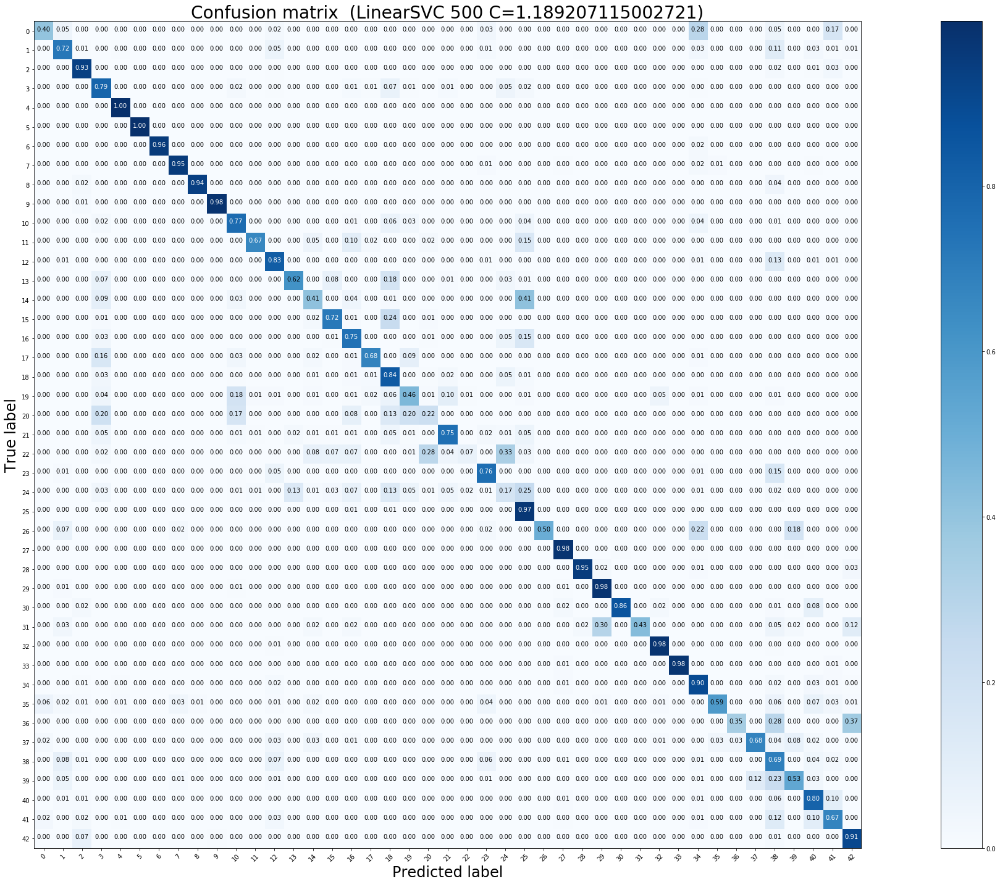

Test accuracy:  0.8216943784639746 

              precision    recall  f1-score   support

           0       0.56      0.40      0.47        60
           1       0.85      0.72      0.78       720
          10       0.88      0.93      0.91       660
          11       0.78      0.79      0.79       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.96      0.98       270
          15       0.95      0.95      0.95       210
          16       0.97      0.94      0.96       150
          17       0.99      0.98      0.99       360
          18       0.82      0.77      0.79       390
          19       0.87      0.67      0.75        60
           2       0.81      0.83      0.82       750
          20       0.70      0.62      0.66        90
          21       0.57      0.41      0.48        90
          22       0.81      0.72      0.76       120
          23       0.66      0.75      0.70 

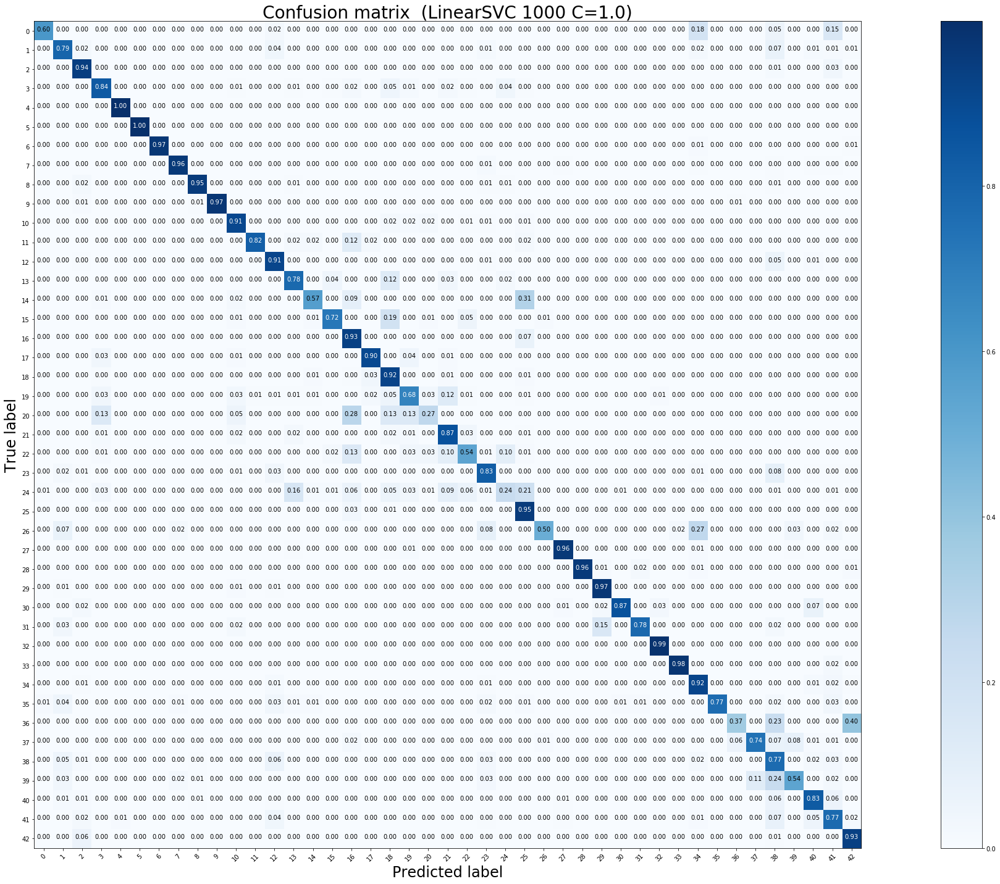

Test accuracy:  0.8737133808392715 

              precision    recall  f1-score   support

           0       0.90      0.60      0.72        60
           1       0.89      0.79      0.84       720
          10       0.88      0.94      0.91       660
          11       0.92      0.84      0.88       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.95      0.96      0.96       210
          16       0.93      0.95      0.94       150
          17       0.99      0.97      0.98       360
          18       0.93      0.91      0.92       390
          19       0.98      0.82      0.89        60
           2       0.85      0.91      0.88       750
          20       0.65      0.78      0.71        90
          21       0.84      0.57      0.68        90
          22       0.89      0.72      0.80       120
          23       0.65      0.93      0.77 

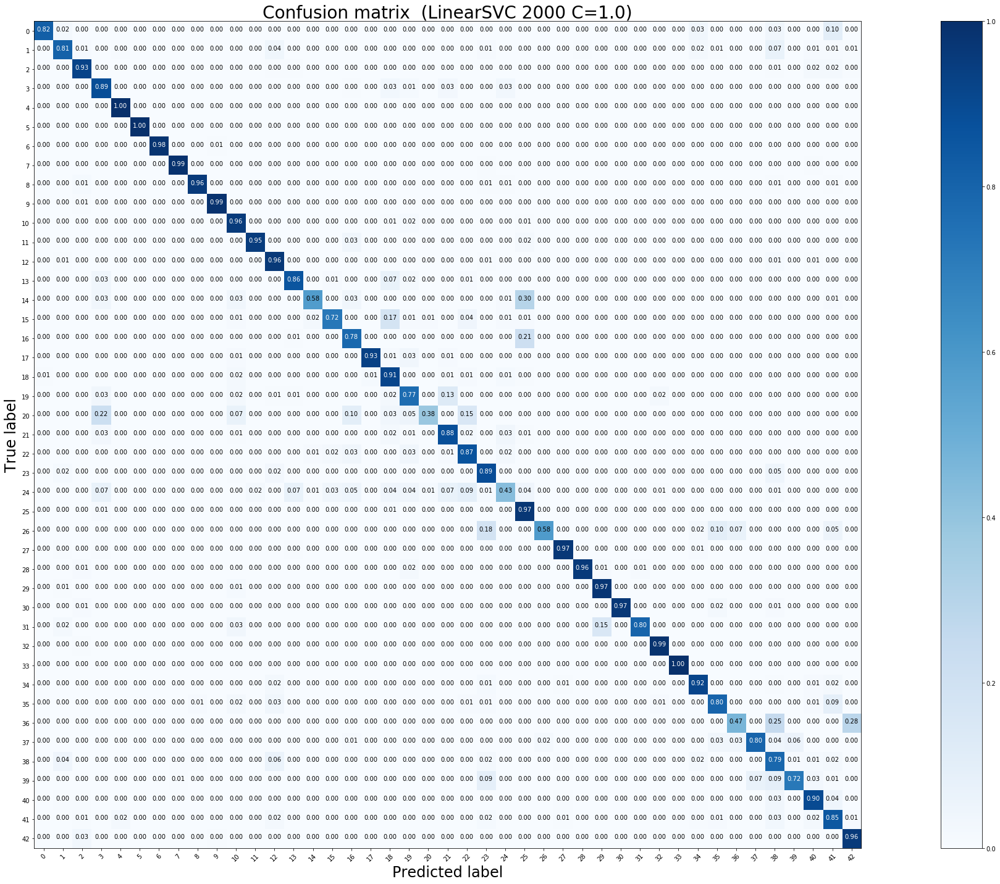

Test accuracy:  0.9021377672209027 

              precision    recall  f1-score   support

           0       0.92      0.82      0.87        60
           1       0.92      0.81      0.86       720
          10       0.93      0.93      0.93       660
          11       0.89      0.89      0.89       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.98      0.99       270
          15       0.97      0.99      0.98       210
          16       0.95      0.96      0.95       150
          17       0.99      0.99      0.99       360
          18       0.91      0.96      0.93       390
          19       0.93      0.95      0.94        60
           2       0.87      0.96      0.91       750
          20       0.82      0.86      0.84        90
          21       0.91      0.58      0.71        90
          22       0.89      0.72      0.80       120
          23       0.79      0.78      0.78 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


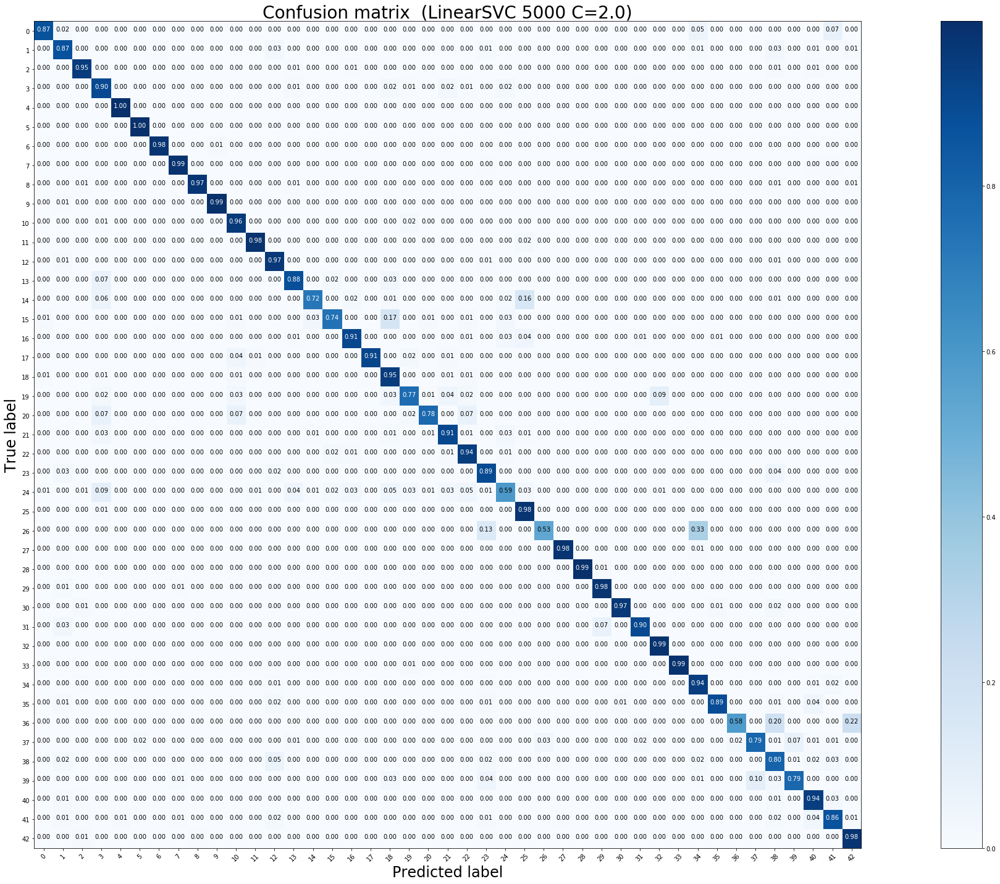

Test accuracy:  0.9249406175771971 

              precision    recall  f1-score   support

           0       0.88      0.87      0.87        60
           1       0.91      0.87      0.89       720
          10       0.96      0.95      0.96       660
          11       0.89      0.90      0.90       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.98       270
          15       0.94      0.99      0.96       210
          16       0.95      0.97      0.96       150
          17       0.99      0.99      0.99       360
          18       0.95      0.96      0.95       390
          19       0.94      0.98      0.96        60
           2       0.89      0.97      0.93       750
          20       0.81      0.88      0.84        90
          21       0.92      0.72      0.81        90
          22       0.93      0.74      0.82       120
          23       0.91      0.91      0.91 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


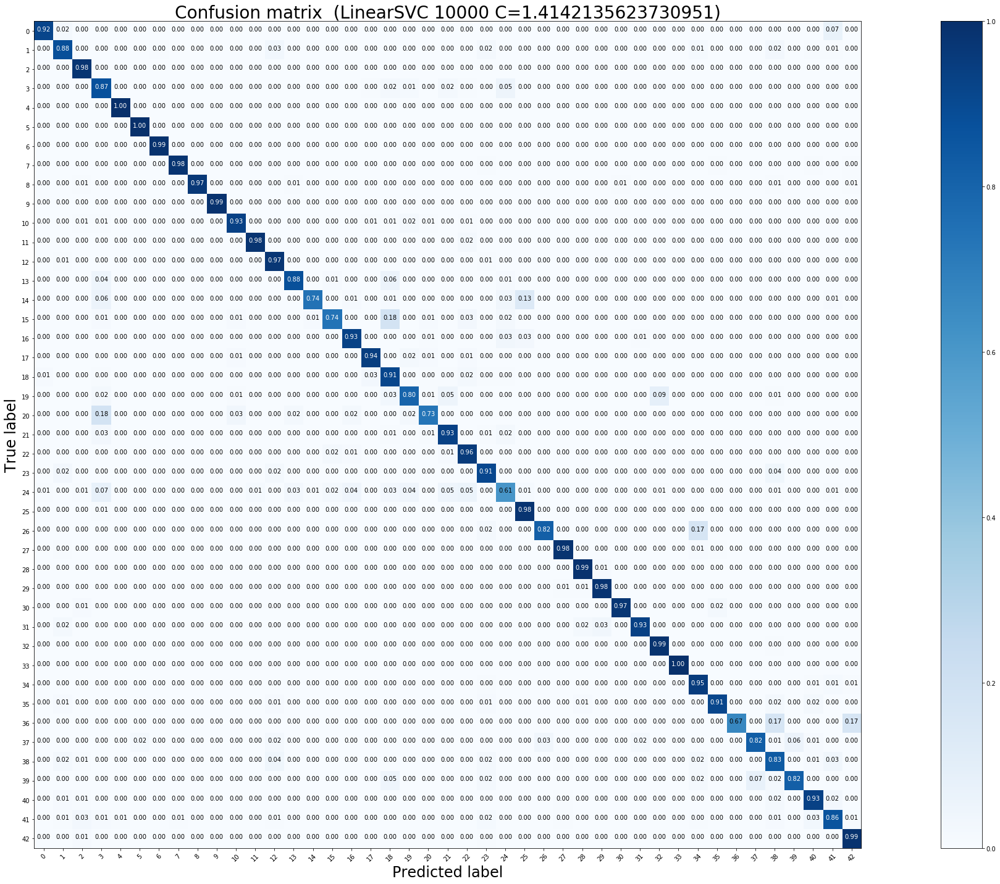

Test accuracy:  0.9315914489311163 

              precision    recall  f1-score   support

           0       0.89      0.92      0.90        60
           1       0.94      0.88      0.91       720
          10       0.95      0.98      0.96       660
          11       0.88      0.87      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.97      0.98      0.98       210
          16       0.97      0.97      0.97       150
          17       1.00      0.99      0.99       360
          18       0.98      0.93      0.96       390
          19       0.95      0.98      0.97        60
           2       0.92      0.97      0.95       750
          20       0.89      0.88      0.88        90
          21       0.94      0.74      0.83        90
          22       0.94      0.74      0.83       120
          23       0.90      0.93      0.91 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


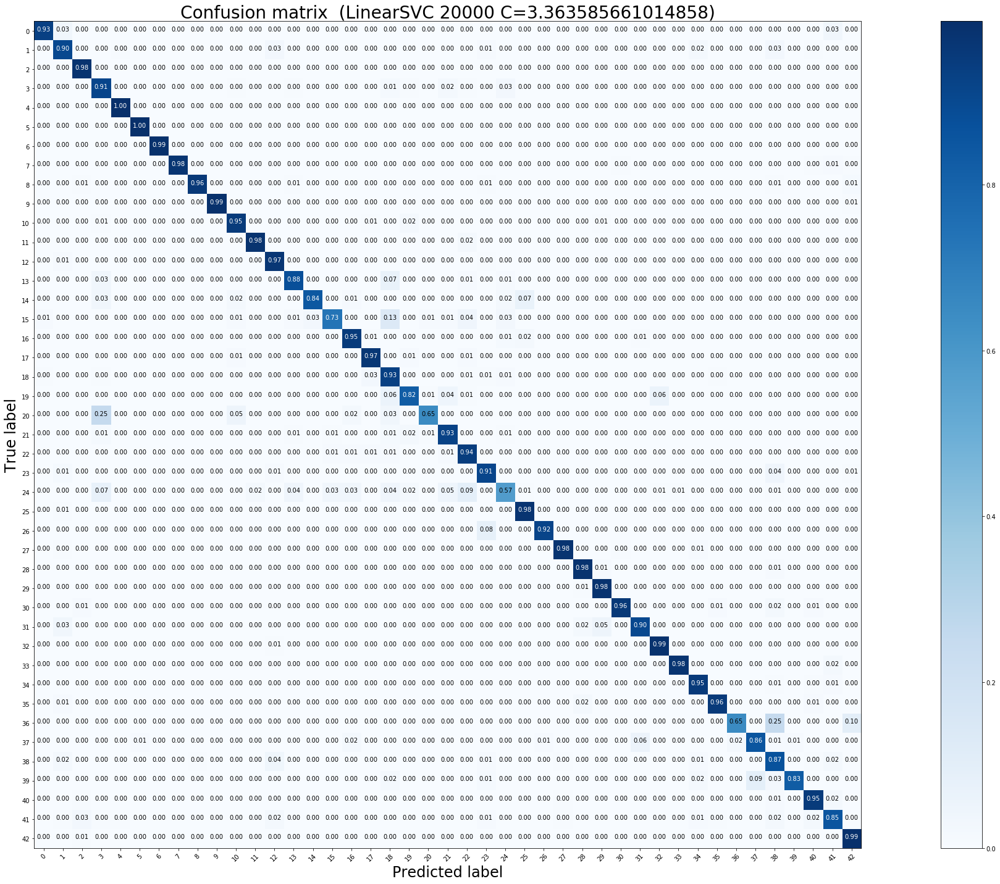

Test accuracy:  0.9390340459224069 

              precision    recall  f1-score   support

           0       0.93      0.93      0.93        60
           1       0.94      0.90      0.92       720
          10       0.96      0.98      0.97       660
          11       0.90      0.91      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.98      0.98      0.98       210
          16       0.96      0.96      0.96       150
          17       1.00      0.99      1.00       360
          18       0.97      0.95      0.96       390
          19       0.94      0.98      0.96        60
           2       0.92      0.97      0.94       750
          20       0.84      0.88      0.86        90
          21       0.93      0.84      0.88        90
          22       0.93      0.73      0.82       120
          23       0.91      0.95      0.93 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


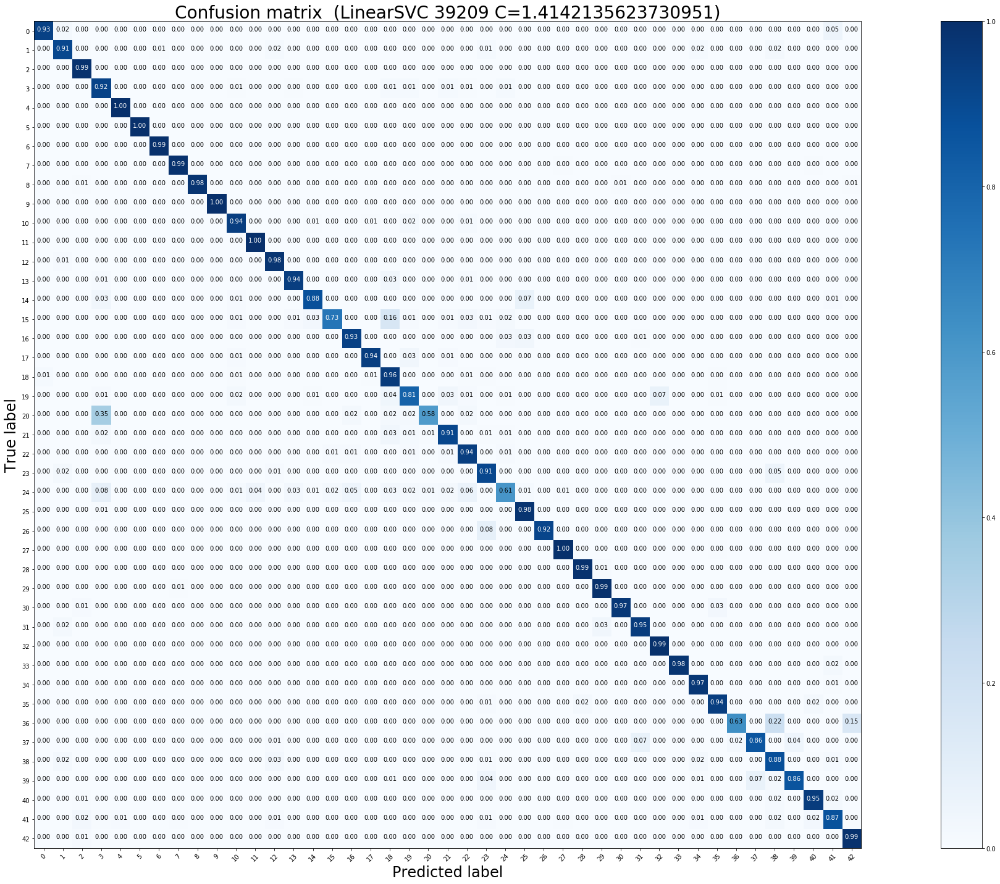

Test accuracy:  0.9453681710213777 

              precision    recall  f1-score   support

           0       0.89      0.93      0.91        60
           1       0.96      0.91      0.93       720
          10       0.96      0.99      0.97       660
          11       0.89      0.92      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.99       270
          15       0.97      0.99      0.98       210
          16       0.98      0.98      0.98       150
          17       1.00      1.00      1.00       360
          18       0.96      0.94      0.95       390
          19       0.90      1.00      0.94        60
           2       0.95      0.98      0.97       750
          20       0.88      0.94      0.91        90
          21       0.91      0.88      0.89        90
          22       0.96      0.73      0.83       120
          23       0.93      0.93      0.93 

In [36]:
#####################################################################################################
######  LinearSVC, seed 1, random_A, without StandardScaler, mit optimierten Hyperparametern trainieren #########
########################################################################################################
train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.189207115002721, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',2.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.4142135623730951, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',3.363585661014858, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.4142135623730951, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

In [ ]:
################################################################################################
######################## RBF, HOG, seed=1, random_A, with scaler    GridSearch #################
################################################################################################

In [23]:
########## RBF, HOG, seed=1, random_A, with scaler, GridSearch,  1. DL #############################
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01 6.40000000e+01
 2.56000000e+02 1.02400000e+03]

 gamma_range: [1.52587891e-05 6.10351562e-05 2.44140625e-04 9.76562500e-04
 3.90625000e-03 1.56250000e-02 6.25000000e-02 2.50000000e-01
 1.00000000e+00 4.00000000e+00 1.60000000e+01]

 Beste Score:  0.7223623038492699

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}


NameError: name 'time_list' is not defined

In [25]:
##### 2. DL ######
clf_500_RBF, time_500_RBF = tuning_hyper_params(X_tr_500, y_tr_500, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),1)
save_trained_model_as_pkl(clf_500_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_500_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/500/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 2 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [  64.           76.10925536   90.50966799  107.63474115  128.
  152.21851072  181.01933598  215.2694823   256.          304.43702144
  362.03867197  430.53896461  512.          608.87404288  724.07734394
  861.07792922 1024.        ]

 gamma_range: [3.81469727e-06 4.53646513e-06 5.39479661e-06 6.41553051e-06
 7.62939453e-06 9.07293026e-06 1.07895932e-05 1.28310610e-05
 1.52587891e-05 1.81458605e-05 2.15791864e-05 2.56621220e-05
 3.05175781e-05 3.62917210e-05 4.31583729e-05 5.13242441e-05
 6.10351562e-05]

 Beste Score:  0.7304397076722753

 Besten Parameter:  {'svm__C': 128.0, 'svm__gamma': 1.2831061023768837e-05}
Bester Estimator score:  0.789311163895487
Precision-Score: 0.696765 (0.112670) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.710202 (0.115756) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.711921 (0.120034) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precis

Roc-Score: 0.871374 (0.049478) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 3.0517578125e-05}
Roc-Score: 0.868003 (0.051427) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 3.62917210389014e-05}
Roc-Score: 0.864480 (0.052458) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 4.315837287515549e-05}
Roc-Score: 0.862829 (0.053570) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 5.132424409507535e-05}
Roc-Score: 0.862828 (0.053570) mit Parameter: {'svm__C': 256.0, 'svm__gamma': 6.103515625e-05}
Roc-Score: 0.873464 (0.053934) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 3.814697265625e-06}
Roc-Score: 0.874090 (0.054340) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 4.536465129862675e-06}
Roc-Score: 0.874903 (0.053479) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 5.3947966093944364e-06}
Roc-Score: 0.873248 (0.049859) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 6.4155305118844185e-06}
Roc-Score: 0.873248 (0.049859) mit Parameter: {'svm__C':

In [37]:
print('********************************************************************************')
print(' GridSearch 1000 1. DL: ')
print('')
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 2000 1. DL: ')
print('')
clf_2000_RBF, time_2000_RBF = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

print('********************************************************************************')
print(' GridSearch 5000 1. DL: ')
print('')
clf_5000_RBF, time_5000_RBF = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'rbf', 5, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 1000 1. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.8182760491016305

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.8566112430720507
Precision-Score: 0.024581 (0.020892) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.020105 (0.017100) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.010477 (0.008437) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.011210 (0.011941) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.006731 (0.008405) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Precisio

********************************************************************************
 GridSearch 2000 1. DL: 


 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.9054173981057917

 Besten Parameter:  {'svm__C': 256.0, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.8971496437054631
Precision-Score: 0.004901 (0.007690) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.004117 (0.006524) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.003425 (0.004456) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.005350 (0.008399) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision

********************************************************************************
 GridSearch 5000 1. DL: 


 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.9710895435503658

 Besten Parameter:  {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.9220110847189232
Precision-Score: 0.007927 (0.009428) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.012368 (0.012752) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.007022 (0.005681) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.021440 (0.016080) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-

Recall-Score: 0.089262 (0.002841) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 0.00390625}
Recall-Score: 0.023545 (0.000402) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 0.015625}
Recall-Score: 0.023256 (0.000000) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 0.0625}
Recall-Score: 0.023256 (0.000000) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 0.25}
Recall-Score: 0.023256 (0.000000) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 1.0}
Recall-Score: 0.023256 (0.000000) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 4.0}
Recall-Score: 0.023256 (0.000000) mit Parameter: {'svm__C': 16.0, 'svm__gamma': 16.0}
Recall-Score: 0.966016 (0.004459) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Recall-Score: 0.962337 (0.008291) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 6.103515625e-05}
Recall-Score: 0.934080 (0.004744) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.000244140625}
Recall-Score: 0.550355 (0.027799) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 0.0009765625}
Re

Roc-Score: 0.519550 (0.006343) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Roc-Score: 0.516766 (0.009670) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Roc-Score: 0.518838 (0.010567) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Roc-Score: 0.512629 (0.006858) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Roc-Score: 0.500933 (0.001154) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Roc-Score: 0.500231 (0.000467) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.015625}
Roc-Score: 0.504959 (0.005637) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0625}
Roc-Score: 0.506567 (0.005429) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.25}
Roc-Score: 0.500694 (0.001401) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.0}
Roc-Score: 0.500000 (0.000000) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__g

In [44]:
print('********************************************************************************')
print(' GridSearch 1000 2. DL: ')
print('')
clf_1000_RBF, time_1000_RBF = tuning_hyper_params(X_tr_1000, y_tr_1000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),1)
save_trained_model_as_pkl(clf_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_1000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/1000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 2000 2. DL: ')
print('')
clf_2000_RBF, time_2000_RBF = tuning_hyper_params(X_tr_2000, y_tr_2000, X_test_9_4_2, y_test, 'rbf', 10, 2, 0, 
                                                get_finer_range(256.0), get_finer_range(1.52587890625e-05),1)
save_trained_model_as_pkl(clf_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_2000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/2000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

print('********************************************************************************')
print(' GridSearch 5000 2. DL: ')
print('')
clf_5000_RBF, time_5000_RBF = tuning_hyper_params(X_tr_5000, y_tr_5000, X_test_9_4_2, y_test, 'rbf', 5, 2, 0, 
                                                np.logspace(-16,10,14, base=2), np.logspace(-16,4,11, base=2),1)
save_trained_model_as_pkl(clf_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/GridSearch_2DL.pkl")
save_as_csv(time_5000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/5000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_2_DL.csv')

********************************************************************************
 GridSearch 1000 2. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\model_selection\_split.py:657: Warning: The least populated class in y has only 5 members, which is too few. The minimum number of members in any class cannot be less than n_splits=10.
  % (min_groups, self.n_splits)), Warning)



 C_range:  [  64.      76.109   90.51   107.635  128.     152.219  181.019  215.269
  256.     304.437  362.039  430.539  512.     608.874  724.077  861.078
 1024.   ]

 gamma_range: [3.815e-06 4.536e-06 5.395e-06 6.416e-06 7.629e-06 9.073e-06 1.079e-05
 1.283e-05 1.526e-05 1.815e-05 2.158e-05 2.566e-05 3.052e-05 3.629e-05
 4.316e-05 5.132e-05 6.104e-05]

 Beste Score:  0.8183588153018386

 Besten Parameter:  {'svm__C': 724.0773439350247, 'svm__gamma': 5.3947966093944364e-06}
Bester Estimator score:  0.8566904196357878
Precision-Score: 0.812543 (0.063932) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.812939 (0.063201) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.810972 (0.065878) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.811798 (0.069031) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 6.4155305118844185e-06}
Precision-Score: 0.809050 (0.073925) mit Parameter:

F1-Score: 0.812916 (0.063679) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 3.0517578125e-05}
F1-Score: 0.812916 (0.063679) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 3.62917210389014e-05}
F1-Score: 0.813935 (0.062720) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 4.315837287515549e-05}
F1-Score: 0.814579 (0.063304) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 5.132424409507535e-05}
F1-Score: 0.814374 (0.063714) mit Parameter: {'svm__C': 304.4370214406966, 'svm__gamma': 6.103515625e-05}
F1-Score: 0.816486 (0.068117) mit Parameter: {'svm__C': 362.03867196751236, 'svm__gamma': 3.814697265625e-06}
F1-Score: 0.817006 (0.067541) mit Parameter: {'svm__C': 362.03867196751236, 'svm__gamma': 4.536465129862675e-06}
F1-Score: 0.817403 (0.067724) mit Parameter: {'svm__C': 362.03867196751236, 'svm__gamma': 5.3947966093944364e-06}
F1-Score: 0.815002 (0.070588) mit Parameter: {'svm__C': 362.03867196751236, 'svm__gamma': 6.4155305118844185e-06}
F

Roc-Score: 0.913442 (0.032677) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 5.3947966093944364e-06}
Roc-Score: 0.913013 (0.034116) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 6.4155305118844185e-06}
Roc-Score: 0.913282 (0.033902) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 7.62939453125e-06}
Roc-Score: 0.913240 (0.034266) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 9.07293025972535e-06}
Roc-Score: 0.913524 (0.033850) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 1.0789593218788873e-05}
Roc-Score: 0.913747 (0.033963) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 1.2831061023768837e-05}
Roc-Score: 0.914032 (0.033558) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 1.52587890625e-05}
Roc-Score: 0.914032 (0.033558) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 1.81458605194507e-05}
Roc-Score: 0.915405 (0.031806) mit Parameter: {'svm__C': 152.2185107203483, 'svm__gamma': 2.1579186437

********************************************************************************
 GridSearch 2000 2. DL: 


 C_range:  [  64.      76.109   90.51   107.635  128.     152.219  181.019  215.269
  256.     304.437  362.039  430.539  512.     608.874  724.077  861.078
 1024.   ]

 gamma_range: [3.815e-06 4.536e-06 5.395e-06 6.416e-06 7.629e-06 9.073e-06 1.079e-05
 1.283e-05 1.526e-05 1.815e-05 2.158e-05 2.566e-05 3.052e-05 3.629e-05
 4.316e-05 5.132e-05 6.104e-05]

 Beste Score:  0.9055825203334479

 Besten Parameter:  {'svm__C': 107.63474115247546, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.8969121140142517
Precision-Score: 0.910293 (0.038500) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.911982 (0.038034) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 4.536465129862675e-06}
Precision-Score: 0.912258 (0.038109) mit Parameter: {'svm__C': 64.0, 'svm__gamma': 5.3947966093944364e-06}
Precision-Score: 0.912976 (0.037710) mit Parameter: {'s

F1-Score: 0.903639 (0.035853) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 2.1579186437577746e-05}
F1-Score: 0.902745 (0.036477) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 2.5662122047537674e-05}
F1-Score: 0.903613 (0.036466) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 3.0517578125e-05}
F1-Score: 0.903795 (0.036776) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 3.62917210389014e-05}
F1-Score: 0.903586 (0.037293) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 4.315837287515549e-05}
F1-Score: 0.903746 (0.037150) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 5.132424409507535e-05}
F1-Score: 0.895733 (0.035967) mit Parameter: {'svm__C': 76.10925536017415, 'svm__gamma': 6.103515625e-05}
F1-Score: 0.896378 (0.037072) mit Parameter: {'svm__C': 90.50966799187809, 'svm__gamma': 3.814697265625e-06}
F1-Score: 0.898137 (0.037873) mit Parameter: {'svm__C': 90.50966799187809, 'svm__gamma': 4.536465129862675e-06}
F1-Sc

F1-Score: 0.904222 (0.035986) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 3.814697265625e-06}
F1-Score: 0.904168 (0.036047) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 4.536465129862675e-06}
F1-Score: 0.903549 (0.035754) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 5.3947966093944364e-06}
F1-Score: 0.903254 (0.035233) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 6.4155305118844185e-06}
F1-Score: 0.903254 (0.035233) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 7.62939453125e-06}
F1-Score: 0.903254 (0.035233) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 9.07293025972535e-06}
F1-Score: 0.903254 (0.035233) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 1.0789593218788873e-05}
F1-Score: 0.903254 (0.035233) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 1.2831061023768837e-05}
F1-Score: 0.905417 (0.034796) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 1.52587890625e-05}
F1-Score: 0.903945 (0.035181) mit Parameter: {'svm__C': 512.0, 'svm__gamma': 1.81458605194507e-05}
F1-Score:

Roc-Score: 0.951131 (0.016956) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 1.2831061023768837e-05}
Roc-Score: 0.951614 (0.016617) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 1.52587890625e-05}
Roc-Score: 0.951015 (0.016796) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 1.81458605194507e-05}
Roc-Score: 0.950614 (0.017018) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 2.1579186437577746e-05}
Roc-Score: 0.950118 (0.017560) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 2.5662122047537674e-05}
Roc-Score: 0.950694 (0.017605) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 3.0517578125e-05}
Roc-Score: 0.950801 (0.017791) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 3.62917210389014e-05}
Roc-Score: 0.950723 (0.018079) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 4.315837287515549e-05}
Roc-Score: 0.950616 (0.017896) mit Parameter: {'svm__C': 215.2694823049509, 'svm__gamma': 5.132424409507

********************************************************************************
 GridSearch 5000 2. DL: 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\joblib\externals\loky\process_executor.py:706: UserWarning: A worker stopped while some jobs were given to the executor. This can be caused by a too short worker timeout or by a memory leak.
  "timeout or by a memory leak.", UserWarning



 C_range:  [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01 6.400e+01 2.560e+02 1.024e+03]

 gamma_range: [1.526e-05 6.104e-05 2.441e-04 9.766e-04 3.906e-03 1.562e-02 6.250e-02
 2.500e-01 1.000e+00 4.000e+00 1.600e+01]

 Beste Score:  0.9710895435503658

 Besten Parameter:  {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.9220110847189232
Precision-Score: 0.007927 (0.009428) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.012368 (0.012752) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.007022 (0.005681) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.000244140625}
Precision-Score: 0.021440 (0.016080) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.0009765625}
Precision-Score: 0.009926 (0.011061) mit Parameter: {'svm__C': 1.52587890625e-05, 'svm__gamma': 0.00390625}
Precision

In [35]:
print('********************************************************************************')
print(' GridSearch 10000 1. DL: ')
print('')
clf_10000_RBF, time_10000_RBF = tuning_hyper_params(X_tr_10000, y_tr_10000, X_test_9_4_2, y_test, 'rbf', 3, 2, 0, 
                                                np.logspace(-2,8,6, base=2), np.logspace(-20,-4,9, base=2),1)
save_trained_model_as_pkl(clf_10000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/10000/seed_1_random_A_with_scaler/GridSearch_1DL.pkl")
save_as_csv(time_10000_RBF, "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/10000/seed_1_random_A_with_scaler/", 'Suchzeiten_GridSearch_1_DL.csv')

********************************************************************************
 GridSearch 10000 1. DL: 


 C_range:  [2.50e-01 1.00e+00 4.00e+00 1.60e+01 6.40e+01 2.56e+02]

 gamma_range: [9.53674316e-07 3.81469727e-06 1.52587891e-05 6.10351562e-05
 2.44140625e-04 9.76562500e-04 3.90625000e-03 1.56250000e-02
 6.25000000e-02]

 Beste Score:  0.9746936514876574

 Besten Parameter:  {'svm__C': 64.0, 'svm__gamma': 1.52587890625e-05}
Bester Estimator score:  0.933729216152019
Precision-Score: 0.008380 (0.011438) mit Parameter: {'svm__C': 0.25, 'svm__gamma': 9.5367431640625e-07}
Precision-Score: 0.061374 (0.010451) mit Parameter: {'svm__C': 0.25, 'svm__gamma': 3.814697265625e-06}
Precision-Score: 0.431415 (0.018969) mit Parameter: {'svm__C': 0.25, 'svm__gamma': 1.52587890625e-05}
Precision-Score: 0.852873 (0.007507) mit Parameter: {'svm__C': 0.25, 'svm__gamma': 6.103515625e-05}
Precision-Score: 0.935369 (0.004194) mit Parameter: {'svm__C': 0.25, 'svm__gamma': 0.000244140625}
Precision-Sco

Daten skalieren


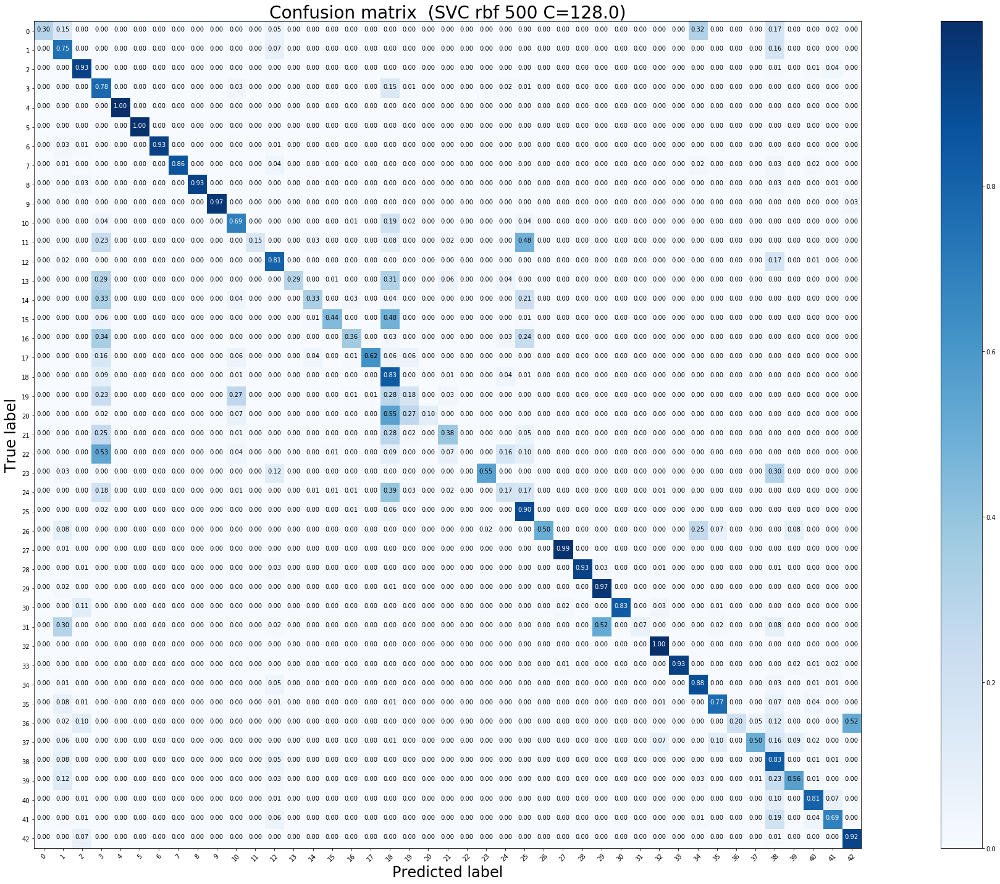

Test accuracy:  0.789311163895487 

              precision    recall  f1-score   support

           0       0.90      0.30      0.45        60
           1       0.76      0.75      0.76       720
          10       0.88      0.93      0.91       660
          11       0.47      0.78      0.59       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.93      0.97       270
          15       1.00      0.86      0.93       210
          16       1.00      0.93      0.96       150
          17       1.00      0.97      0.98       360
          18       0.75      0.69      0.72       390
          19       1.00      0.15      0.26        60
           2       0.73      0.81      0.76       750
          20       1.00      0.29      0.45        90
          21       0.77      0.33      0.47        90
          22       0.95      0.44      0.60       120
          23       0.77      0.36      0.49  

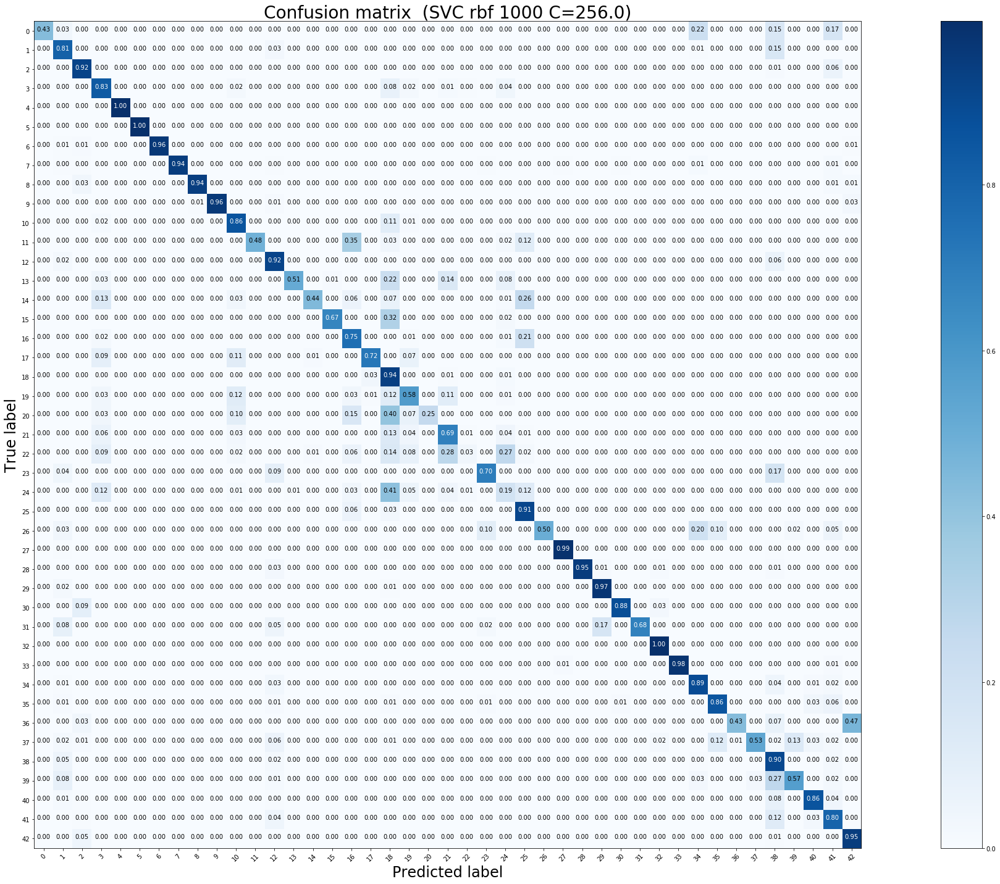

Test accuracy:  0.8566112430720507 

              precision    recall  f1-score   support

           0       1.00      0.43      0.60        60
           1       0.85      0.81      0.83       720
          10       0.92      0.92      0.92       660
          11       0.82      0.83      0.83       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.96      0.98       270
          15       1.00      0.94      0.97       210
          16       0.98      0.94      0.96       150
          17       1.00      0.96      0.98       360
          18       0.86      0.86      0.86       390
          19       1.00      0.48      0.65        60
           2       0.84      0.92      0.87       750
          20       0.98      0.51      0.67        90
          21       0.95      0.44      0.61        90
          22       0.99      0.67      0.80       120
          23       0.62      0.75      0.68 

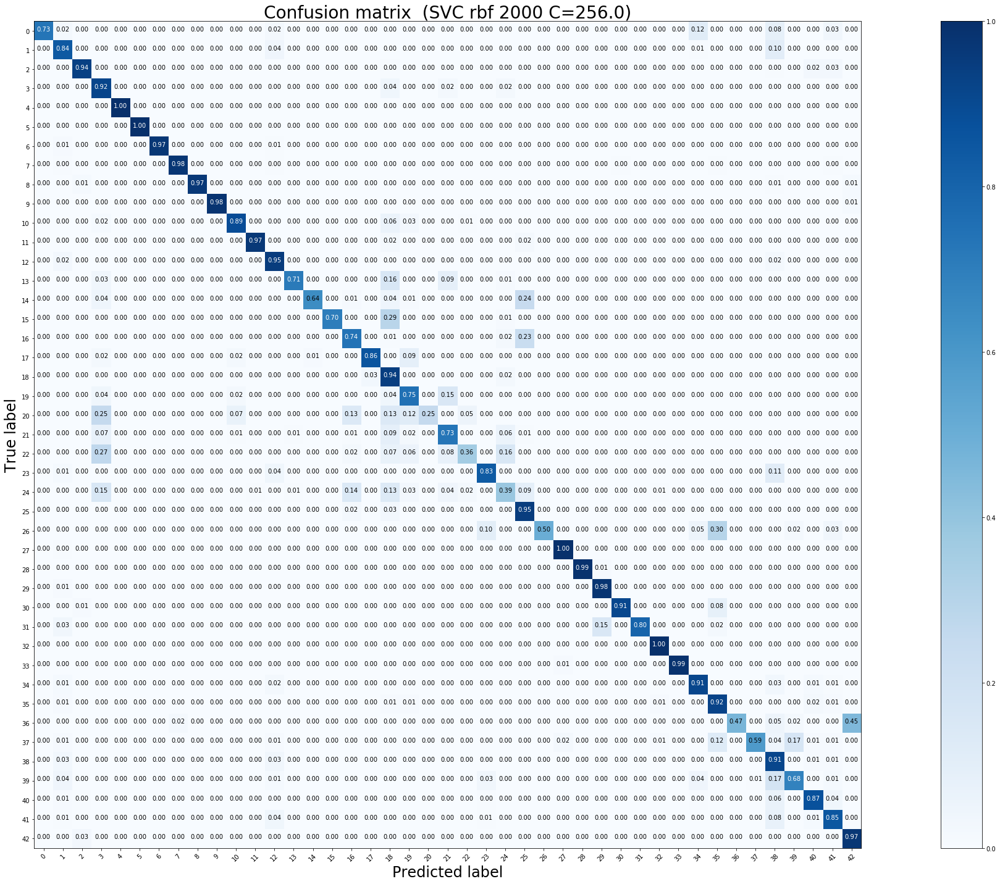

Test accuracy:  0.8971496437054631 

              precision    recall  f1-score   support

           0       1.00      0.73      0.85        60
           1       0.89      0.84      0.86       720
          10       0.96      0.94      0.95       660
          11       0.80      0.92      0.85       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       1.00      0.98      0.99       210
          16       0.99      0.97      0.98       150
          17       1.00      0.98      0.99       360
          18       0.96      0.89      0.93       390
          19       0.98      0.97      0.97        60
           2       0.87      0.95      0.91       750
          20       0.96      0.71      0.82        90
          21       0.98      0.64      0.78        90
          22       1.00      0.70      0.82       120
          23       0.74      0.74      0.74 

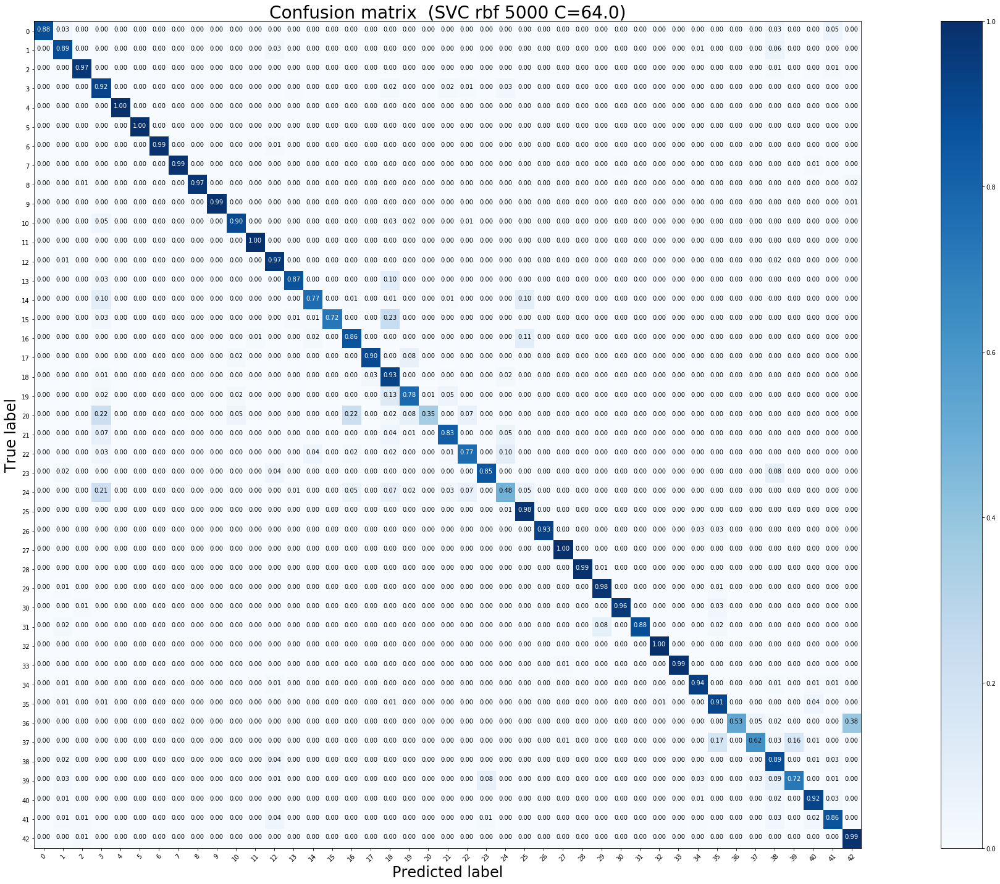

Test accuracy:  0.9220110847189232 

              precision    recall  f1-score   support

           0       1.00      0.88      0.94        60
           1       0.92      0.89      0.91       720
          10       0.97      0.97      0.97       660
          11       0.79      0.92      0.85       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       1.00      0.99      0.99       210
          16       0.99      0.97      0.98       150
          17       1.00      0.99      0.99       360
          18       0.97      0.90      0.94       390
          19       0.97      1.00      0.98        60
           2       0.87      0.97      0.92       750
          20       0.94      0.87      0.90        90
          21       0.90      0.77      0.83        90
          22       1.00      0.72      0.84       120
          23       0.83      0.86      0.85 

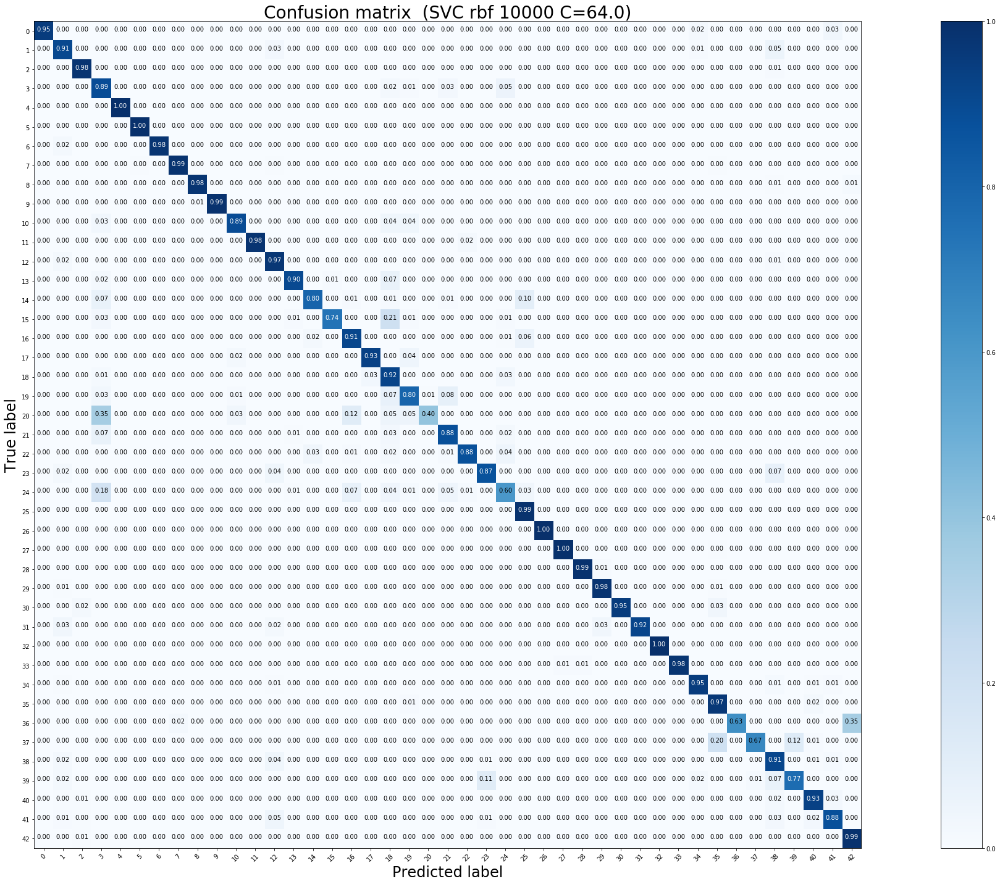

Test accuracy:  0.933729216152019 

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.92      0.91      0.91       720
          10       0.98      0.98      0.98       660
          11       0.80      0.89      0.84       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.98      0.99       270
          15       1.00      0.99      0.99       210
          16       0.98      0.98      0.98       150
          17       1.00      0.99      1.00       360
          18       0.98      0.89      0.93       390
          19       1.00      0.98      0.99        60
           2       0.89      0.97      0.93       750
          20       0.96      0.90      0.93        90
          21       0.92      0.80      0.86        90
          22       0.99      0.74      0.85       120
          23       0.87      0.91      0.89  

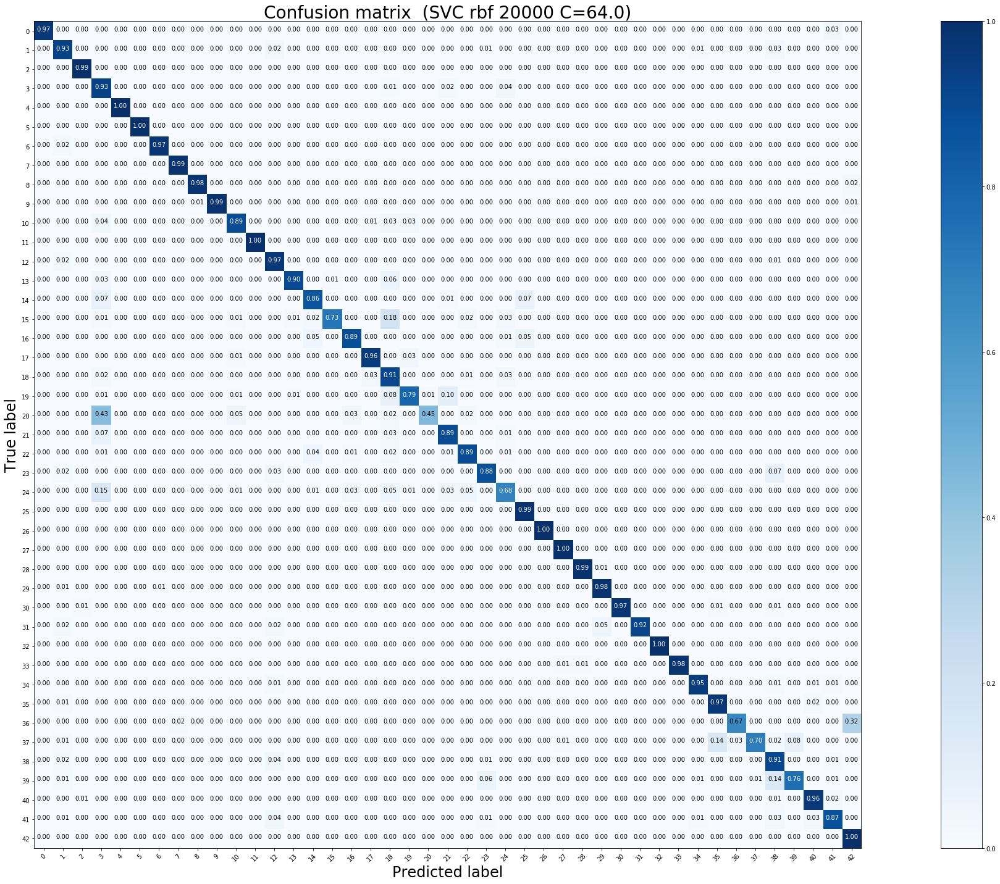

Test accuracy:  0.9387965162311955 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.92      0.93      0.93       720
          10       0.99      0.99      0.99       660
          11       0.80      0.93      0.86       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       1.00      0.99      0.99       210
          16       0.98      0.98      0.98       150
          17       1.00      0.99      0.99       360
          18       0.98      0.89      0.93       390
          19       1.00      1.00      1.00        60
           2       0.90      0.97      0.93       750
          20       0.98      0.90      0.94        90
          21       0.83      0.86      0.84        90
          22       0.99      0.73      0.84       120
          23       0.94      0.89      0.91 

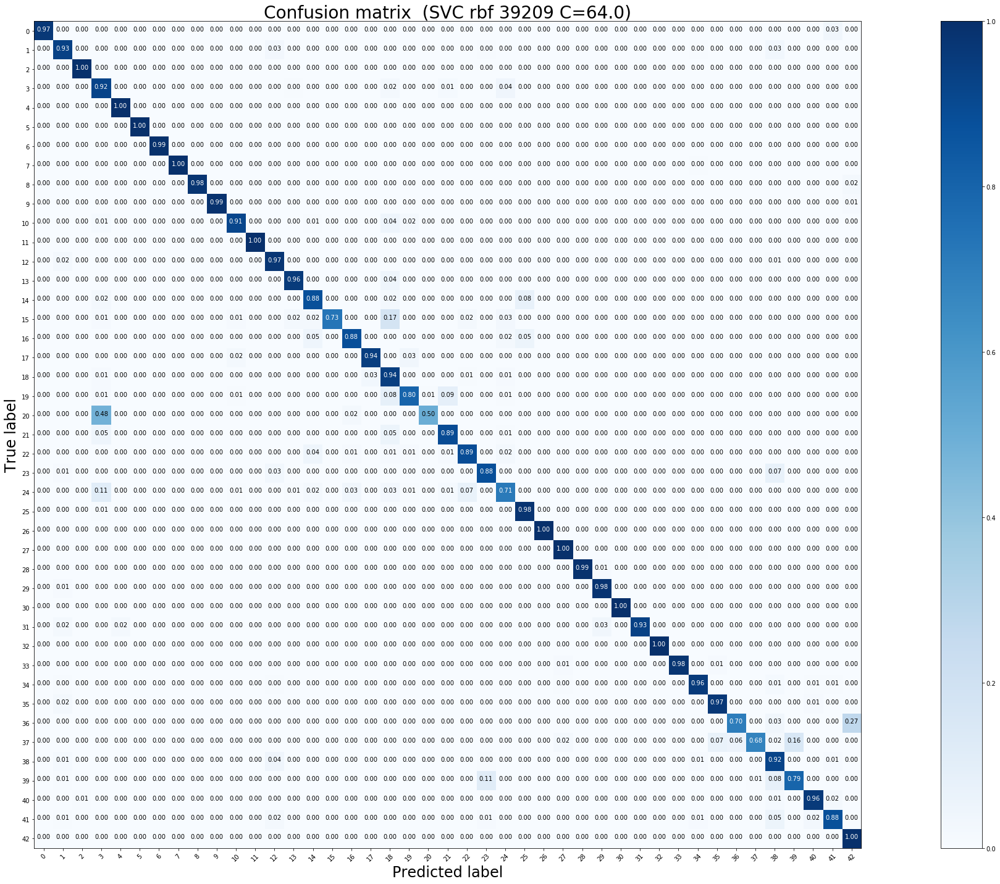

Test accuracy:  0.944972288202692 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.94      0.93      0.94       720
          10       0.99      1.00      0.99       660
          11       0.85      0.92      0.88       420
          12       1.00      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       1.00      1.00      1.00       210
          16       0.99      0.98      0.98       150
          17       1.00      0.99      0.99       360
          18       0.99      0.91      0.95       390
          19       1.00      1.00      1.00        60
           2       0.91      0.97      0.94       750
          20       0.95      0.96      0.95        90
          21       0.81      0.88      0.84        90
          22       1.00      0.73      0.85       120
          23       0.94      0.88      0.91  

In [42]:
##### SVM mit RBF mit optimierten Hyperparametern C und Gamma trainieren  #################
######   noch vom 1. DL
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500', 128.0, 1.2831061023768837e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',256.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',256.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")

In [ ]:
##### SVM mit RBF mit optimierten Hyperparametern C und Gamma trainieren  #################
######   noch vom 2. DL
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500', 128.0, 1.2831061023768837e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',724.0773439350247, 5.3947966093944364e-06, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',107.63474115247546, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',64.0, 1.52587890625e-05, 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_opt/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")

In [28]:
np.logspace(-16,4,11, base=2)

array([1.52587891e-05, 6.10351562e-05, 2.44140625e-04, 9.76562500e-04,
       3.90625000e-03, 1.56250000e-02, 6.25000000e-02, 2.50000000e-01,
       1.00000000e+00, 4.00000000e+00, 1.60000000e+01])

In [34]:
np.logspace(-20,-4,9, base=2)

array([9.53674316e-07, 3.81469727e-06, 1.52587891e-05, 6.10351562e-05,
       2.44140625e-04, 9.76562500e-04, 3.90625000e-03, 1.56250000e-02,
       6.25000000e-02])

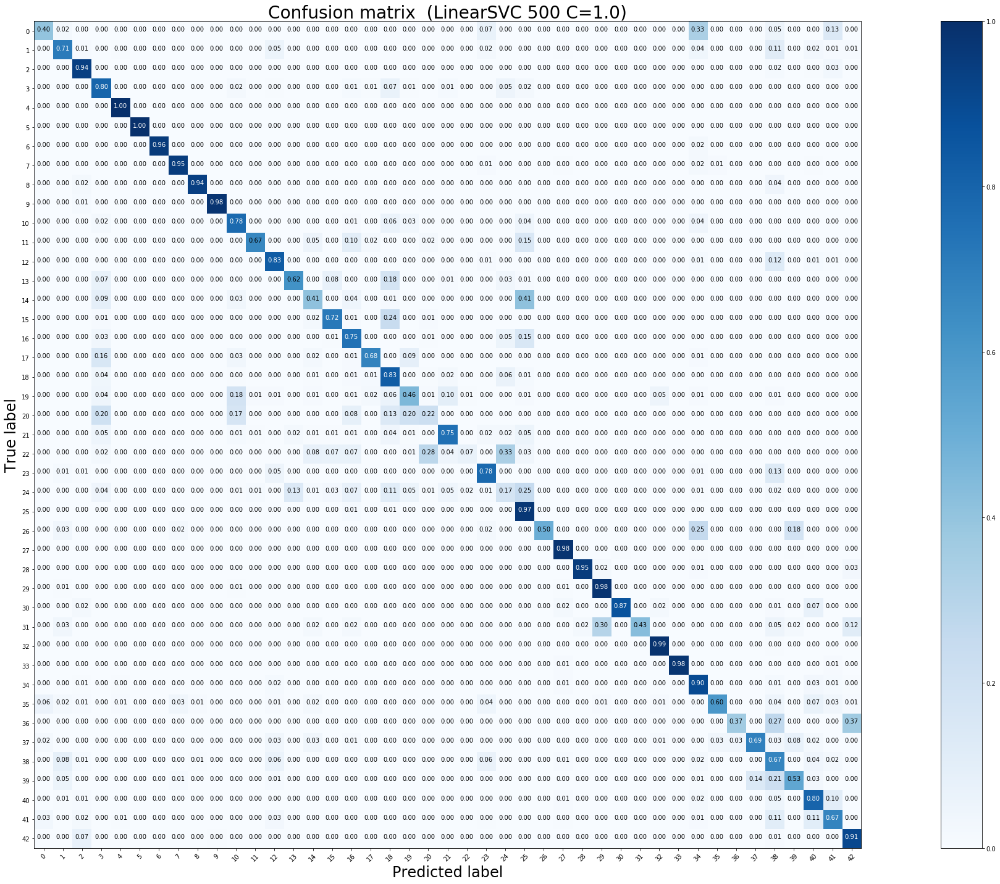

Test accuracy:  0.8216943784639746 

              precision    recall  f1-score   support

           0       0.51      0.40      0.45        60
           1       0.86      0.71      0.78       720
          10       0.88      0.94      0.91       660
          11       0.77      0.80      0.78       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.96      0.98       270
          15       0.95      0.95      0.95       210
          16       0.96      0.94      0.95       150
          17       0.99      0.98      0.99       360
          18       0.82      0.78      0.80       390
          19       0.87      0.67      0.75        60
           2       0.82      0.83      0.83       750
          20       0.70      0.62      0.66        90
          21       0.57      0.41      0.48        90
          22       0.81      0.72      0.76       120
          23       0.65      0.75      0.70 

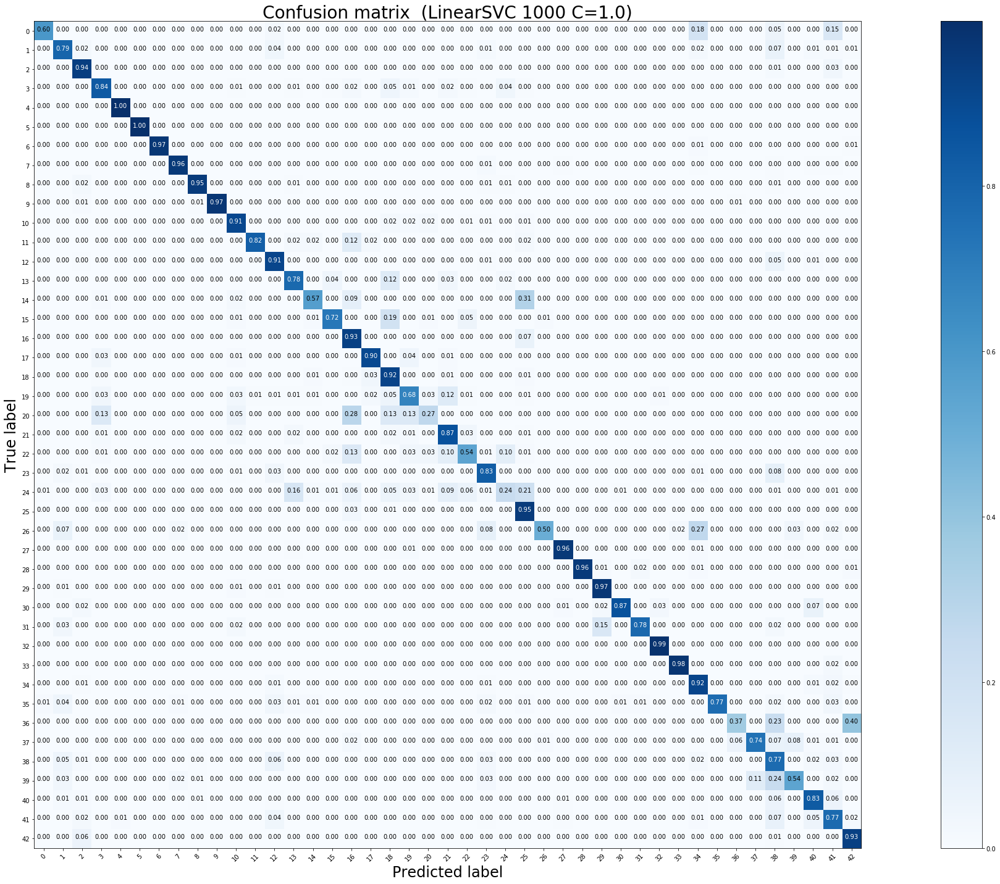

Test accuracy:  0.8737133808392715 

              precision    recall  f1-score   support

           0       0.90      0.60      0.72        60
           1       0.89      0.79      0.84       720
          10       0.88      0.94      0.91       660
          11       0.92      0.84      0.88       420
          12       0.99      1.00      1.00       690
          13       1.00      1.00      1.00       720
          14       1.00      0.97      0.98       270
          15       0.95      0.96      0.96       210
          16       0.93      0.95      0.94       150
          17       0.99      0.97      0.98       360
          18       0.93      0.91      0.92       390
          19       0.98      0.82      0.89        60
           2       0.85      0.91      0.88       750
          20       0.65      0.78      0.71        90
          21       0.84      0.57      0.68        90
          22       0.89      0.72      0.80       120
          23       0.65      0.93      0.77 

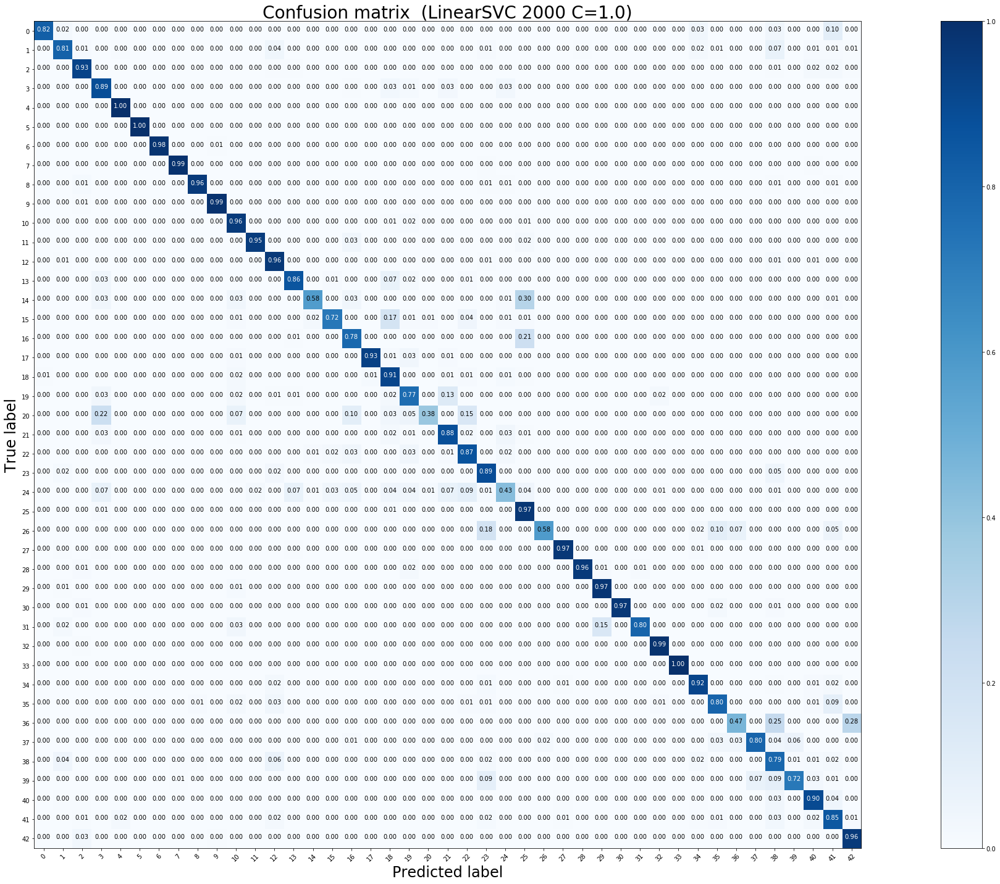

Test accuracy:  0.9021377672209027 

              precision    recall  f1-score   support

           0       0.92      0.82      0.87        60
           1       0.92      0.81      0.86       720
          10       0.93      0.93      0.93       660
          11       0.89      0.89      0.89       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       1.00      0.98      0.99       270
          15       0.97      0.99      0.98       210
          16       0.95      0.96      0.95       150
          17       0.99      0.99      0.99       360
          18       0.91      0.96      0.93       390
          19       0.93      0.95      0.94        60
           2       0.87      0.96      0.91       750
          20       0.82      0.86      0.84        90
          21       0.91      0.58      0.71        90
          22       0.89      0.72      0.80       120
          23       0.79      0.78      0.78 

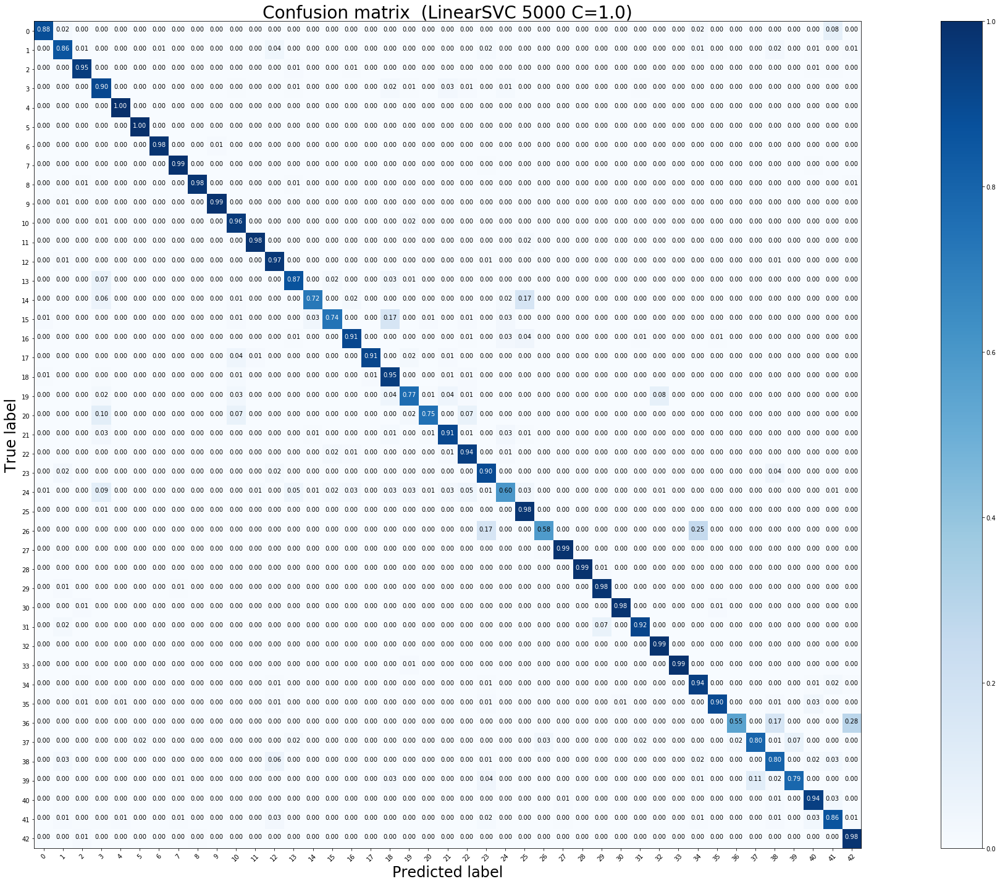

Test accuracy:  0.9250197941409343 

              precision    recall  f1-score   support

           0       0.87      0.88      0.88        60
           1       0.92      0.86      0.89       720
          10       0.96      0.95      0.96       660
          11       0.89      0.90      0.89       420
          12       0.98      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.94      0.99      0.97       210
          16       0.93      0.98      0.95       150
          17       0.99      0.99      0.99       360
          18       0.94      0.96      0.95       390
          19       0.94      0.98      0.96        60
           2       0.89      0.97      0.93       750
          20       0.79      0.87      0.83        90
          21       0.90      0.72      0.80        90
          22       0.93      0.74      0.82       120
          23       0.91      0.91      0.91 

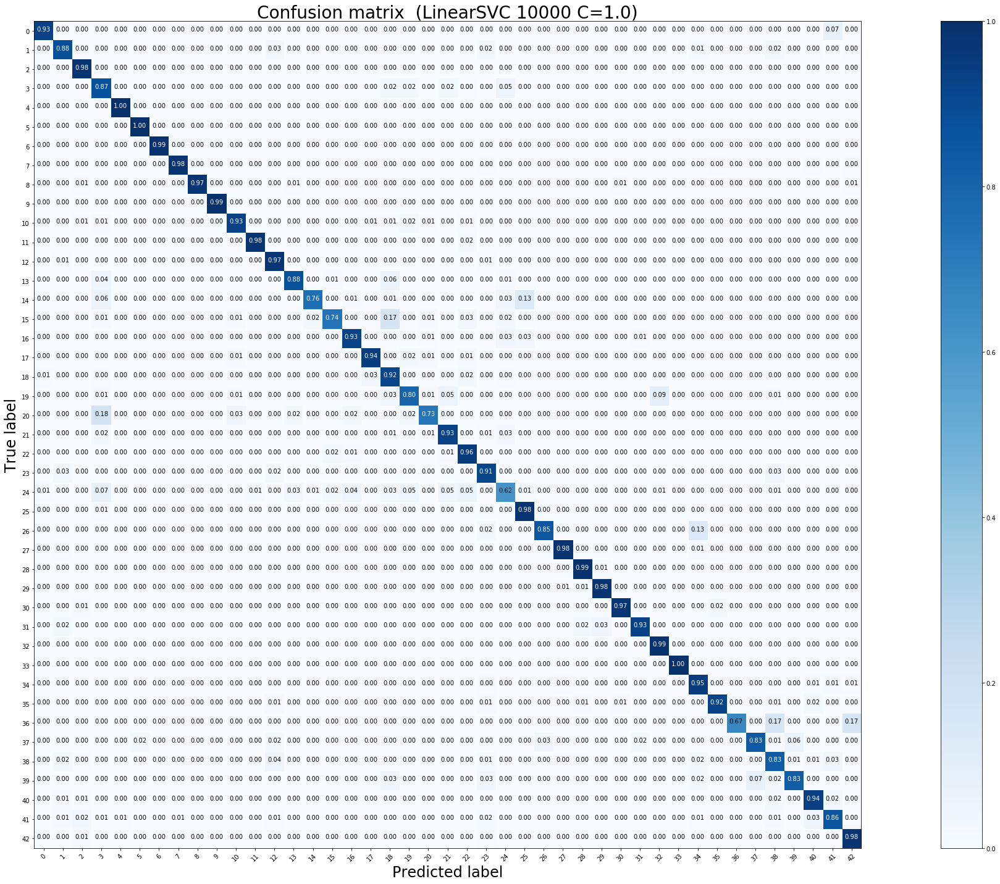

Test accuracy:  0.9324623911322248 

              precision    recall  f1-score   support

           0       0.90      0.93      0.92        60
           1       0.94      0.88      0.91       720
          10       0.95      0.98      0.97       660
          11       0.89      0.87      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.96      0.98      0.97       210
          16       0.97      0.97      0.97       150
          17       1.00      0.99      1.00       360
          18       0.98      0.93      0.96       390
          19       0.95      0.98      0.97        60
           2       0.92      0.97      0.94       750
          20       0.89      0.88      0.88        90
          21       0.93      0.76      0.83        90
          22       0.94      0.74      0.83       120
          23       0.90      0.93      0.91 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


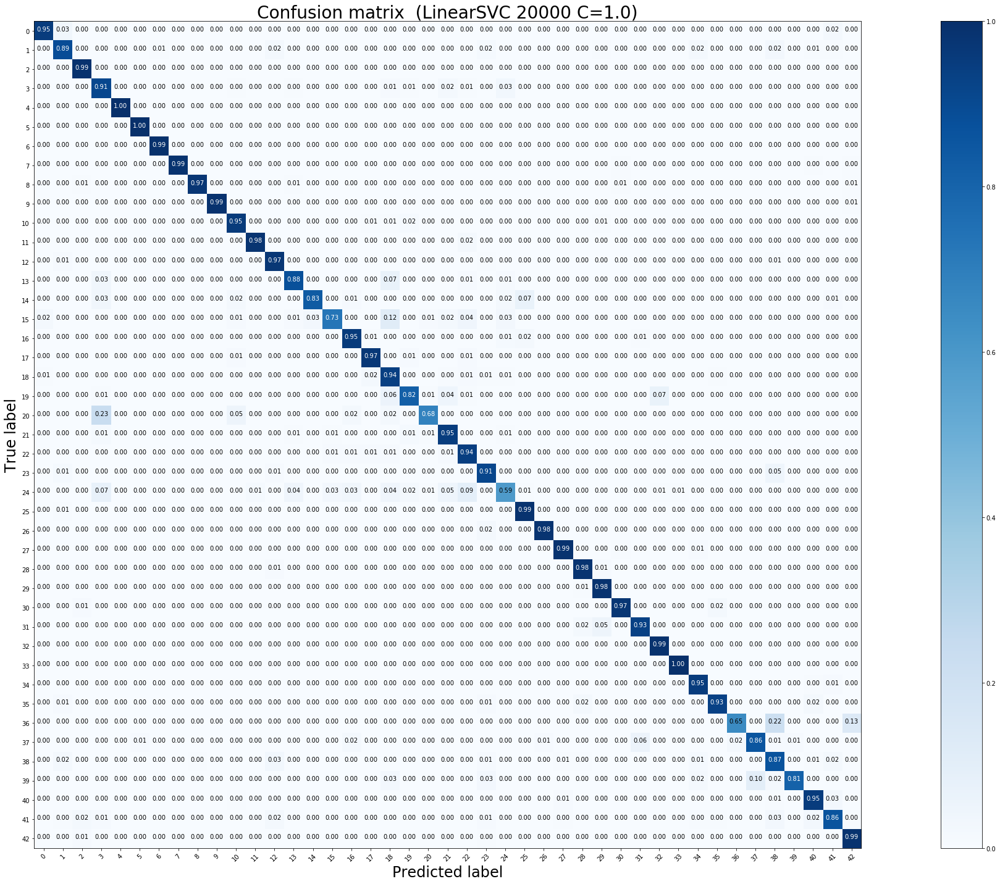

Test accuracy:  0.9405384006334125 

              precision    recall  f1-score   support

           0       0.90      0.95      0.93        60
           1       0.95      0.89      0.92       720
          10       0.97      0.99      0.98       660
          11       0.90      0.91      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.99       270
          15       0.98      0.99      0.98       210
          16       0.97      0.97      0.97       150
          17       1.00      0.99      1.00       360
          18       0.97      0.95      0.96       390
          19       0.95      0.98      0.97        60
           2       0.94      0.97      0.95       750
          20       0.84      0.88      0.86        90
          21       0.93      0.83      0.88        90
          22       0.94      0.73      0.82       120
          23       0.91      0.95      0.93 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:929: ConvergenceWarning: Liblinear failed to converge, increase the number of iterations.
  "the number of iterations.", ConvergenceWarning)


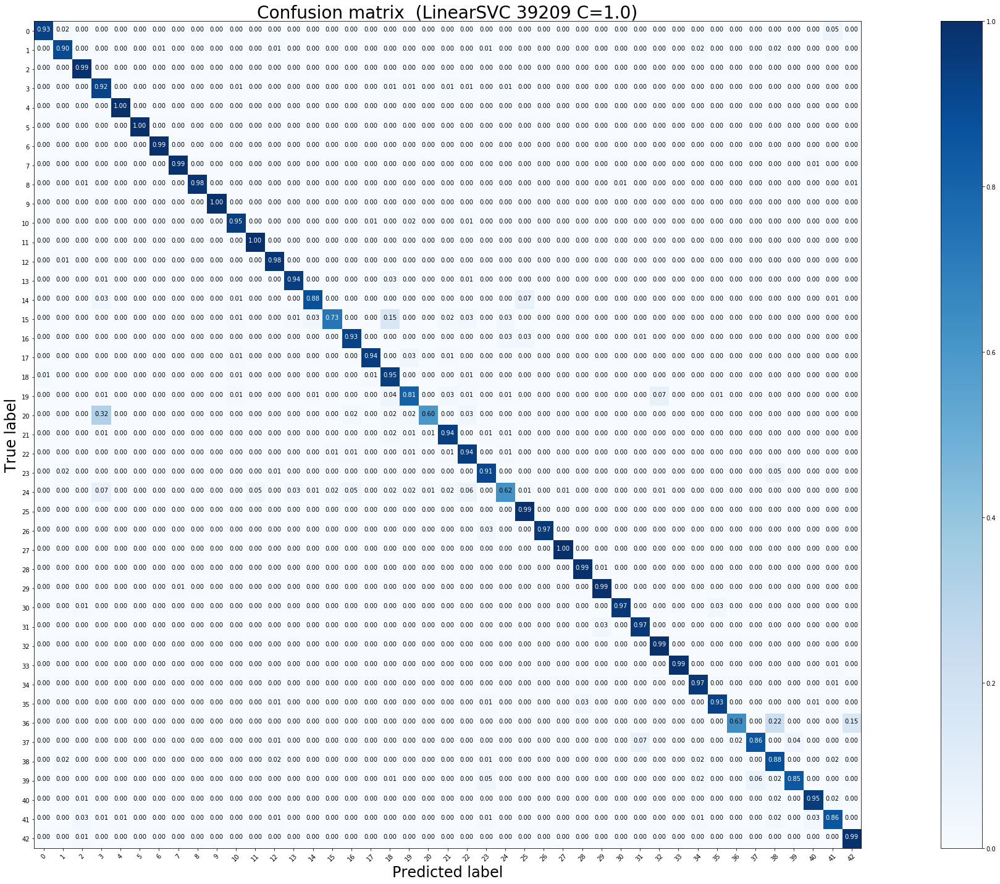

Test accuracy:  0.944972288202692 

              precision    recall  f1-score   support

           0       0.88      0.93      0.90        60
           1       0.95      0.90      0.93       720
          10       0.96      0.99      0.97       660
          11       0.90      0.92      0.91       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.99       270
          15       0.97      0.99      0.98       210
          16       0.98      0.98      0.98       150
          17       1.00      1.00      1.00       360
          18       0.97      0.95      0.96       390
          19       0.88      1.00      0.94        60
           2       0.95      0.98      0.97       750
          20       0.88      0.94      0.91        90
          21       0.91      0.88      0.89        90
          22       0.96      0.73      0.83       120
          23       0.93      0.93      0.93  

In [26]:
##############################################################################
###########   LinearSVC, HOG, seed=1, random_A, without_scaler ###############
##############################################################################

train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 0, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   LinearSVC, HOG, seed=1, random_A, without_scaler ###############
##############    SMOTE, minority k_neighbors = 1 #########
##############################################################################

In [108]:
train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 0, 1, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_without_scaler_smote_minority", "HOG_942_balanced.pkl")

Smote minority


FileNotFoundError: [Errno 2] No such file or directory: 'SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen//500/seed_1_random_A_without_scaler_smote_minority/Trainingszeiten.csv'

In [ ]:
##############################################################################
###########   LinearSVC, HOG, seed=1, random_A, with_scaler without_std ###############
##############################################################################

Daten skalieren ohne std


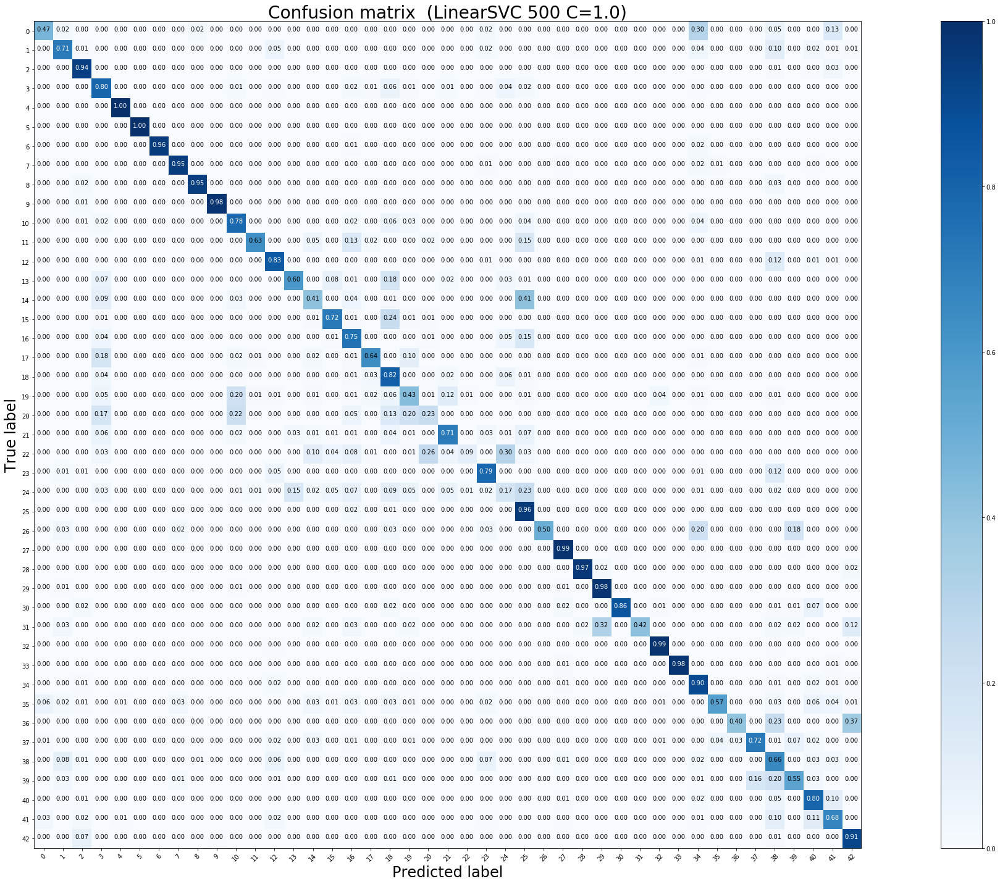

Test accuracy:  0.821298495645289 

              precision    recall  f1-score   support

           0       0.55      0.47      0.50        60
           1       0.87      0.71      0.78       720
          10       0.87      0.94      0.90       660
          11       0.77      0.80      0.78       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.96      0.97       270
          15       0.96      0.95      0.95       210
          16       0.97      0.95      0.96       150
          17       0.99      0.98      0.99       360
          18       0.81      0.78      0.80       390
          19       0.84      0.63      0.72        60
           2       0.83      0.83      0.83       750
          20       0.66      0.60      0.63        90
          21       0.54      0.41      0.47        90
          22       0.80      0.72      0.75       120
          23       0.61      0.75      0.67  

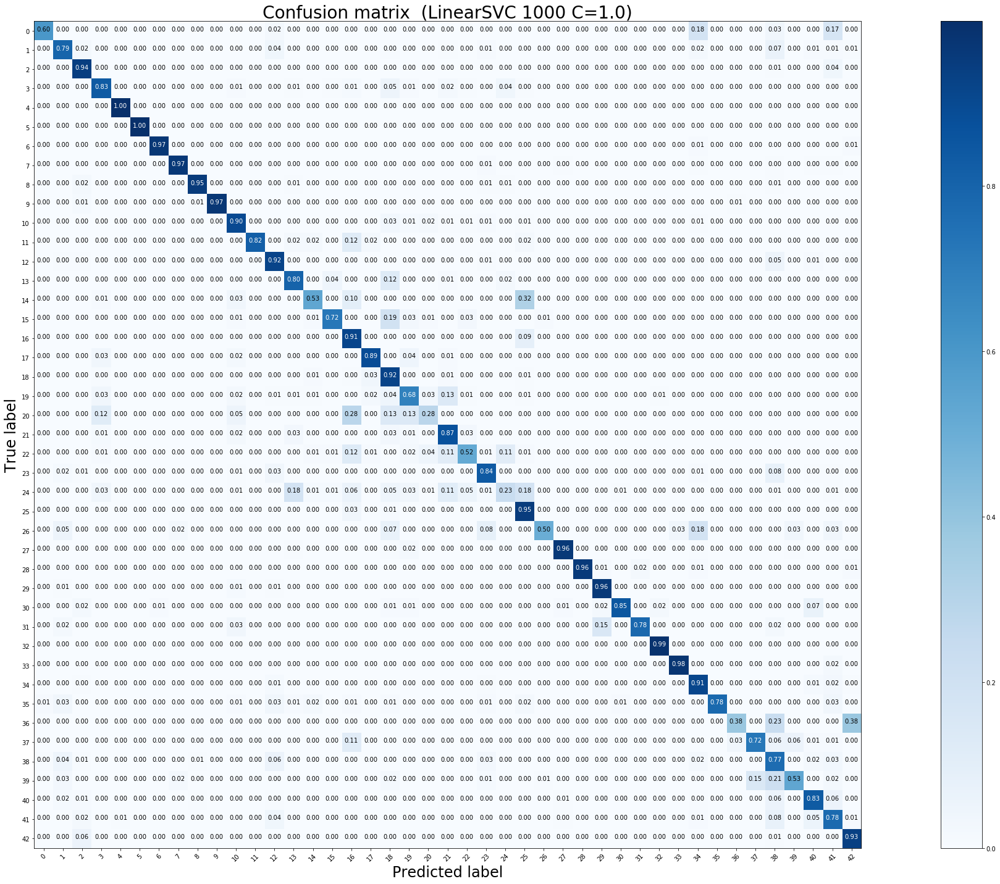

Test accuracy:  0.8723673792557403 

              precision    recall  f1-score   support

           0       0.90      0.60      0.72        60
           1       0.90      0.79      0.84       720
          10       0.88      0.94      0.91       660
          11       0.92      0.83      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.99      0.97      0.98       270
          15       0.95      0.97      0.96       210
          16       0.93      0.95      0.94       150
          17       1.00      0.97      0.98       360
          18       0.92      0.90      0.91       390
          19       1.00      0.82      0.90        60
           2       0.85      0.92      0.88       750
          20       0.63      0.80      0.70        90
          21       0.77      0.53      0.63        90
          22       0.90      0.72      0.80       120
          23       0.61      0.91      0.73 

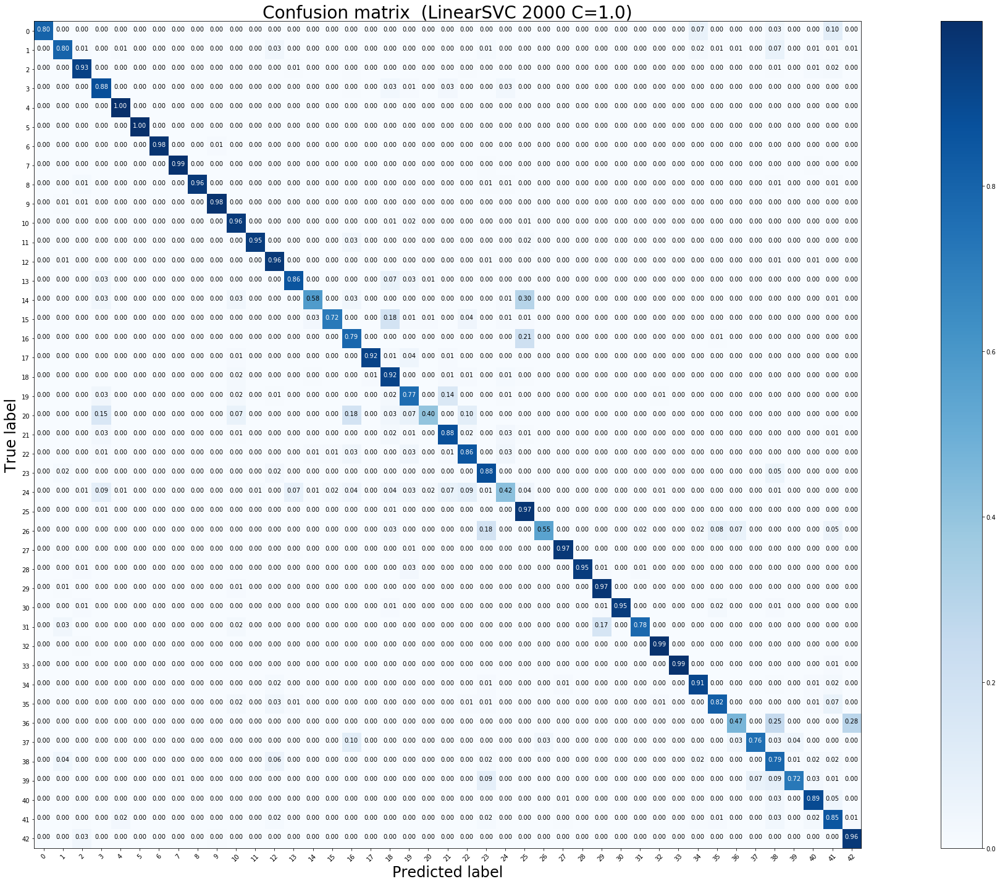

Test accuracy:  0.900633412509897 

              precision    recall  f1-score   support

           0       0.96      0.80      0.87        60
           1       0.92      0.80      0.86       720
          10       0.93      0.93      0.93       660
          11       0.89      0.88      0.88       420
          12       0.97      1.00      0.98       690
          13       1.00      1.00      1.00       720
          14       1.00      0.98      0.99       270
          15       0.97      0.99      0.98       210
          16       0.95      0.96      0.96       150
          17       0.99      0.98      0.98       360
          18       0.92      0.96      0.94       390
          19       0.92      0.95      0.93        60
           2       0.88      0.96      0.92       750
          20       0.80      0.86      0.83        90
          21       0.87      0.58      0.69        90
          22       0.95      0.72      0.82       120
          23       0.73      0.79      0.76  

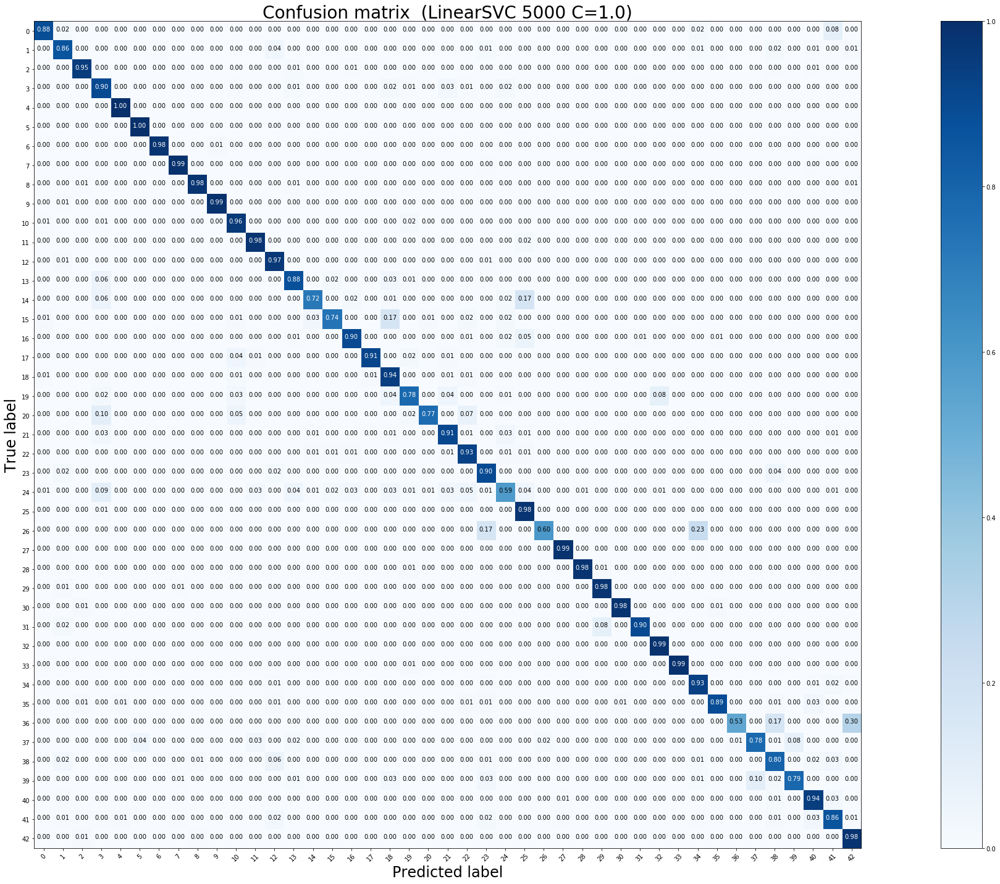

Test accuracy:  0.9243863816310373 

              precision    recall  f1-score   support

           0       0.87      0.88      0.88        60
           1       0.93      0.86      0.89       720
          10       0.97      0.95      0.96       660
          11       0.89      0.90      0.89       420
          12       0.98      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.98      0.98       270
          15       0.95      0.99      0.97       210
          16       0.92      0.98      0.95       150
          17       0.99      0.99      0.99       360
          18       0.94      0.96      0.95       390
          19       0.87      0.98      0.92        60
           2       0.89      0.97      0.93       750
          20       0.76      0.88      0.81        90
          21       0.88      0.72      0.79        90
          22       0.93      0.74      0.82       120
          23       0.90      0.90      0.90 

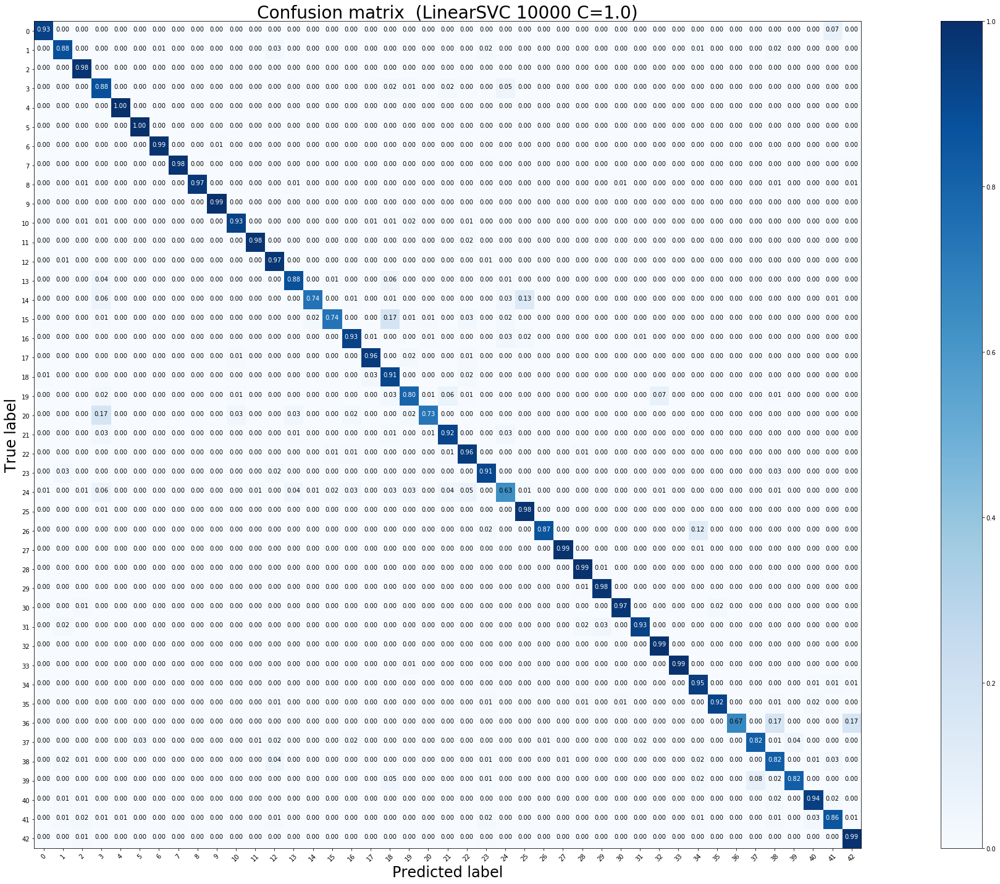

Test accuracy:  0.9319873317498021 

              precision    recall  f1-score   support

           0       0.90      0.93      0.92        60
           1       0.94      0.88      0.91       720
          10       0.95      0.98      0.97       660
          11       0.89      0.88      0.88       420
          12       0.99      1.00      0.99       690
          13       1.00      1.00      1.00       720
          14       0.98      0.99      0.98       270
          15       0.97      0.98      0.98       210
          16       0.97      0.97      0.97       150
          17       0.99      0.99      0.99       360
          18       0.98      0.93      0.95       390
          19       0.92      0.98      0.95        60
           2       0.92      0.97      0.94       750
          20       0.84      0.88      0.86        90
          21       0.94      0.74      0.83        90
          22       0.95      0.74      0.83       120
          23       0.89      0.93      0.91 

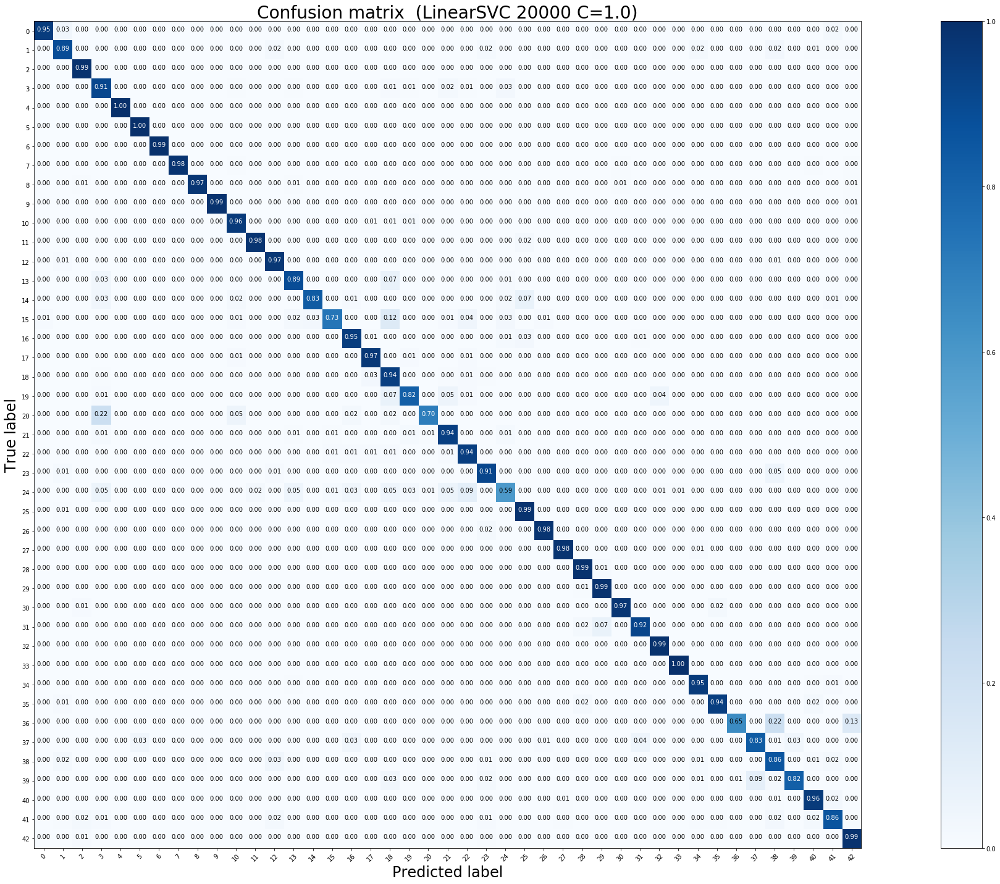

Test accuracy:  0.9407759303246239 

              precision    recall  f1-score   support

           0       0.93      0.95      0.94        60
           1       0.95      0.89      0.92       720
          10       0.97      0.99      0.98       660
          11       0.90      0.91      0.91       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.99      0.99      0.99       270
          15       0.98      0.98      0.98       210
          16       0.97      0.97      0.97       150
          17       1.00      0.99      0.99       360
          18       0.97      0.96      0.96       390
          19       0.94      0.98      0.96        60
           2       0.94      0.97      0.95       750
          20       0.80      0.89      0.84        90
          21       0.91      0.83      0.87        90
          22       0.96      0.73      0.83       120
          23       0.89      0.95      0.92 

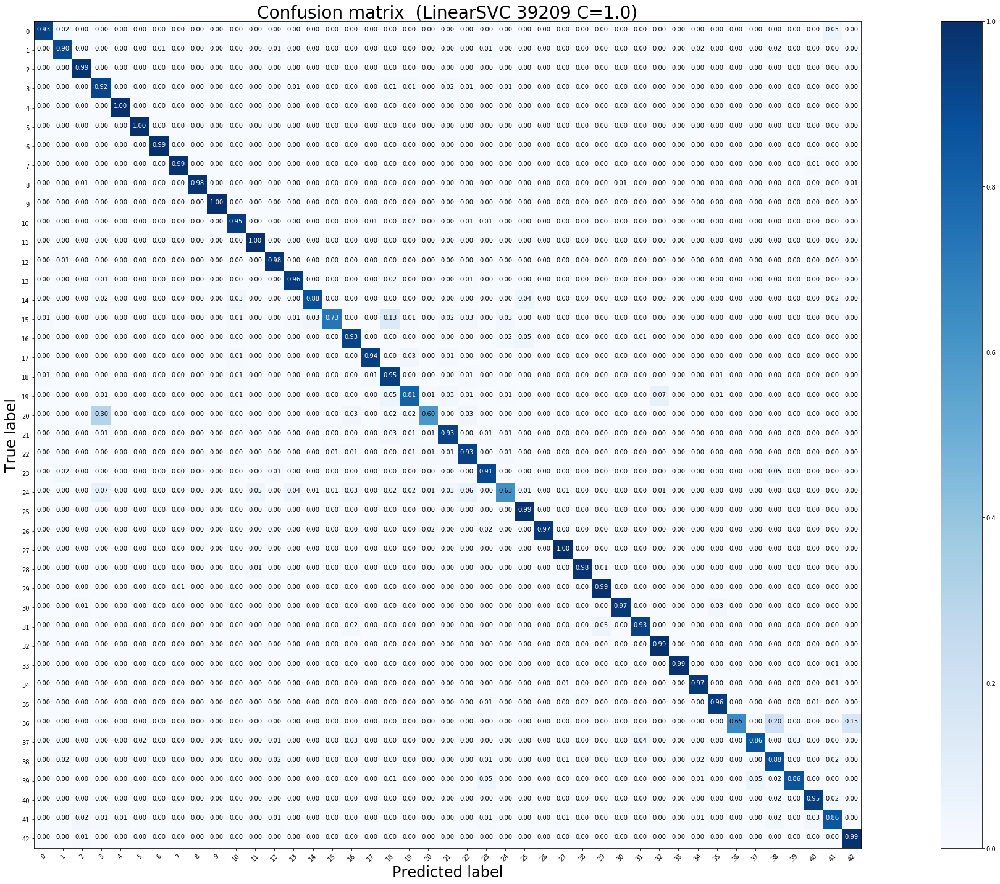

Test accuracy:  0.9447347585114806 

              precision    recall  f1-score   support

           0       0.89      0.93      0.91        60
           1       0.96      0.90      0.93       720
          10       0.96      0.99      0.97       660
          11       0.90      0.92      0.91       420
          12       0.99      1.00      0.99       690
          13       0.99      1.00      1.00       720
          14       0.98      0.99      0.99       270
          15       0.97      0.99      0.98       210
          16       0.98      0.98      0.98       150
          17       1.00      1.00      1.00       360
          18       0.97      0.95      0.96       390
          19       0.87      1.00      0.93        60
           2       0.96      0.98      0.97       750
          20       0.86      0.96      0.91        90
          21       0.90      0.88      0.89        90
          22       0.98      0.73      0.84       120
          23       0.89      0.93      0.91 

In [27]:
train_LinearSVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_LinearSVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 1, 0, 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/LinearSVC/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ###############
##############################################################################

Daten skalieren


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


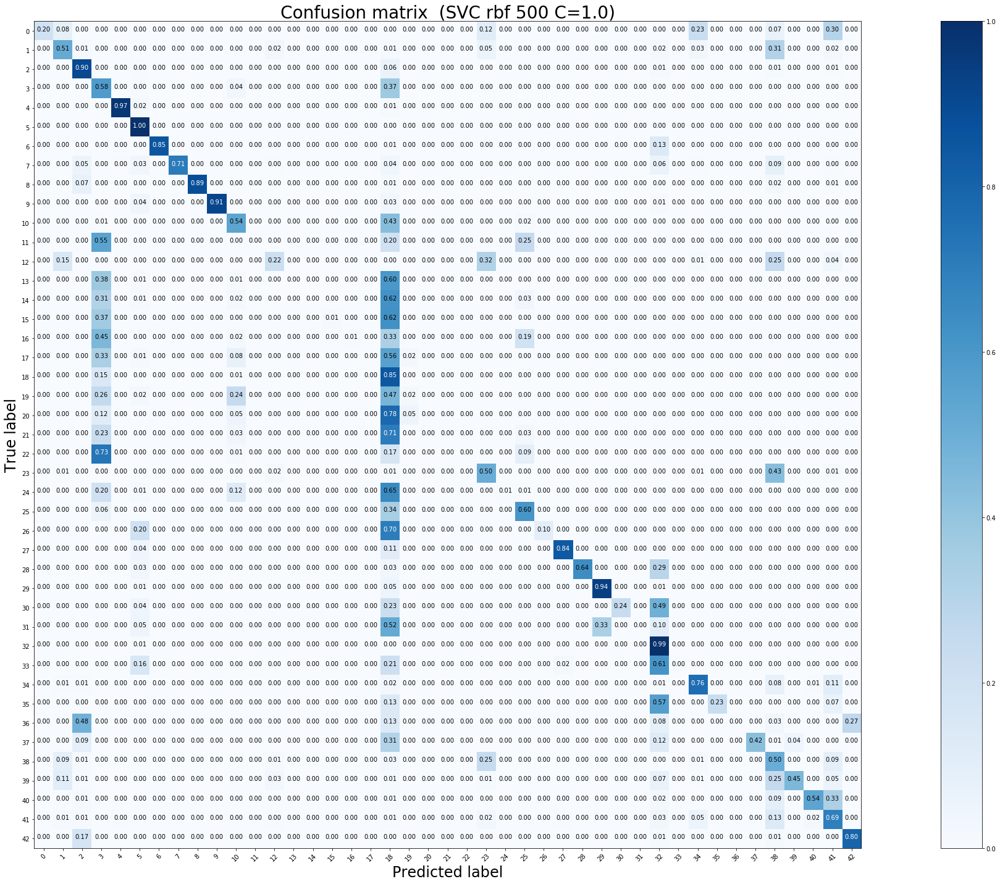

Test accuracy:  0.6220902612826603 

              precision    recall  f1-score   support

           0       1.00      0.20      0.33        60
           1       0.64      0.51      0.57       720
          10       0.77      0.90      0.83       660
          11       0.32      0.58      0.42       420
          12       0.99      0.97      0.98       690
          13       0.87      1.00      0.93       720
          14       1.00      0.85      0.92       270
          15       1.00      0.71      0.83       210
          16       1.00      0.89      0.94       150
          17       1.00      0.91      0.96       360
          18       0.67      0.54      0.60       390
          19       0.00      0.00      0.00        60
           2       0.80      0.22      0.34       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       1.00      0.01      0.02       120
          23       1.00      0.01      0.01 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

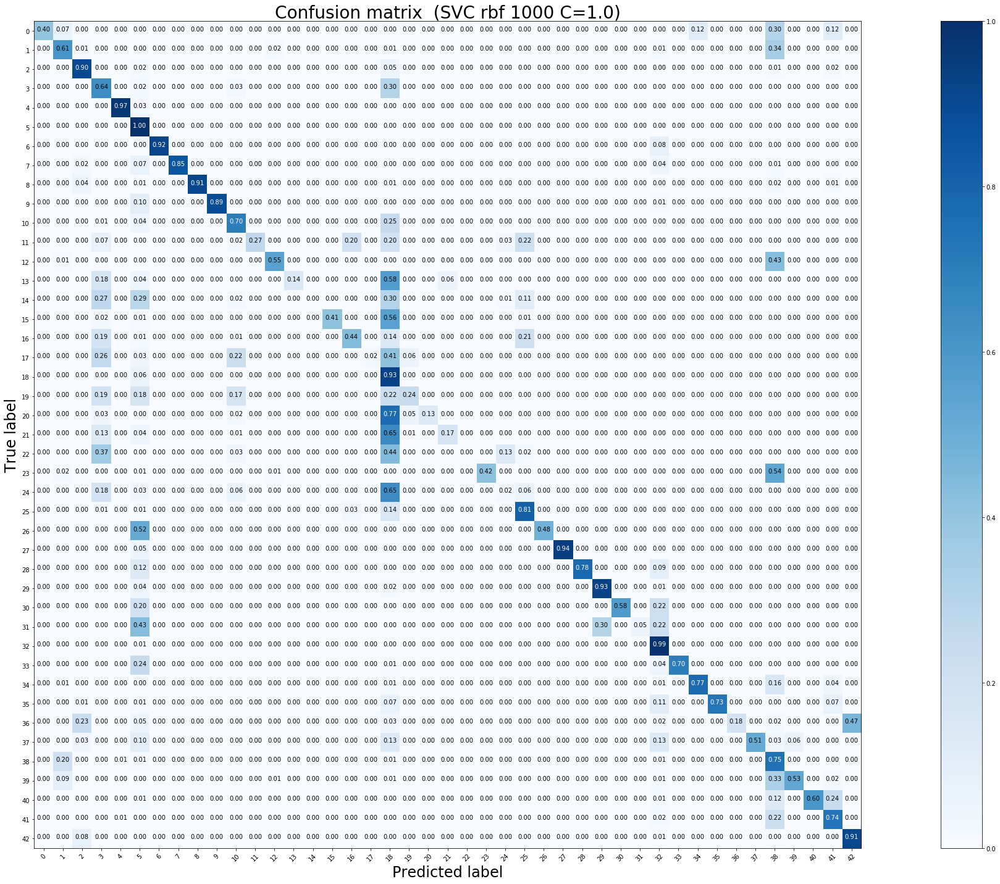

Test accuracy:  0.7197149643705463 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

              precision    recall  f1-score   support

           0       1.00      0.40      0.57        60
           1       0.72      0.61      0.66       720
          10       0.88      0.90      0.89       660
          11       0.55      0.64      0.59       420
          12       0.98      0.97      0.98       690
          13       0.64      1.00      0.78       720
          14       1.00      0.92      0.96       270
          15       1.00      0.85      0.92       210
          16       1.00      0.91      0.95       150
          17       1.00      0.89      0.94       360
          18       0.77      0.70      0.73       390
          19       1.00      0.27      0.42        60
           2       0.95      0.55      0.70       750
          20       1.00      0.14      0.25        90
          21       0.00      0.00      0.00        90
          22       1.00      0.41      0.58       120
          23       0.77      0.44      0.56       150
          24       1.00    

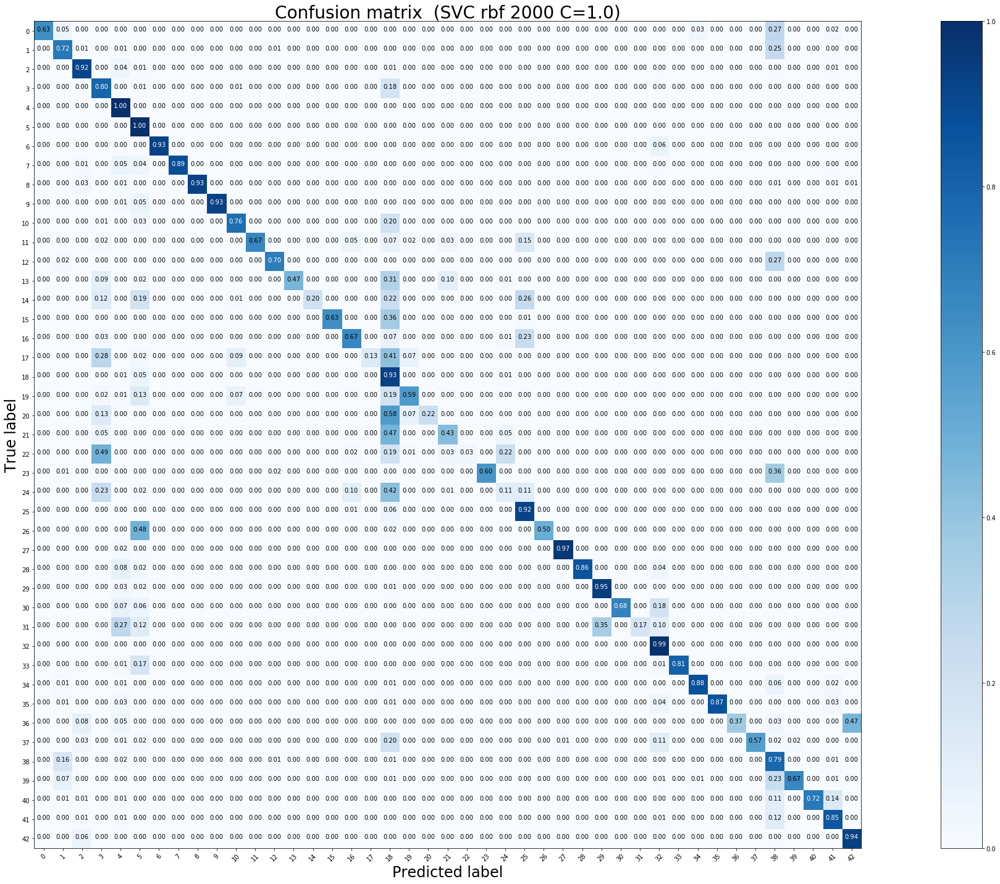

Test accuracy:  0.8026920031670626 

              precision    recall  f1-score   support

           0       1.00      0.63      0.78        60
           1       0.78      0.72      0.75       720
          10       0.92      0.92      0.92       660
          11       0.69      0.80      0.74       420
          12       0.83      1.00      0.91       690
          13       0.78      1.00      0.88       720
          14       1.00      0.93      0.97       270
          15       1.00      0.89      0.94       210
          16       1.00      0.93      0.97       150
          17       1.00      0.93      0.97       360
          18       0.93      0.76      0.84       390
          19       1.00      0.67      0.80        60
           2       0.96      0.70      0.81       750
          20       1.00      0.47      0.64        90
          21       1.00      0.20      0.33        90
          22       1.00      0.63      0.78       120
          23       0.81      0.67      0.73 

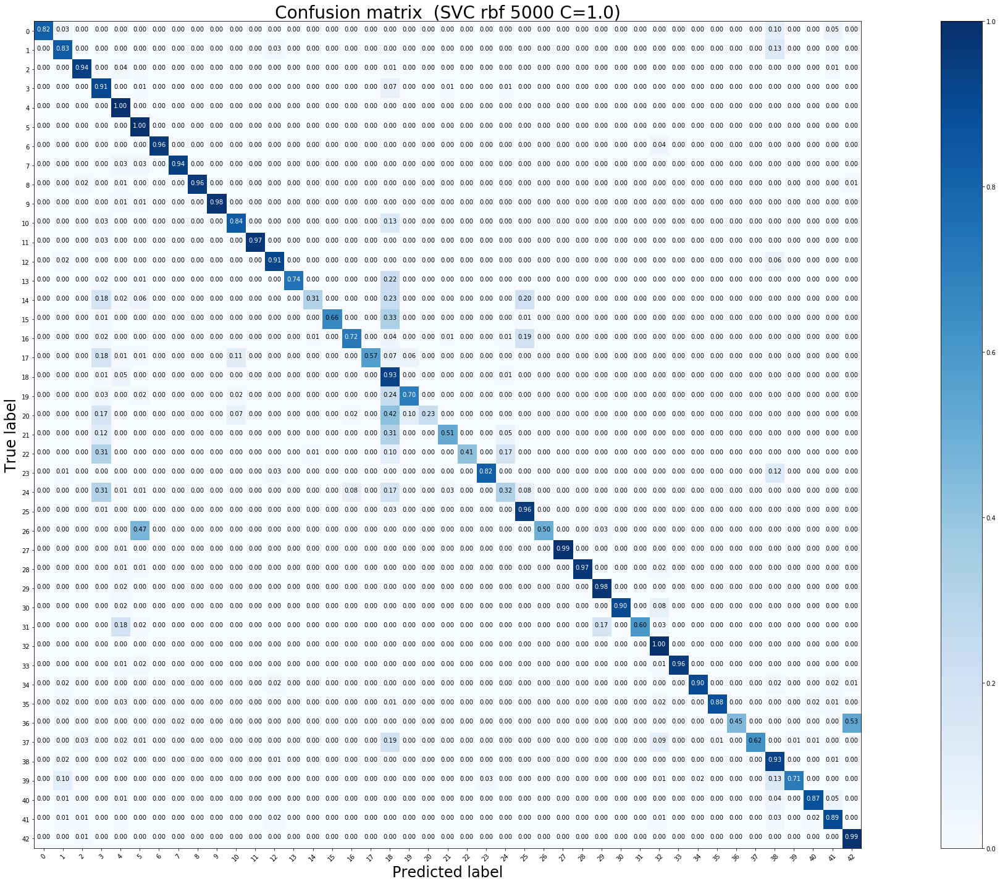

Test accuracy:  0.8832145684877276 

              precision    recall  f1-score   support

           0       1.00      0.82      0.90        60
           1       0.89      0.83      0.86       720
          10       0.97      0.94      0.95       660
          11       0.70      0.91      0.79       420
          12       0.85      1.00      0.92       690
          13       0.92      1.00      0.96       720
          14       1.00      0.96      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.96      0.98       150
          17       1.00      0.98      0.99       360
          18       0.95      0.84      0.89       390
          19       1.00      0.97      0.98        60
           2       0.92      0.91      0.91       750
          20       1.00      0.74      0.85        90
          21       0.93      0.31      0.47        90
          22       1.00      0.66      0.79       120
          23       0.89      0.72      0.80 

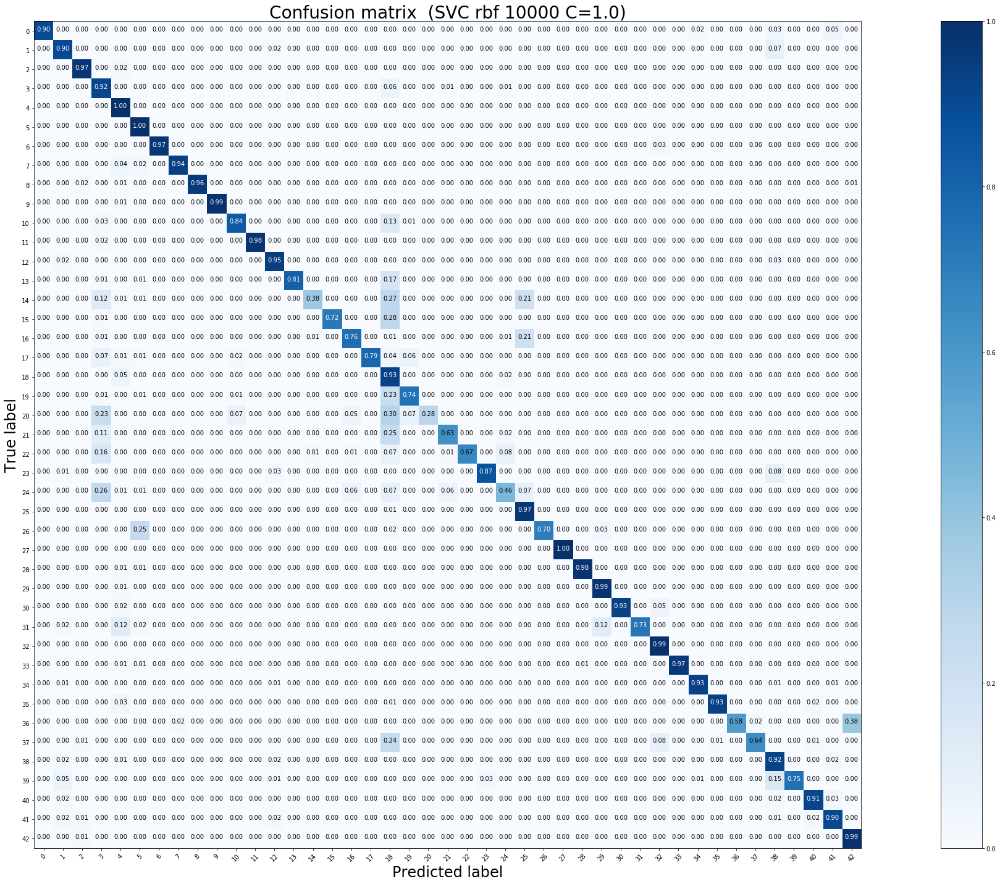

Test accuracy:  0.9111638954869359 

              precision    recall  f1-score   support

           0       1.00      0.90      0.95        60
           1       0.90      0.90      0.90       720
          10       0.97      0.97      0.97       660
          11       0.76      0.92      0.83       420
          12       0.88      1.00      0.94       690
          13       0.95      1.00      0.97       720
          14       1.00      0.97      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.96      0.98       150
          17       1.00      0.99      1.00       360
          18       0.98      0.84      0.90       390
          19       1.00      0.98      0.99        60
           2       0.94      0.95      0.94       750
          20       1.00      0.81      0.90        90
          21       0.94      0.38      0.54        90
          22       1.00      0.72      0.83       120
          23       0.89      0.76      0.82 

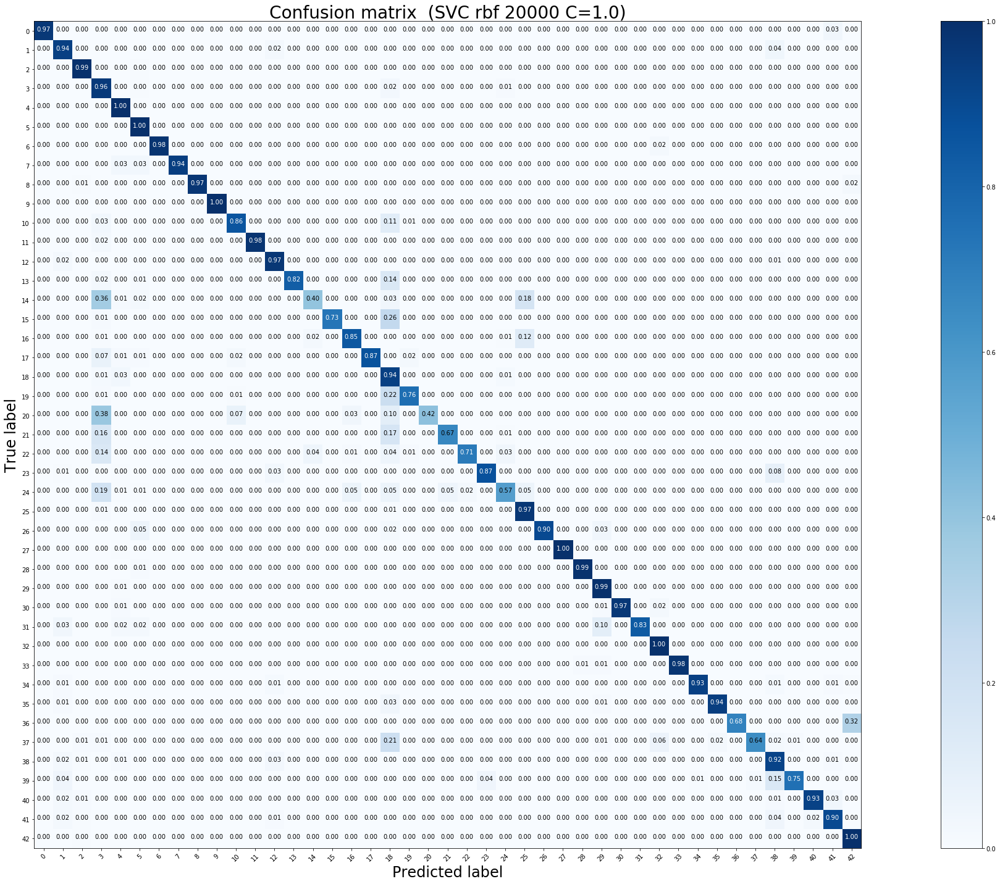

Test accuracy:  0.9275534441805225 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.92      0.94      0.93       720
          10       0.98      0.99      0.99       660
          11       0.72      0.96      0.82       420
          12       0.94      1.00      0.97       690
          13       0.96      1.00      0.98       720
          14       1.00      0.98      0.99       270
          15       1.00      0.94      0.97       210
          16       1.00      0.97      0.99       150
          17       1.00      1.00      1.00       360
          18       0.98      0.86      0.91       390
          19       1.00      0.98      0.99        60
           2       0.93      0.97      0.95       750
          20       1.00      0.82      0.90        90
          21       0.84      0.40      0.54        90
          22       1.00      0.73      0.85       120
          23       0.91      0.85      0.88 

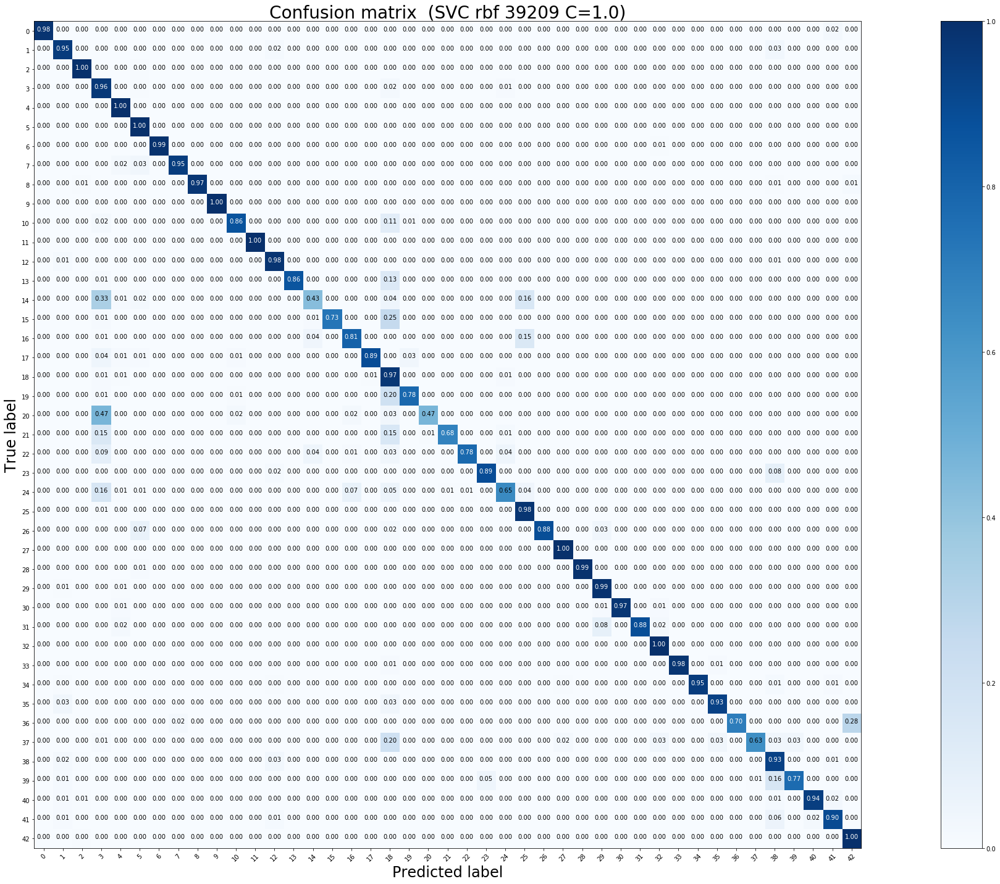

Test accuracy:  0.9359461599366588 

              precision    recall  f1-score   support

           0       1.00      0.98      0.99        60
           1       0.94      0.95      0.95       720
          10       0.98      1.00      0.99       660
          11       0.75      0.96      0.84       420
          12       0.97      1.00      0.98       690
          13       0.97      1.00      0.98       720
          14       1.00      0.99      0.99       270
          15       0.99      0.95      0.97       210
          16       1.00      0.97      0.99       150
          17       1.00      1.00      1.00       360
          18       0.99      0.86      0.92       390
          19       1.00      1.00      1.00        60
           2       0.94      0.98      0.96       750
          20       1.00      0.86      0.92        90
          21       0.78      0.43      0.56        90
          22       1.00      0.73      0.85       120
          23       0.90      0.81      0.85 

In [43]:
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 2, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ###############
###########     SMOTE minority k_Neighbors=1
##############################################################################

Daten skalieren
Smote minority


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


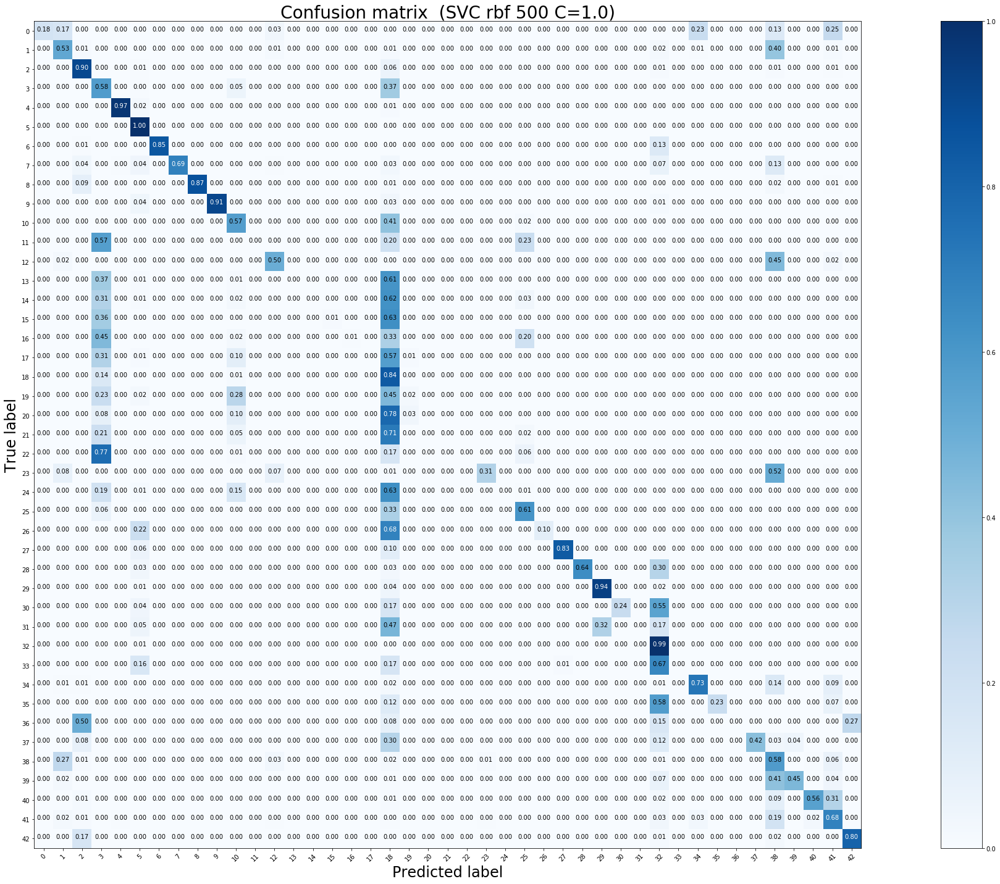

Test accuracy:  0.6351543942992874 

              precision    recall  f1-score   support

           0       1.00      0.18      0.31        60
           1       0.61      0.53      0.57       720
          10       0.78      0.90      0.84       660
          11       0.33      0.58      0.42       420
          12       0.99      0.97      0.98       690
          13       0.86      1.00      0.93       720
          14       1.00      0.85      0.92       270
          15       1.00      0.69      0.81       210
          16       1.00      0.87      0.93       150
          17       1.00      0.91      0.96       360
          18       0.63      0.57      0.60       390
          19       0.00      0.00      0.00        60
           2       0.85      0.50      0.63       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       1.00      0.01      0.02       120
          23       1.00      0.01      0.01 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Smote minority


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


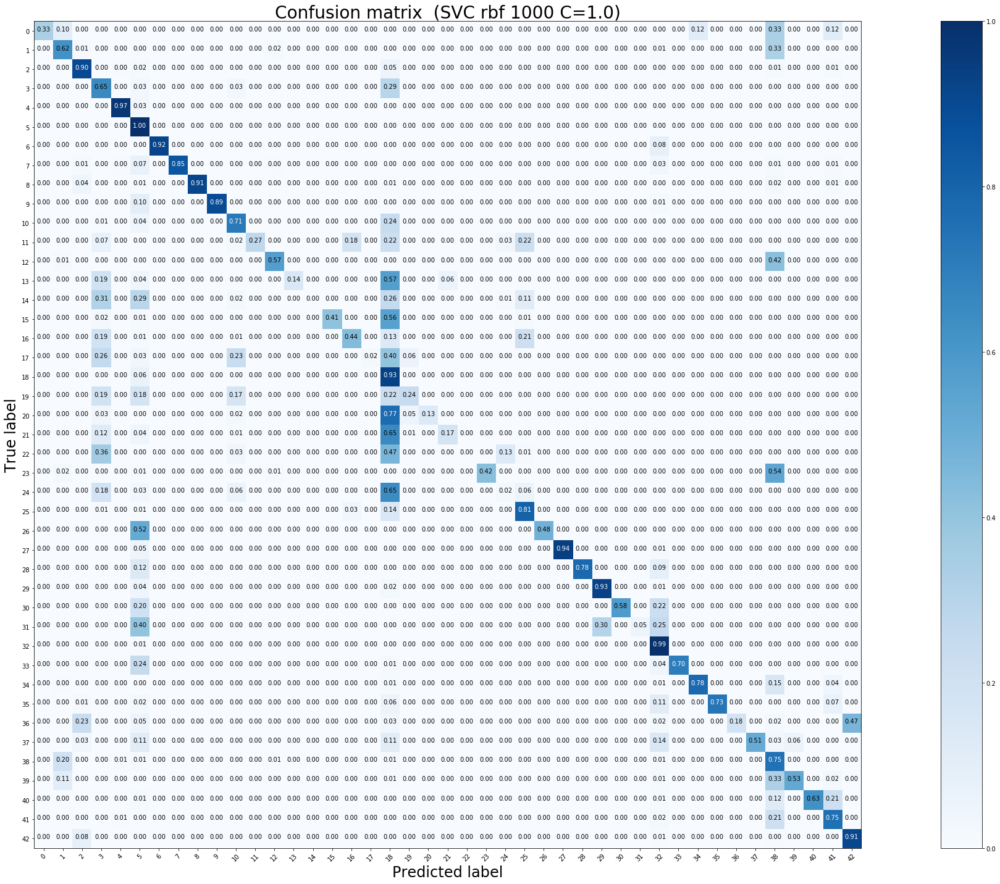

Test accuracy:  0.7240696753760887 

              precision    recall  f1-score   support

           0       1.00      0.33      0.50        60
           1       0.73      0.62      0.67       720
          10       0.88      0.90      0.89       660
          11       0.55      0.65      0.60       420
          12       0.98      0.97      0.98       690
          13       0.64      1.00      0.78       720
          14       1.00      0.92      0.96       270
          15       1.00      0.85      0.92       210
          16       1.00      0.91      0.95       150
          17       1.00      0.89      0.94       360
          18       0.77      0.71      0.74       390
          19       1.00      0.27      0.42        60
           2       0.96      0.57      0.71       750
          20       1.00      0.14      0.25        90
          21       0.00      0.00      0.00        90
          22       1.00      0.41      0.58       120
          23       0.77      0.44      0.56 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)



Smote minority


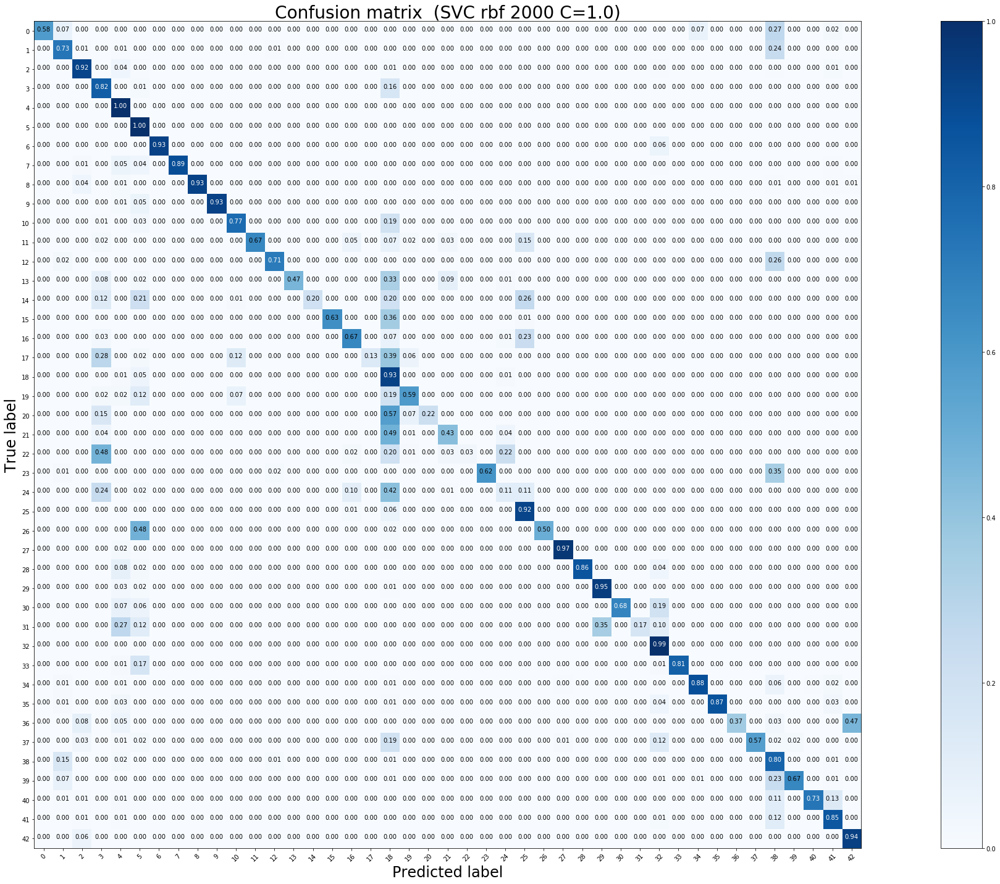

Test accuracy:  0.8060174188440221 

              precision    recall  f1-score   support

           0       1.00      0.58      0.74        60
           1       0.79      0.73      0.76       720
          10       0.91      0.92      0.92       660
          11       0.70      0.82      0.75       420
          12       0.83      1.00      0.90       690
          13       0.79      1.00      0.88       720
          14       1.00      0.93      0.97       270
          15       1.00      0.89      0.94       210
          16       1.00      0.93      0.96       150
          17       1.00      0.93      0.97       360
          18       0.92      0.77      0.84       390
          19       1.00      0.67      0.80        60
           2       0.96      0.71      0.82       750
          20       1.00      0.47      0.64        90
          21       1.00      0.20      0.33        90
          22       1.00      0.63      0.78       120
          23       0.81      0.67      0.73 

KeyboardInterrupt: 

In [105]:
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")

Daten skalieren
Smote minority


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


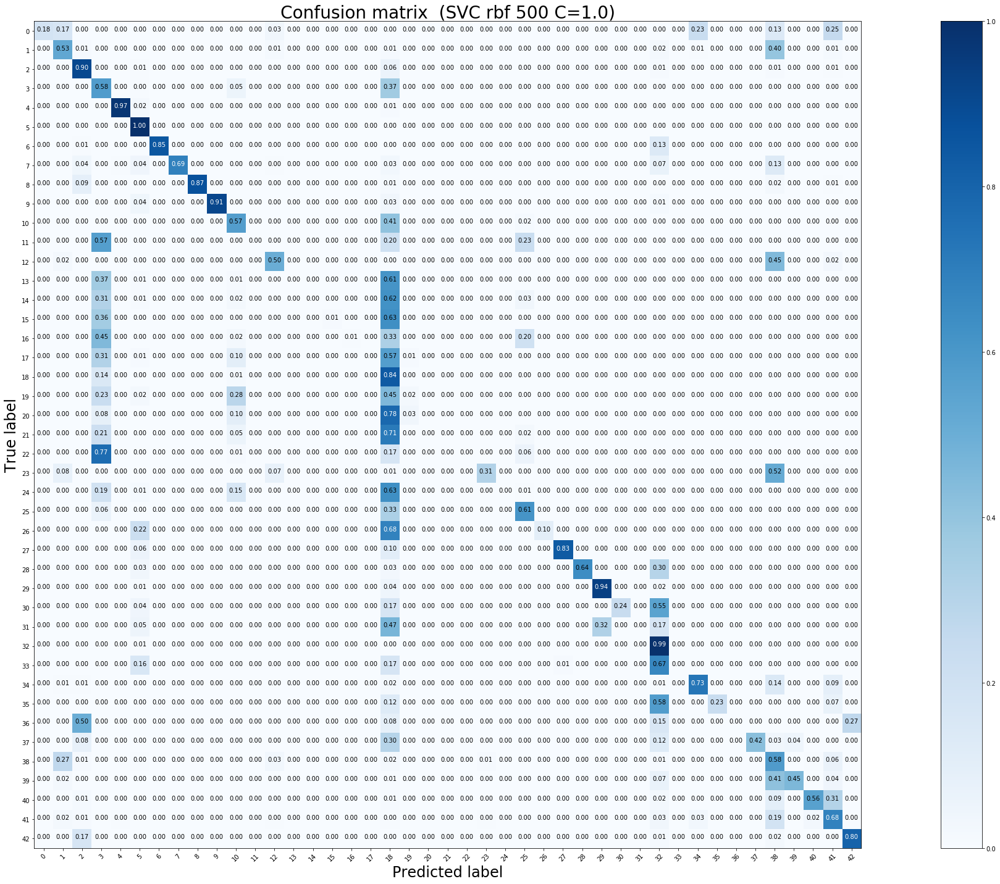

Test accuracy:  0.6351543942992874 

              precision    recall  f1-score   support

           0       1.00      0.18      0.31        60
           1       0.61      0.53      0.57       720
          10       0.78      0.90      0.84       660
          11       0.33      0.58      0.42       420
          12       0.99      0.97      0.98       690
          13       0.86      1.00      0.93       720
          14       1.00      0.85      0.92       270
          15       1.00      0.69      0.81       210
          16       1.00      0.87      0.93       150
          17       1.00      0.91      0.96       360
          18       0.63      0.57      0.60       390
          19       0.00      0.00      0.00        60
           2       0.85      0.50      0.63       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       1.00      0.01      0.02       120
          23       1.00      0.01      0.01 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Smote minority


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


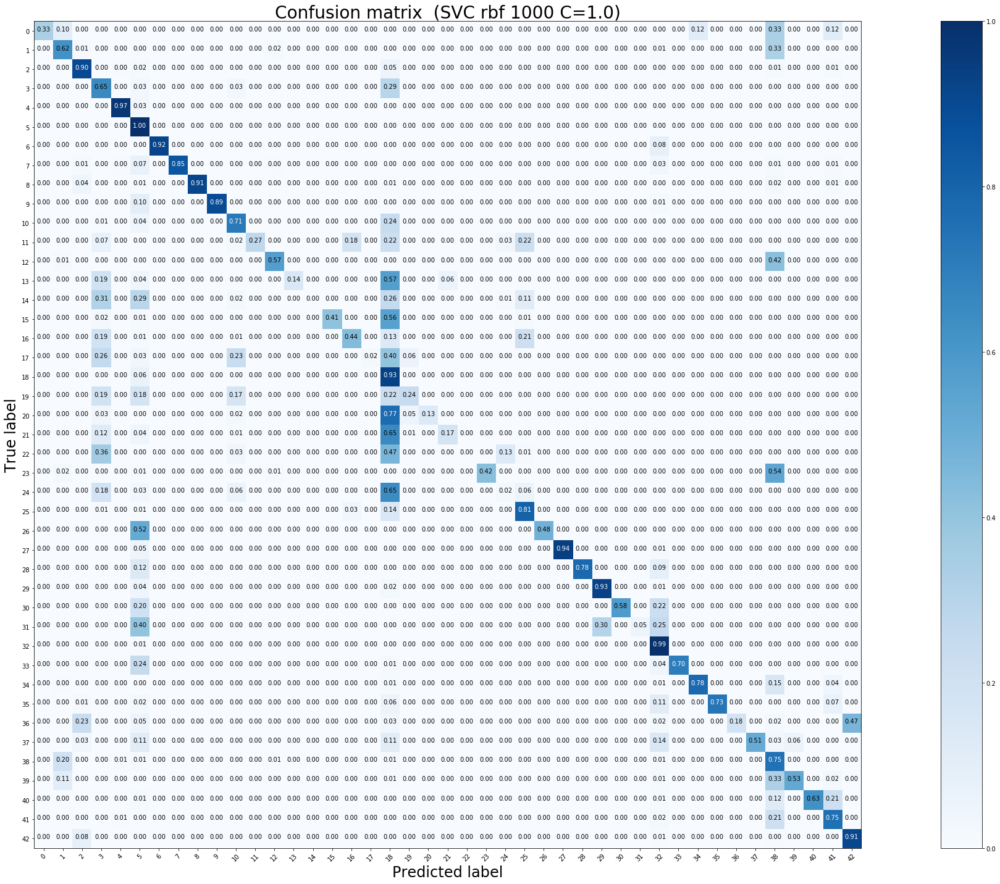

Test accuracy:  0.7240696753760887 

              precision    recall  f1-score   support

           0       1.00      0.33      0.50        60
           1       0.73      0.62      0.67       720
          10       0.88      0.90      0.89       660
          11       0.55      0.65      0.60       420
          12       0.98      0.97      0.98       690
          13       0.64      1.00      0.78       720
          14       1.00      0.92      0.96       270
          15       1.00      0.85      0.92       210
          16       1.00      0.91      0.95       150
          17       1.00      0.89      0.94       360
          18       0.77      0.71      0.74       390
          19       1.00      0.27      0.42        60
           2       0.96      0.57      0.71       750
          20       1.00      0.14      0.25        90
          21       0.00      0.00      0.00        90
          22       1.00      0.41      0.58       120
          23       0.77      0.44      0.56 

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


Smote minority


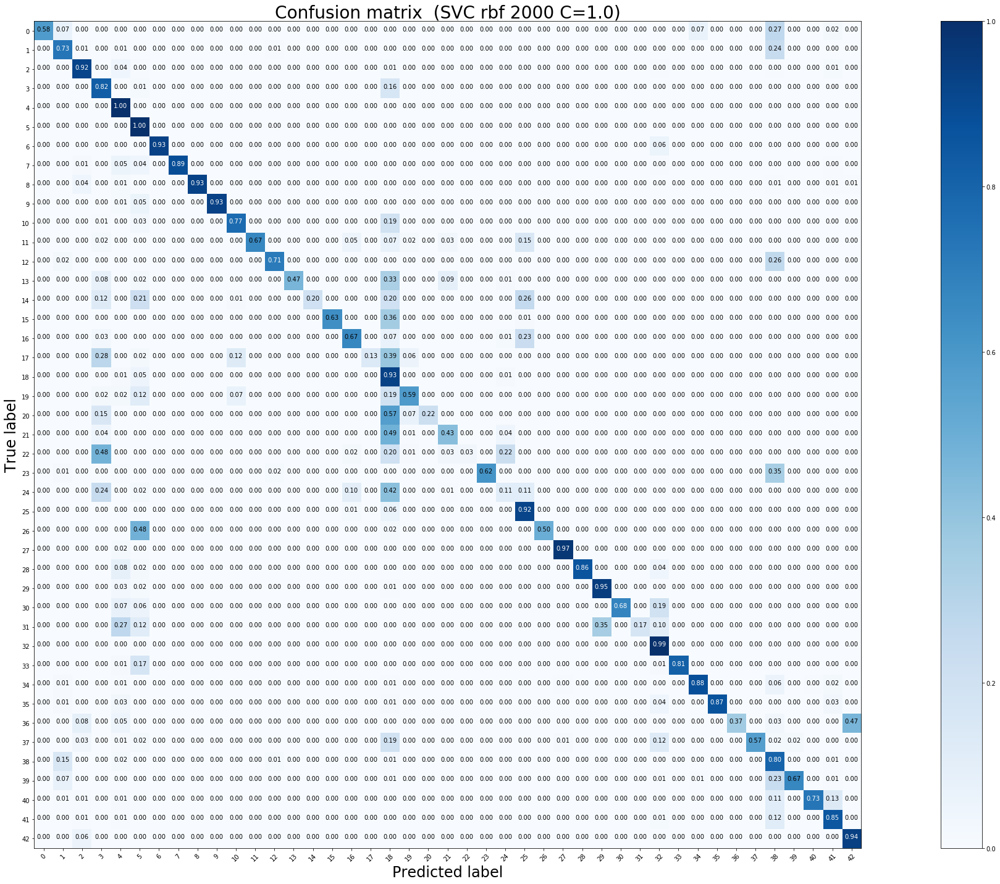

Test accuracy:  0.8060174188440221 

              precision    recall  f1-score   support

           0       1.00      0.58      0.74        60
           1       0.79      0.73      0.76       720
          10       0.91      0.92      0.92       660
          11       0.70      0.82      0.75       420
          12       0.83      1.00      0.90       690
          13       0.79      1.00      0.88       720
          14       1.00      0.93      0.97       270
          15       1.00      0.89      0.94       210
          16       1.00      0.93      0.96       150
          17       1.00      0.93      0.97       360
          18       0.92      0.77      0.84       390
          19       1.00      0.67      0.80        60
           2       0.96      0.71      0.82       750
          20       1.00      0.47      0.64        90
          21       1.00      0.20      0.33        90
          22       1.00      0.63      0.78       120
          23       0.81      0.67      0.73 

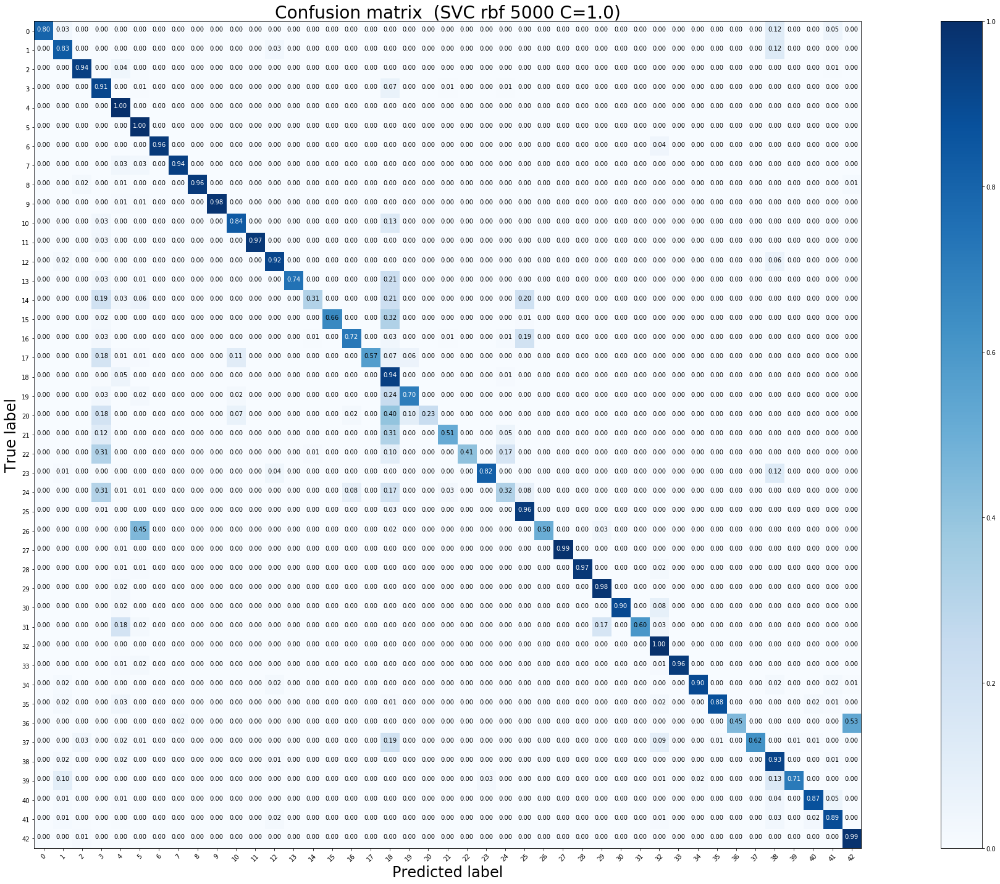

Test accuracy:  0.8841646872525732 

              precision    recall  f1-score   support

           0       1.00      0.80      0.89        60
           1       0.89      0.83      0.86       720
          10       0.97      0.94      0.96       660
          11       0.69      0.91      0.79       420
          12       0.85      1.00      0.92       690
          13       0.92      1.00      0.96       720
          14       1.00      0.96      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.96      0.98       150
          17       1.00      0.98      0.99       360
          18       0.95      0.84      0.89       390
          19       1.00      0.97      0.98        60
           2       0.91      0.92      0.91       750
          20       1.00      0.74      0.85        90
          21       0.93      0.31      0.47        90
          22       1.00      0.66      0.79       120
          23       0.89      0.72      0.80 

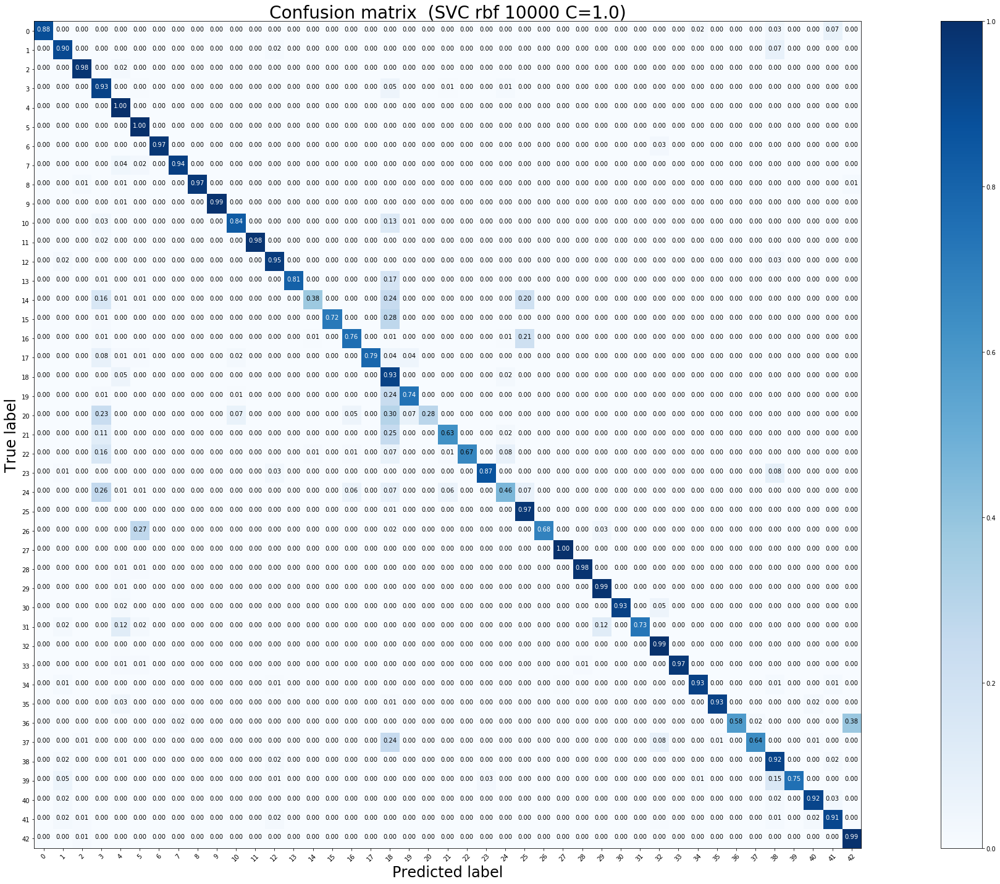

Test accuracy:  0.9119556611243073 

              precision    recall  f1-score   support

           0       1.00      0.88      0.94        60
           1       0.90      0.90      0.90       720
          10       0.97      0.98      0.97       660
          11       0.76      0.93      0.83       420
          12       0.89      1.00      0.94       690
          13       0.95      1.00      0.97       720
          14       1.00      0.97      0.98       270
          15       0.99      0.94      0.97       210
          16       1.00      0.97      0.98       150
          17       1.00      0.99      1.00       360
          18       0.98      0.84      0.90       390
          19       1.00      0.98      0.99        60
           2       0.93      0.95      0.94       750
          20       1.00      0.81      0.90        90
          21       0.94      0.38      0.54        90
          22       1.00      0.72      0.83       120
          23       0.89      0.76      0.82 

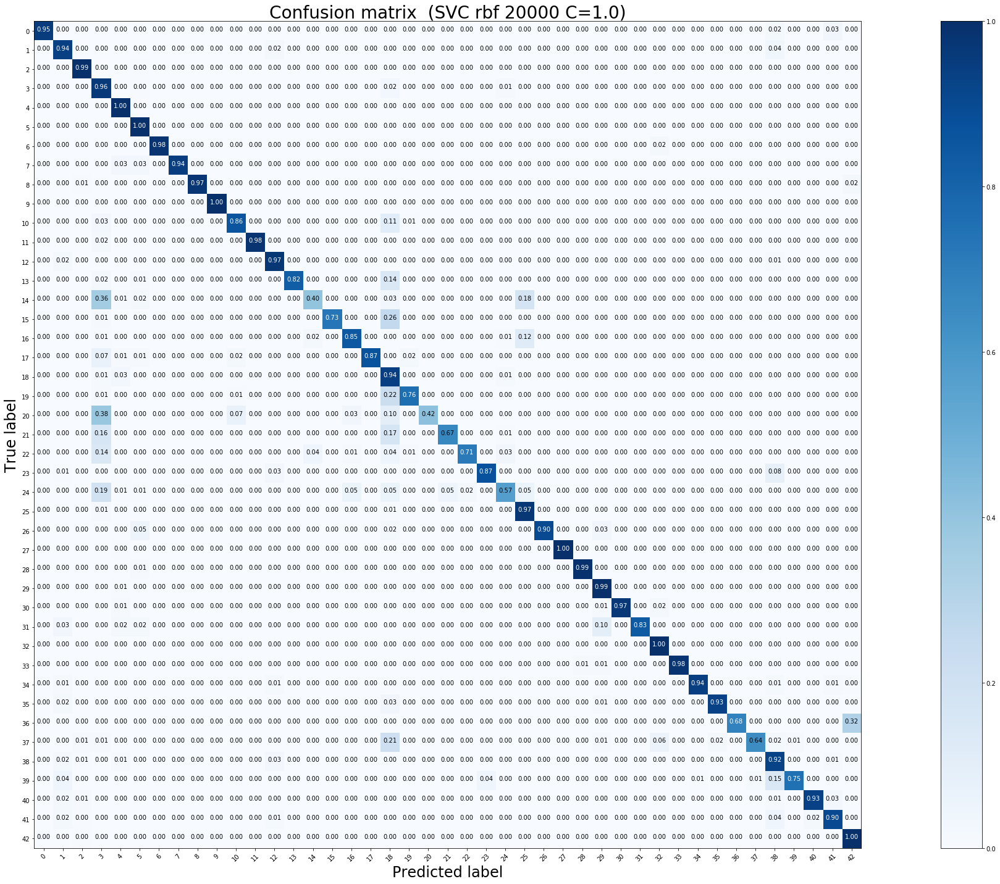

Test accuracy:  0.9277909738717339 

              precision    recall  f1-score   support

           0       1.00      0.95      0.97        60
           1       0.91      0.94      0.93       720
          10       0.98      0.99      0.99       660
          11       0.72      0.96      0.82       420
          12       0.94      1.00      0.97       690
          13       0.96      1.00      0.98       720
          14       1.00      0.98      0.99       270
          15       1.00      0.94      0.97       210
          16       1.00      0.97      0.99       150
          17       1.00      1.00      1.00       360
          18       0.98      0.86      0.92       390
          19       1.00      0.98      0.99        60
           2       0.93      0.97      0.95       750
          20       1.00      0.82      0.90        90
          21       0.84      0.40      0.54        90
          22       1.00      0.73      0.85       120
          23       0.91      0.85      0.88 

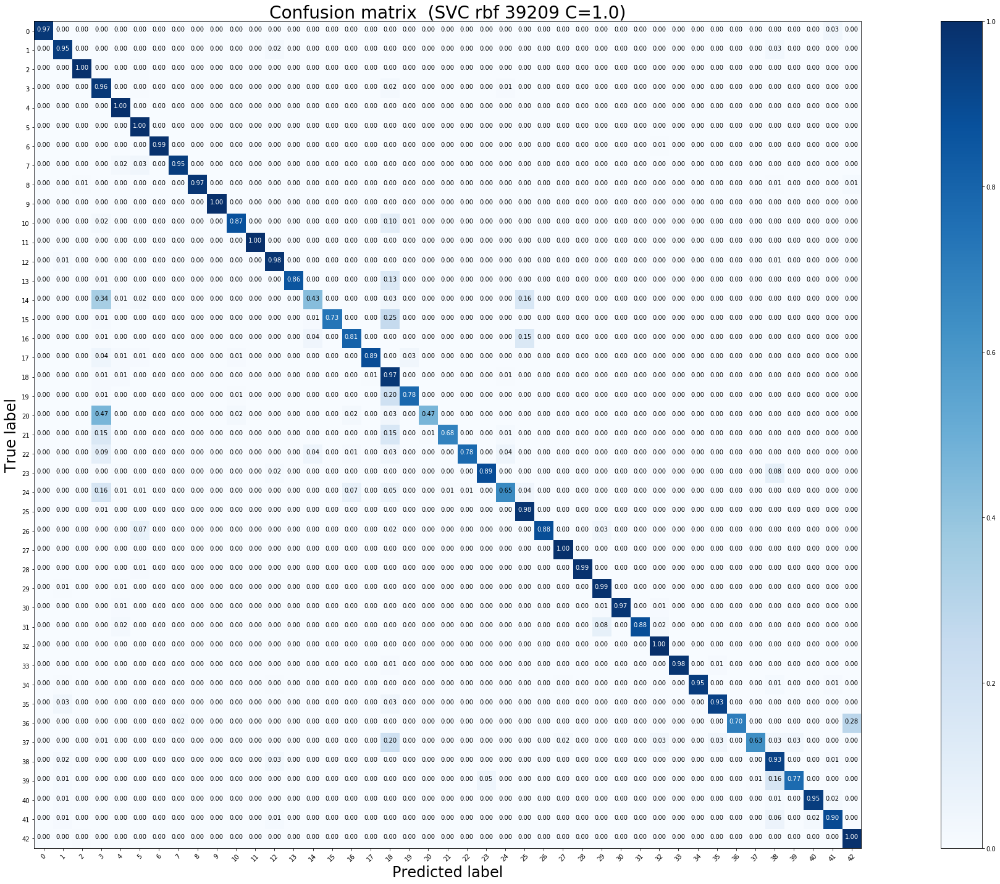

Test accuracy:  0.9363420427553444 

              precision    recall  f1-score   support

           0       1.00      0.97      0.98        60
           1       0.94      0.95      0.94       720
          10       0.98      1.00      0.99       660
          11       0.75      0.96      0.84       420
          12       0.97      1.00      0.98       690
          13       0.97      1.00      0.98       720
          14       1.00      0.99      0.99       270
          15       0.99      0.95      0.97       210
          16       1.00      0.97      0.99       150
          17       1.00      1.00      1.00       360
          18       0.99      0.87      0.93       390
          19       1.00      1.00      1.00        60
           2       0.94      0.98      0.96       750
          20       1.00      0.86      0.92        90
          21       0.78      0.43      0.56        90
          22       1.00      0.73      0.85       120
          23       0.90      0.81      0.85 

In [106]:
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 2, 1, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_smote_minority", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ###############
###########    without mean     ######
###########   SEHR SCHLECHT      nicht verwenden !!!!!!!! ##########
##############################################################################

Daten skalieren ohne mean


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


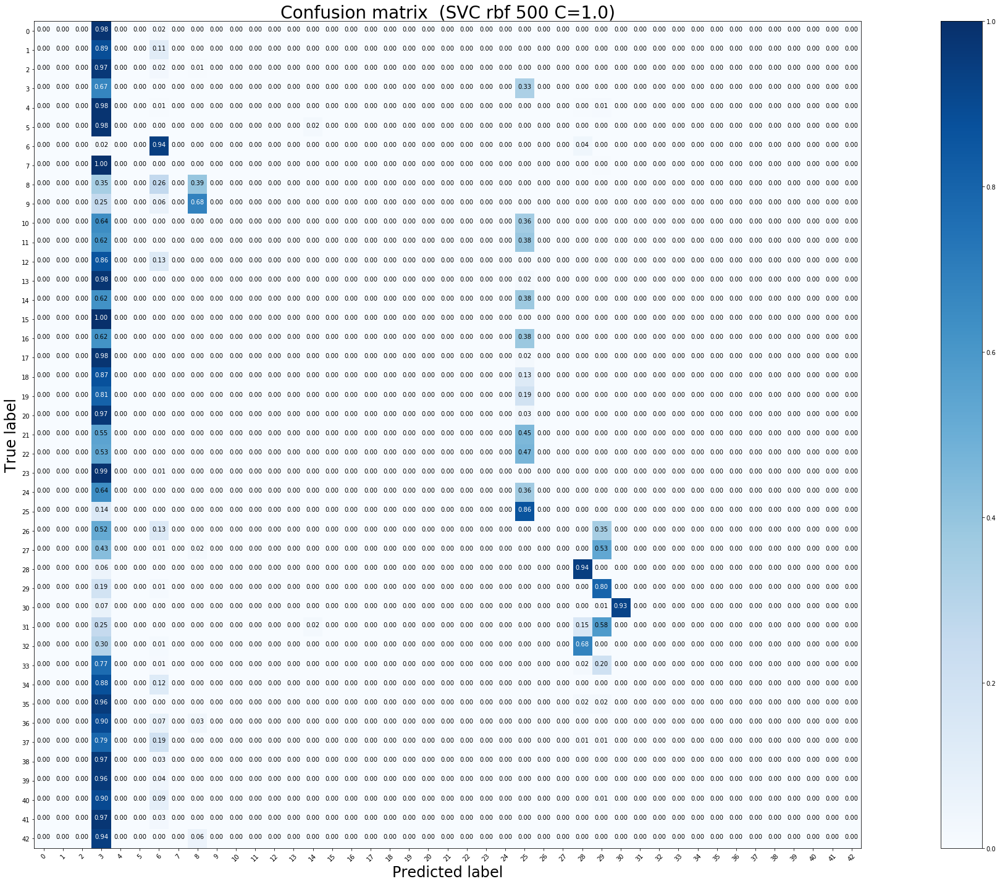

Test accuracy:  0.10799683293745052 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.00      0.00      0.00       720
          10       0.00      0.00      0.00       660
          11       0.03      0.67      0.06       420
          12       0.00      0.00      0.00       690
          13       0.00      0.00      0.00       720
          14       0.35      0.94      0.51       270
          15       0.00      0.00      0.00       210
          16       0.17      0.39      0.24       150
          17       0.00      0.00      0.00       360
          18       0.00      0.00      0.00       390
          19       0.00      0.00      0.00        60
           2       0.00      0.00      0.00       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       0.00      0.00      0.00       120
          23       0.00      0.00      0.00

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


KeyboardInterrupt: 

In [97]:
#train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")
#train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 3, 0, 'ovo', 'balanced',
 #              "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_mean", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, with_scaler ###############
###########    without std ############################
######    SEHR SCHLECHT   NICHT VERWENDEN !!!!! ###########################
##############################################################################

Daten skalieren ohne std


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


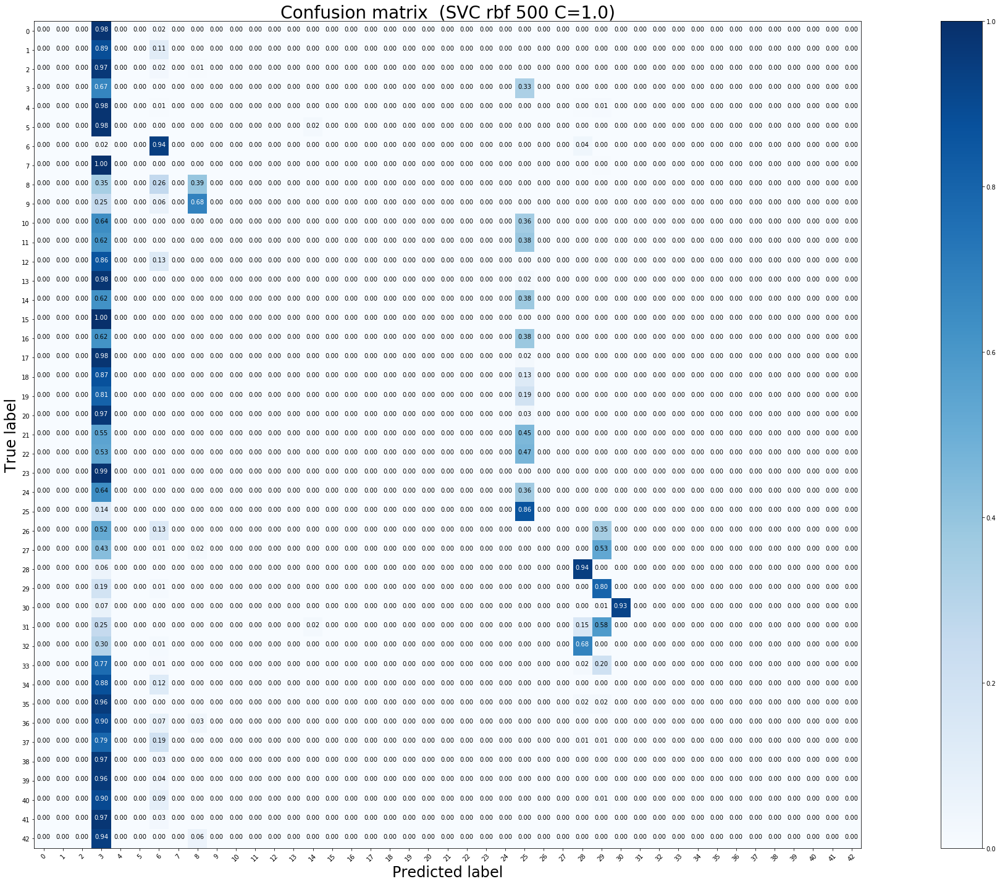

Test accuracy:  0.10799683293745052 



C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.00      0.00      0.00       720
          10       0.00      0.00      0.00       660
          11       0.03      0.67      0.06       420
          12       0.00      0.00      0.00       690
          13       0.00      0.00      0.00       720
          14       0.35      0.94      0.51       270
          15       0.00      0.00      0.00       210
          16       0.17      0.39      0.24       150
          17       0.00      0.00      0.00       360
          18       0.00      0.00      0.00       390
          19       0.00      0.00      0.00        60
           2       0.00      0.00      0.00       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       0.00      0.00      0.00       120
          23       0.00      0.00      0.00       150
          24       0.00    

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


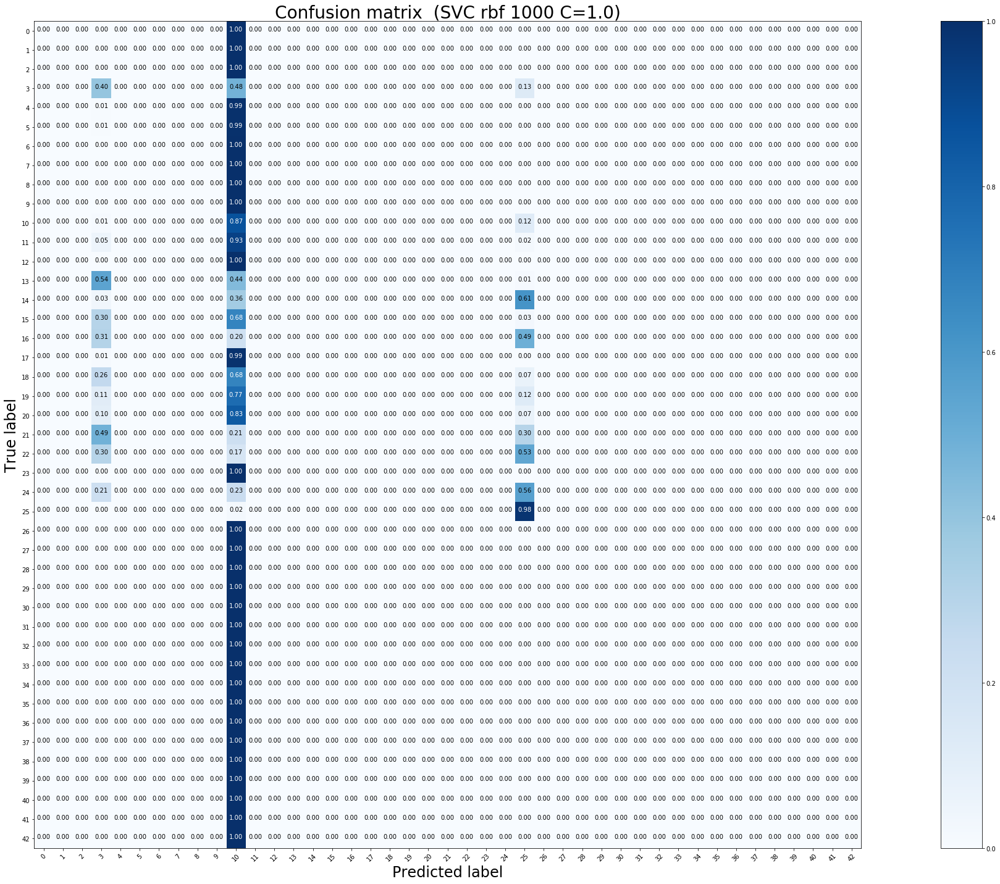

Test accuracy:  0.06096595407759303 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.00      0.00      0.00       720
          10       0.00      0.00      0.00       660
          11       0.28      0.40      0.33       420
          12       0.00      0.00      0.00       690
          13       0.00      0.00      0.00       720
          14       0.00      0.00      0.00       270
          15       0.00      0.00      0.00       210
          16       0.00      0.00      0.00       150
          17       0.00      0.00      0.00       360
          18       0.03      0.87      0.06       390
          19       0.00      0.00      0.00        60
           2       0.00      0.00      0.00       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       0.00      0.00      0.00       120
          23       0.00      0.00      0.00

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarn

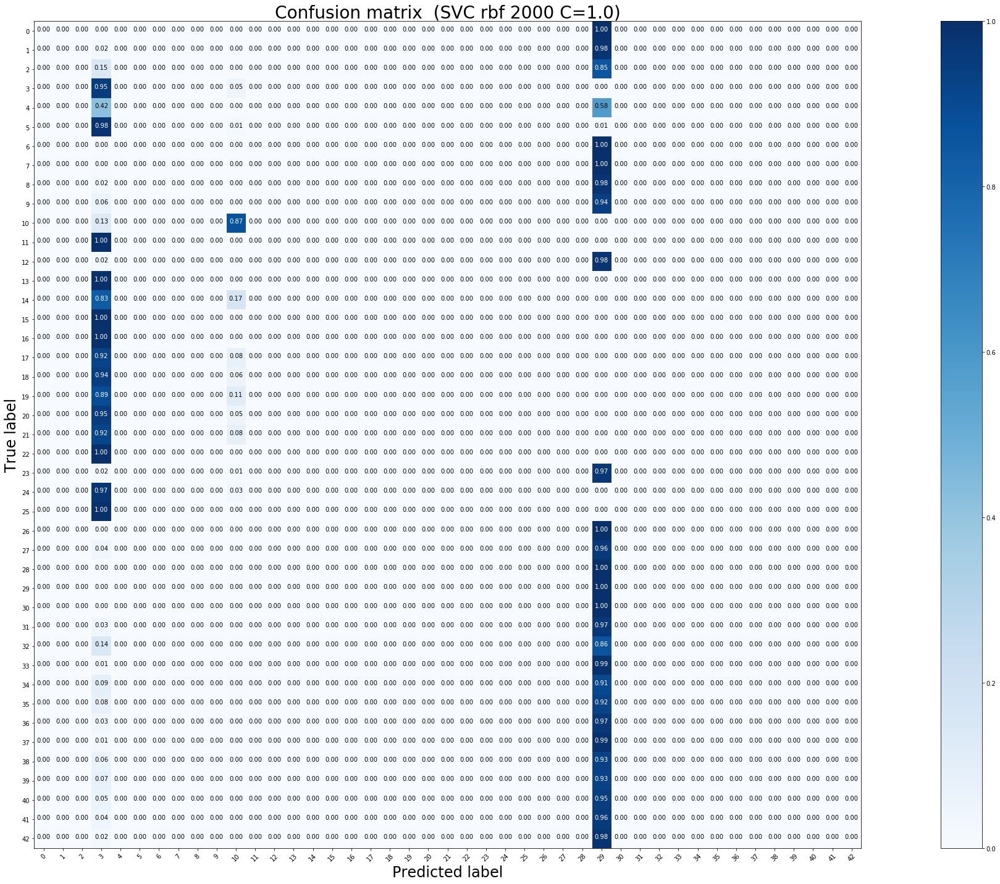

Test accuracy:  0.08931116389548693 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.00      0.00      0.00       720
          10       0.00      0.00      0.00       660
          11       0.11      0.95      0.19       420
          12       0.00      0.00      0.00       690
          13       0.00      0.00      0.00       720
          14       0.00      0.00      0.00       270
          15       0.00      0.00      0.00       210
          16       0.00      0.00      0.00       150
          17       0.00      0.00      0.00       360
          18       0.72      0.87      0.79       390
          19       0.00      0.00      0.00        60
           2       0.00      0.00      0.00       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       0.00      0.00      0.00       120
          23       0.00      0.00      0.00

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


KeyboardInterrupt: 

In [92]:
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 1, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_with_scaler_without_std", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
###########   SVC RBF, HOG, seed=1, random_A, ohne Scaler ###############
###########    ############################
#####    SEHR SCHLECHT   NICHT VERWENDEN !!! ###########################
##############################################################################

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: F-score is ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


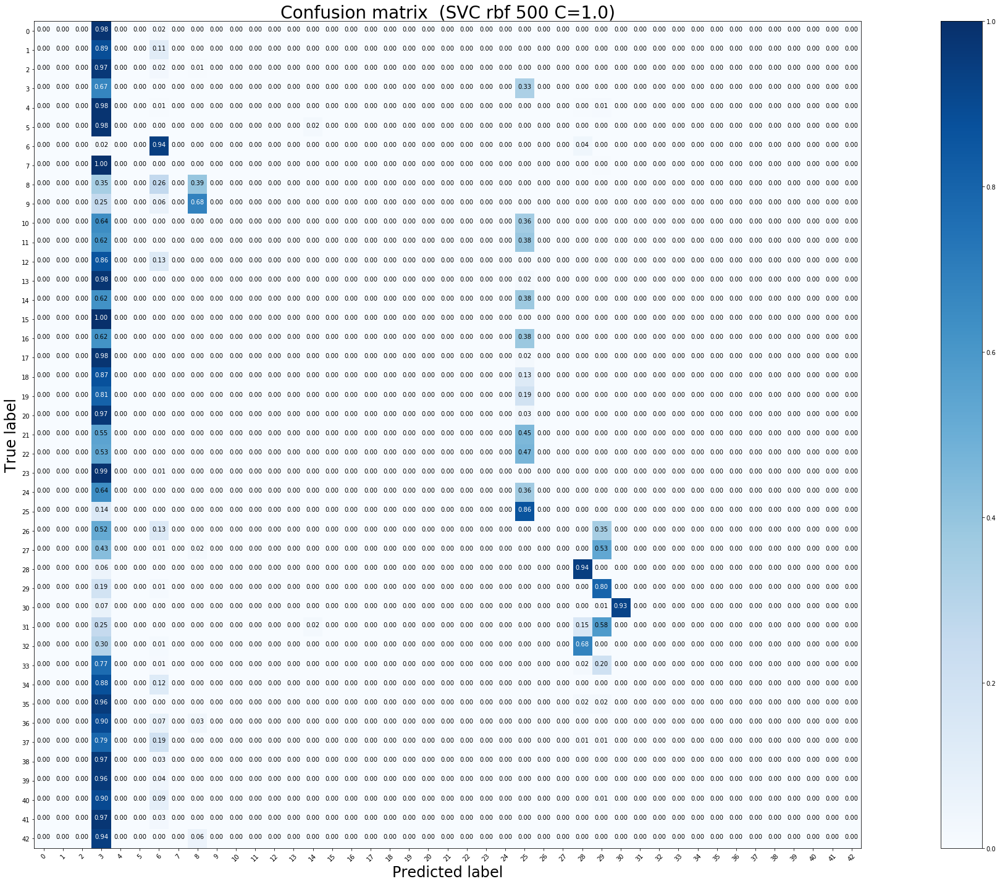

Test accuracy:  0.10799683293745052 

              precision    recall  f1-score   support

           0       0.00      0.00      0.00        60
           1       0.00      0.00      0.00       720
          10       0.00      0.00      0.00       660
          11       0.03      0.67      0.06       420
          12       0.00      0.00      0.00       690
          13       0.00      0.00      0.00       720
          14       0.35      0.94      0.51       270
          15       0.00      0.00      0.00       210
          16       0.17      0.39      0.24       150
          17       0.00      0.00      0.00       360
          18       0.00      0.00      0.00       390
          19       0.00      0.00      0.00        60
           2       0.00      0.00      0.00       750
          20       0.00      0.00      0.00        90
          21       0.00      0.00      0.00        90
          22       0.00      0.00      0.00       120
          23       0.00      0.00      0.00

C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)
C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\metrics\classification.py:1437: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in labels with no predicted samples.
  'precision', 'predicted', average, warn_for)


KeyboardInterrupt: 

In [93]:
train_RBF_SVC(X_tr_500, X_test_9_4_2, y_tr_500, y_test, 1, '500',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_1000, X_test_9_4_2, y_tr_1000, y_test, 1, '1000',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_2000, X_test_9_4_2, y_tr_2000, y_test, 1, '2000',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_5000, X_test_9_4_2, y_tr_5000, y_test, 1, '5000',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_10000, X_test_9_4_2, y_tr_10000, y_test, 1, '10000',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr_20000, X_test_9_4_2, y_tr_20000, y_test, 1, '20000',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")
train_RBF_SVC(X_tr, X_test_9_4_2, y_tr, y_test, 1, '39209',1.0, 'auto', 0, 0, 'ovo', 'balanced',
               "SVM_Modelle_GTSRB/Hog_default/rbf/Neue Mengen/", "seed_1_random_A_without_scaler", "HOG_942_balanced.pkl")

In [ ]:
##############################################################################
############### Covariate Shift Test #########################################
############### Klassenverteilungen plotten ##################################
############### 3 Hauptkomponenten plotten ###################################
##############################################################################

In [68]:
# test nach jedem train test split
def make_training_subsets_A_covariate(X_tr, y_tr):
    # Trainingsdaten mischen, da diese ursprünglich sortiert vorliegen
    X_tr, y_tr = shuffle(X_tr, y_tr, random_state=42)    
    # Trainingsmenge mit 20.000 Bilder erzeugen
    X_tr_20000, X_te_2, y_tr_20000, y_te_2 = train_test_split(
        X_tr, y_tr, random_state = 0, train_size=20000/39209, stratify=y_tr)
    # Trainingsmenge mit 10.000 Bilder erzeugen
    X_tr_10000, X_te_3, y_tr_10000, y_te_3 = train_test_split(
        X_tr_20000, y_tr_20000, random_state = 0, train_size=1/2, stratify=y_tr_20000)
    # Trainingsmenge mit 5.000 Bilder erzeugen   
    X_tr_5000, X_te_4, y_tr_5000, y_te_4 = train_test_split(
        X_tr_10000, y_tr_10000, random_state = 0, train_size=1/2, stratify=y_tr_10000)
    # Trainingsmenge mit 2.000 Bilder erzeugen   
    X_tr_2000, X_te_5, y_tr_2000, y_te_5 = train_test_split(
        X_tr_5000, y_tr_5000, random_state = 0, train_size=2/5, stratify=y_tr_5000)
    # Trainingsmenge mit 1.000 Bilder erzeugen   
    X_tr_1000, X_te_6, y_tr_1000, y_te_6 = train_test_split(
        X_tr_2000, y_tr_2000, random_state = 0, train_size=1/2, stratify=y_tr_2000)
    # Trainingsmenge mit 500 Bilder erzeugen   
    X_tr_500, X_te_7, y_tr_500, y_te_7 = train_test_split(
        X_tr_1000, y_tr_1000, random_state = 0, train_size=1/2, stratify=y_tr_1000)
    # Trainingsmenge mit 200 Bilder erzeugen   
    X_tr_200, X_te_8, y_tr_200, y_te_8 = train_test_split(
        X_tr_500, y_tr_500, random_state = 0, train_size=2/5, stratify=y_tr_500)
    return X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200, X_te_2, X_te_3, X_te_4, X_te_5, X_te_6, X_te_7, X_te_8

make_training_subsets_A_covariate(X_train_9_4_2, y_train)
check_covariate_shift2(X_train_9_4_2, X_test_9_4_2)
check_covariate_shift2(X_tr_20000, X_test_9_4_2)
check_covariate_shift2(X_tr_10000, X_test_9_4_2)
check_covariate_shift2(X_tr_5000, X_test_9_4_2)
check_covariate_shift2(X_tr_2000, X_test_9_4_2)
check_covariate_shift2(X_tr_1000, X_test_9_4_2)
check_covariate_shift2(X_tr_500, X_test_9_4_2)
check_covariate_shift2(X_tr_200, X_test_9_4_2)

check_covariate_shift2(X_tr_20000, X_te_2)
check_covariate_shift2(X_tr_10000, X_te_3)
check_covariate_shift2(X_tr_5000, X_te_4)
check_covariate_shift2(X_tr_2000, X_te_5)
check_covariate_shift2(X_tr_1000, X_te_6)
check_covariate_shift2(X_tr_500, X_te_7)
check_covariate_shift2(X_tr_200, X_te_8)

Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5549911939320571
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5591728859857482
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5541430126682502
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5403387965162312
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5350668052256532
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5195808788598575
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.4968642121931908
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5014707046714173


NameError: name 'X_te_2' is not defined

In [64]:
def check_covariate_shift2(X_train, X_test):
    # hinzufügen einer Spalte um identifizieren zu können, ob Merkmalsvektor
    # ein Trainingsmerkmalsvektor ist oder nicht
    
    
    
    Z = pd.DataFrame(X_train)
    X = pd.DataFrame(X_test)
    Z['train_data'] = 1
    X['train_data'] = 0
    
    XZ = pd.concat([X, Z], ignore_index=True, axis=0)
    
    labels = XZ['train_data'].values
    XZ = XZ.drop('train_data', axis=1).values
    X, Z = X.values, Z.values
    clf = RandomForestClassifier(max_depth=2)
    predictions = np.zeros(labels.shape)
    skf = StratifiedKFold(n_splits=20, shuffle=True, random_state=1)
    
    for fold, (train_idx, test_idx) in enumerate(skf.split(XZ, labels)):
        print("Training discriminator model for fold {}".format(fold))
        X_train, X_test = XZ[train_idx], XZ[test_idx]
        y_train, y_test = labels[train_idx], labels[test_idx]
        clf.fit(X_train, y_train)
        probs = clf.predict_proba(X_test)[:,1]
        predictions[test_idx] = probs
    print("Roc-Auc for X and Z distributions:", roc_auc_score(labels, predictions))    

In [69]:
X_tr,y_tr,X_tr_20000,y_tr_20000,X_tr_10000,y_tr_10000,X_tr_5000,y_tr_5000,X_tr_2000,y_tr_2000,X_tr_1000,y_tr_1000,X_tr_500,y_tr_500,X_tr_200,y_tr_200, X_te_2, X_te_3, X_te_4, X_te_5, X_te_6, X_te_7, X_te_8 = make_training_subsets_A_covariate(X_train_9_4_2, y_train) 
check_covariate_shift2(X_tr_20000, X_te_2)
check_covariate_shift2(X_tr_10000, X_te_3)
check_covariate_shift2(X_tr_5000, X_te_4)
check_covariate_shift2(X_tr_2000, X_te_5)
check_covariate_shift2(X_tr_1000, X_te_6)
check_covariate_shift2(X_tr_500, X_te_7)
check_covariate_shift2(X_tr_200, X_te_8)

Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.49977264953927847
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.49813527
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.49590232
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.48252525
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.4802894999999999
Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.476432
Training discriminator model for fold 0
Training discriminator model for fold 1
Training discriminator model for fold 2


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.4845333333333334


In [65]:
check_covariate_shift2(X_tr_500, X_test_9_4_2)

Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5053967537608868


In [66]:
check_covariate_shift2(X_tr_1000, X_test_9_4_2)

Training discriminator model for fold 0


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


Training discriminator model for fold 1
Training discriminator model for fold 2
Training discriminator model for fold 3
Training discriminator model for fold 4
Training discriminator model for fold 5
Training discriminator model for fold 6
Training discriminator model for fold 7
Training discriminator model for fold 8
Training discriminator model for fold 9
Training discriminator model for fold 10
Training discriminator model for fold 11
Training discriminator model for fold 12
Training discriminator model for fold 13
Training discriminator model for fold 14
Training discriminator model for fold 15
Training discriminator model for fold 16
Training discriminator model for fold 17
Training discriminator model for fold 18
Training discriminator model for fold 19
Roc-Auc for X and Z distributions: 0.5116208630245446


In [48]:
import pandas as pd
#!pip install scikit-plot
import scikitplot as skplt
from sklearn.ensemble import RandomForestClassifier
def check_covariate_shift(X_train, X_test):
    # hinzufügen einer Spalte um identifizieren zu können, ob Merkmalsvektor
    # ein Trainingsmerkmalsvektor ist oder nicht
    X_train = pd.DataFrame(X_train)
    X_test = pd.DataFrame(X_test)
    X_train['train_data'] = 1
    X_test['train_data'] = 0
    comb = pd.concat([X_train, X_test], axis=0)
    X = comb.drop(columns=['train_data'])
    y = comb['train_data']
    
    X_tr, X_te, y_tr, y_te = train_test_split(X, y, test_size=0.3, random_state=0, shuffle=True)
    print('train2 shape: ', X_tr.shape, ' test2 shape: ', X_te.shape)
    
    #predictions = np.zeros()
    
    #linSVC = SVC(probability=True,random_state=1)
    #linSVC.fit(X_tr, y_tr)
    #y_pred = linSVC.predict_proba(X_te)
    
    rfc = RandomForestClassifier(max_depth=2)
    rfc.fit(X_tr,y_tr)
    y_pred = rfc.predict_proba(X_te)
    skplt.metrics.plot_roc_curve(y_te, y_pred)
    plt.show()
    print("AUC score: ", round(roc_auc_score(y_true=y_te, y_score=y_pred[:,1]),4))

train2 shape:  (9191, 2916)  test2 shape:  (3939, 2916)


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


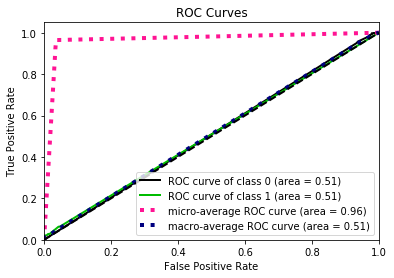

AUC score:  0.5088


In [49]:
check_covariate_shift(X_tr_500, X_test_9_4_2)

train2 shape:  (9191, 2916)  test2 shape:  (3939, 2916)


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\ensemble\forest.py:245: FutureWarning: The default value of n_estimators will change from 10 in version 0.20 to 100 in 0.22.
  "10 in version 0.20 to 100 in 0.22.", FutureWarning)


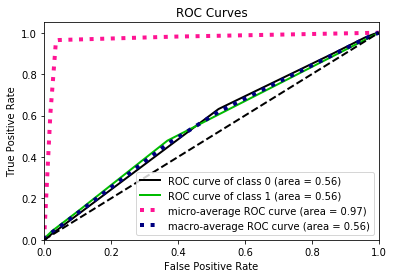

AUC score:  0.5569


In [47]:
check_covariate_shift(X_tr_500, X_test_9_4_2)

train2 shape:  (500, 2917)  test2 shape:  (12630, 2917)


C:\Users\Martins-Lapt\AppData\Local\conda\conda\envs\python36\lib\site-packages\sklearn\svm\base.py:193: FutureWarning: The default value of gamma will change from 'auto' to 'scale' in version 0.22 to account better for unscaled features. Set gamma explicitly to 'auto' or 'scale' to avoid this warning.
  "avoid this warning.", FutureWarning)


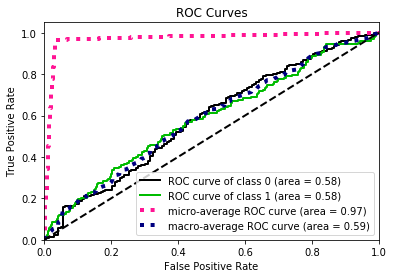

AUC score:  0.5849


In [44]:
check_covariate_shift(X_tr_500, X_test_9_4_2)


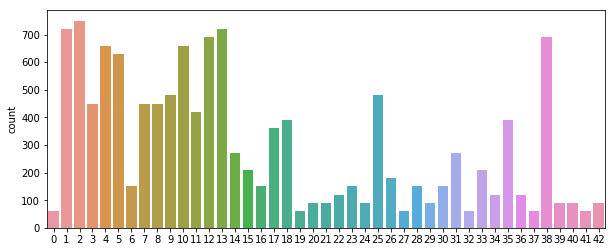

In [21]:
fig = plt.figure(figsize=(10,4))
fig.autofmt_xdate = sns.countplot(y_test, order=['0','1','2','3','4','5','6','7','8','9','10','11',
                            '12','13','14','15','16','17','18','19','20','21',
                            '22','23','24','25','26','27','28','29','30','31',
                            '32','33','34','35','36','37','38','39','40','41',
                            '42'])
fig.autofmt_xdate.figure.savefig("distribution_test_data_gtsrb.png")

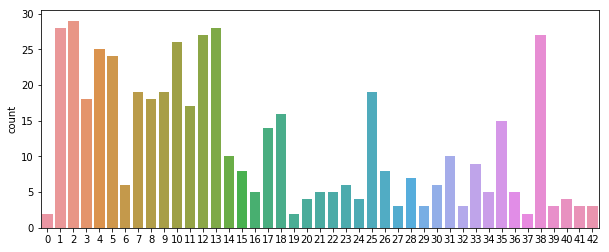

In [20]:
plt.figure(figsize=(10,4))
fig.autofmt_xdate = sns.countplot(y_tr_500, order=['0','1','2','3','4','5','6','7','8','9','10','11',
                            '12','13','14','15','16','17','18','19','20','21',
                            '22','23','24','25','26','27','28','29','30','31',
                            '32','33','34','35','36','37','38','39','40','41',
                            '42'])
#fig.autofmt_xdate.figure.savefig("stratified_distribution_500_gtsrb.png")

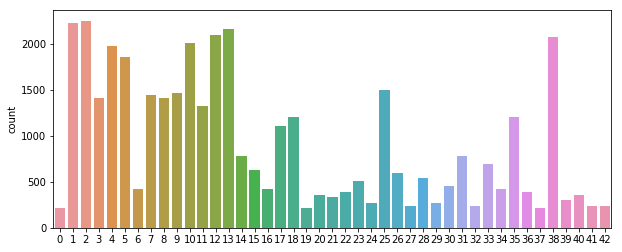

In [30]:
plt.figure(figsize=(10,4))
fig.autofmt_xdate = sns.countplot(y_tr, order=['0','1','2','3','4','5','6','7','8','9','10','11',
                            '12','13','14','15','16','17','18','19','20','21',
                            '22','23','24','25','26','27','28','29','30','31',
                            '32','33','34','35','36','37','38','39','40','41',
                            '42'])
fig.autofmt_xdate.figure.savefig("stratified_distribution_39209_gtsrb.png")

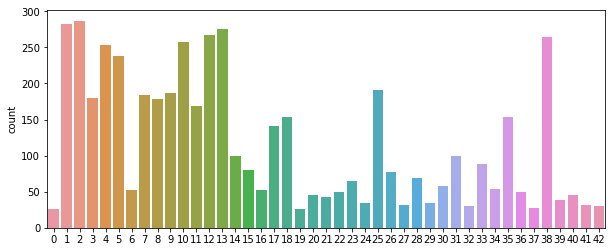

In [31]:
plt.figure(figsize=(10,4))
fig.autofmt_xdate = sns.countplot(y_tr_5000, order=['0','1','2','3','4','5','6','7','8','9','10','11',
                            '12','13','14','15','16','17','18','19','20','21',
                            '22','23','24','25','26','27','28','29','30','31',
                            '32','33','34','35','36','37','38','39','40','41',
                            '42'])
fig.autofmt_xdate.figure.savefig("stratified_distribution_5000_gtsrb.png")

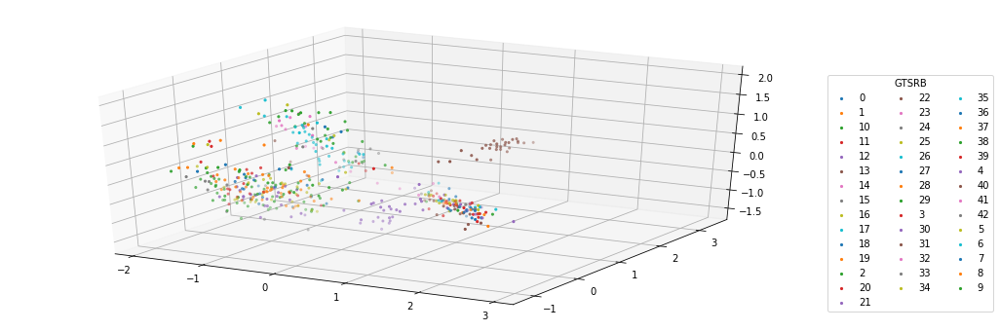

In [15]:
from mpl_toolkits.mplot3d import Axes3D
p = PCA(n_components=3)
p.fit(X_tr_500)
X_test_transformed = p.transform(X_tr_500)

fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_tr_500):
    X_test_transformed_filtered = X_test_transformed[y_tr_500==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_500.png")

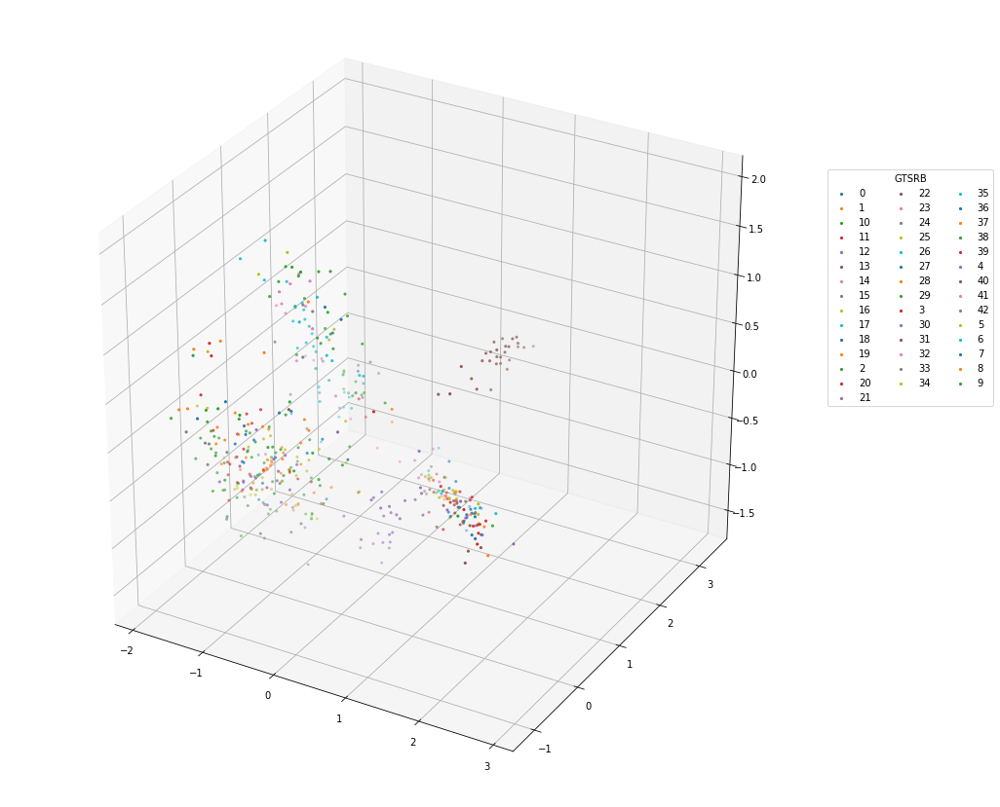

In [45]:
p = PCA(n_components=3)
p.fit(X_tr_500)
X_test_transformed = p.transform(X_tr_500)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_tr_500):
    X_test_transformed_filtered = X_test_transformed[y_tr_500==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_500_15.png")

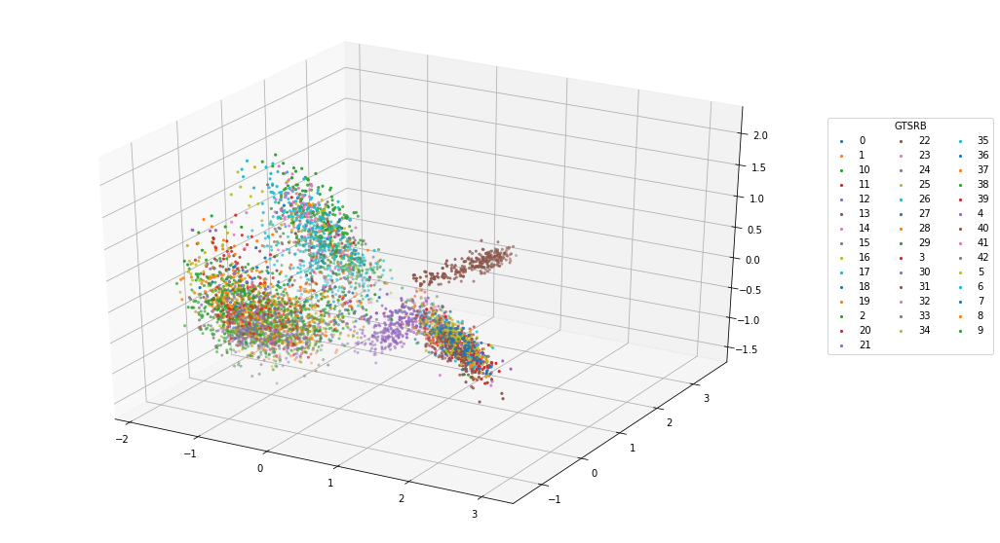

In [41]:
from mpl_toolkits.mplot3d import Axes3D
p = PCA(n_components=3)
p.fit(X_tr_5000)
X_test_transformed = p.transform(X_tr_5000)

fig = plt.figure(figsize=(15,10))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_tr_5000):
    X_test_transformed_filtered = X_test_transformed[y_tr_5000==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
#fig.savefig("plot_5000.png")

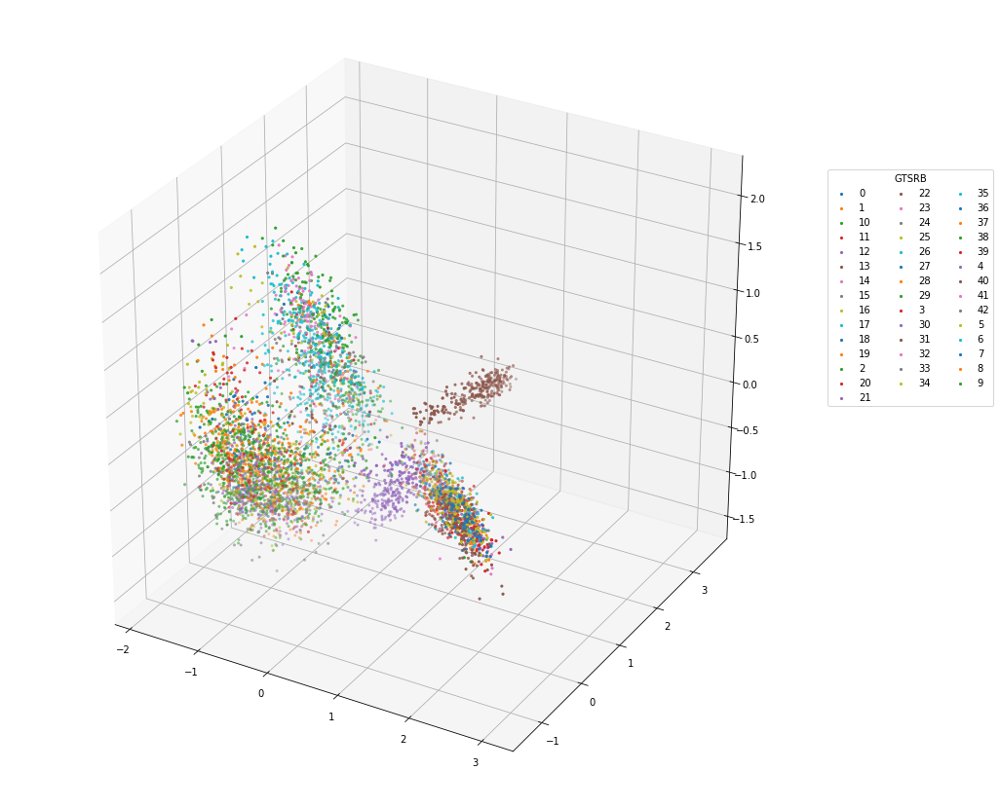

In [44]:
p = PCA(n_components=3)
p.fit(X_tr_5000)
X_test_transformed = p.transform(X_tr_5000)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_tr_5000):
    X_test_transformed_filtered = X_test_transformed[y_tr_5000==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_5000_15.png")

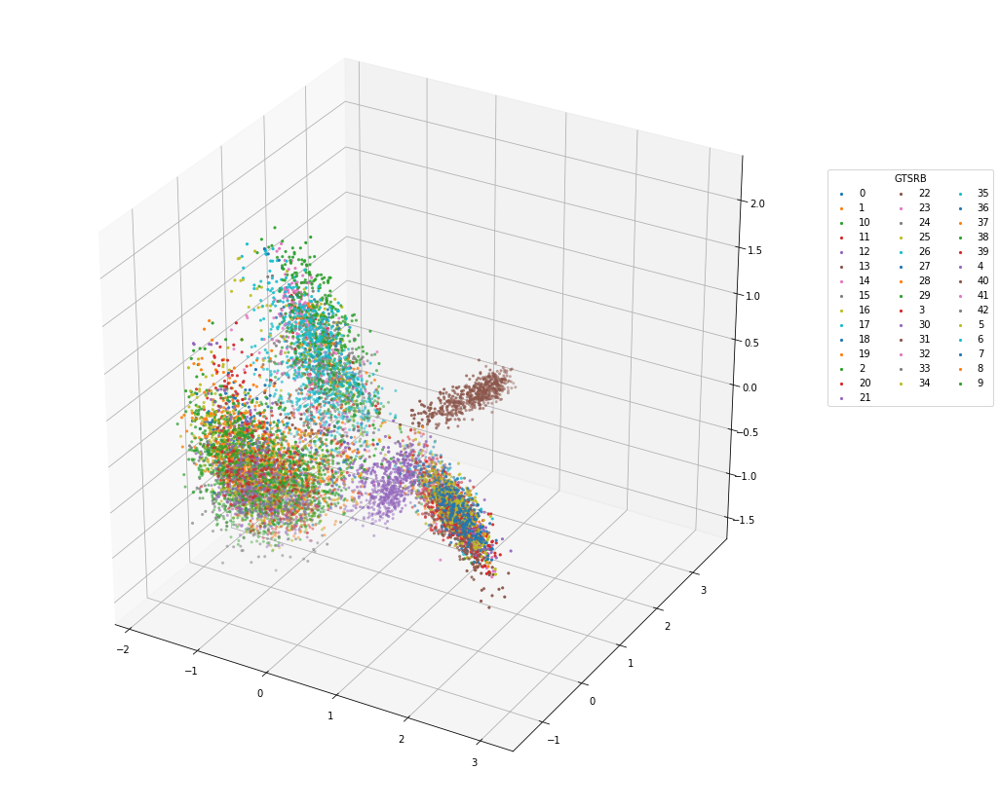

In [46]:
p = PCA(n_components=3)
p.fit(X_tr_10000)
X_test_transformed = p.transform(X_tr_10000)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_tr_10000):
    X_test_transformed_filtered = X_test_transformed[y_tr_10000==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_10000_15.png")

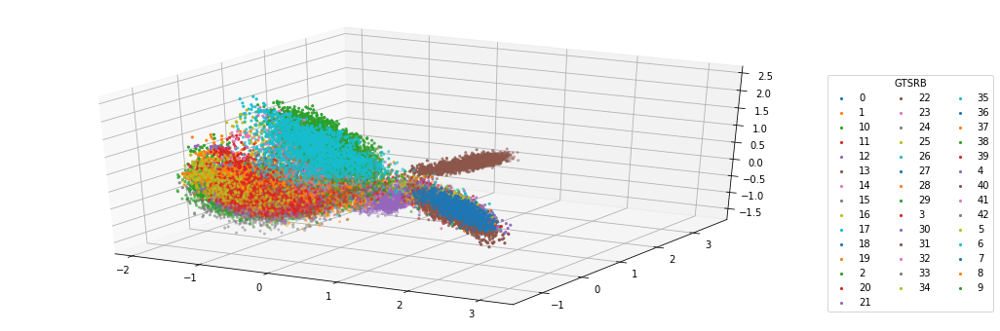

In [16]:
from mpl_toolkits.mplot3d import Axes3D
p = PCA(n_components=3)
p.fit(X_train_9_4_2)
X_test_transformed = p.transform(X_train_9_4_2)

fig = plt.figure(figsize=(15,6))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_train):
    X_test_transformed_filtered = X_test_transformed[y_train==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_39209.png")

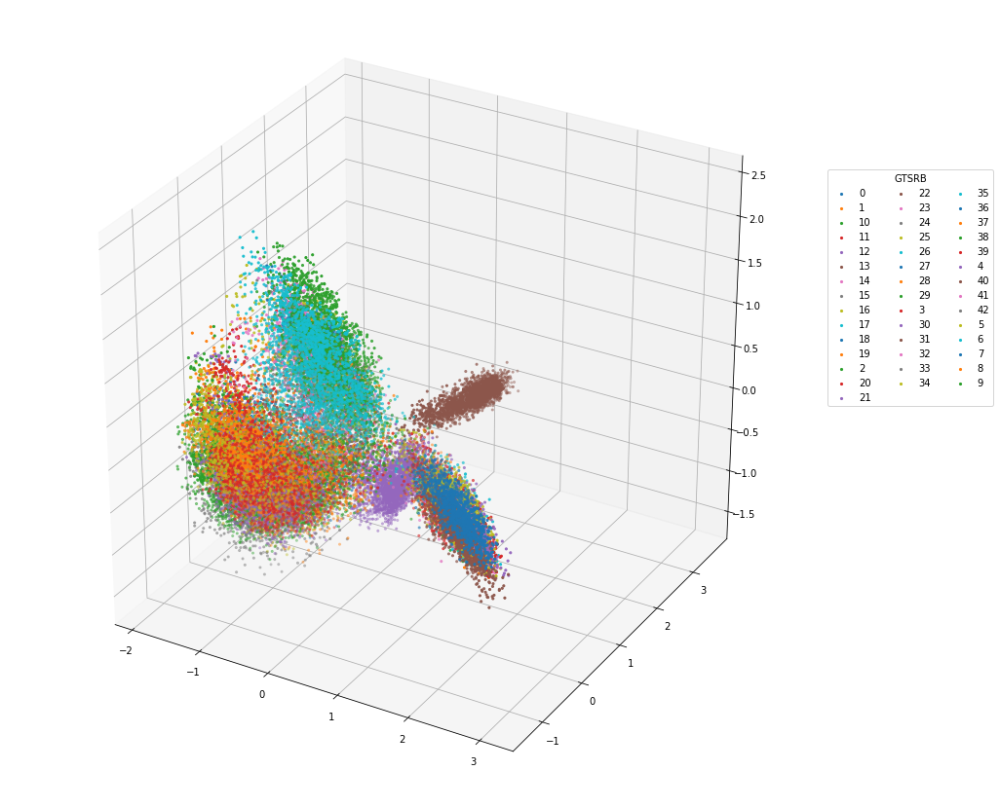

In [43]:
from mpl_toolkits.mplot3d import Axes3D
p = PCA(n_components=3)
p.fit(X_train_9_4_2)
X_test_transformed = p.transform(X_train_9_4_2)

fig = plt.figure(figsize=(15,15))
ax = fig.add_subplot(111, projection='3d')
for activity in np.unique(y_train):
    X_test_transformed_filtered = X_test_transformed[y_train==activity, :]
    ax.scatter(X_test_transformed_filtered[:, 0],
              X_test_transformed_filtered[:, 1],
              X_test_transformed_filtered[:,2],
              label = activity,
              s=4.5)
plt.legend(bbox_to_anchor=(1, 0.8), loc='upper left', title="GTSRB", ncol=3)
plt.show()
fig.savefig("plot_39209_15.png")